# **Trabajo Final - FIC**
# **Predicción de Variables Críticas en Cultivos de Aguacate**
Integrantes:
- Juan Fernando Muñoz López
- Manuela Gutiérrez Rodríguez

**Librerías**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from google.colab import files
import xgboost as xgb
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler

In [ ]:
uploaded = files.upload()
df_BA6   = pd.read_excel("DB_CropX_Aguacate.xlsx", sheet_name='CropX_BA6')
df_BA20  = pd.read_excel("DB_CropX_Aguacate.xlsx", sheet_name='CropX_BA20')
df_BA29  = pd.read_excel("DB_CropX_Aguacate.xlsx", sheet_name='CropX_BA29')

# Asegurarnos de convertir la columna de tiempo a datetime (si es que no lo está)
for df in [df_BA6, df_BA20, df_BA29]:
    if 'Time' in df.columns:
        df['Time'] = pd.to_datetime(df['Time'])


Saving DB_CropX_Aguacate.xlsx to DB_CropX_Aguacate.xlsx


# **Pre Procesamiento**

## **Comportamiento Variables**

### **Cultivo 6**

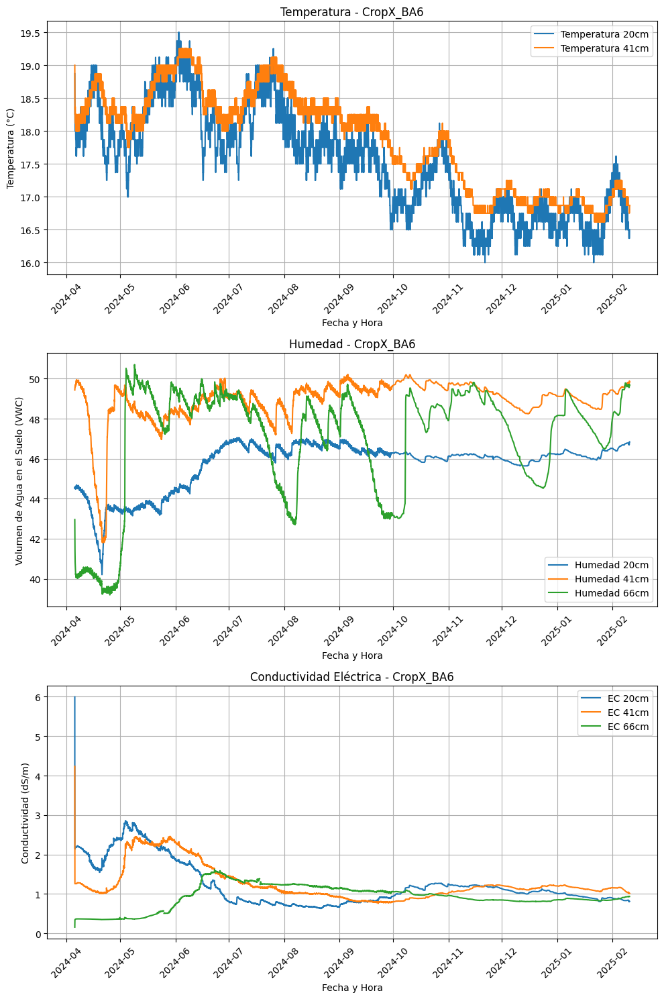

In [ ]:
# 1. Temperatura (20 cm y 41 cm)
plt.figure(figsize=(10, 15))

plt.subplot(3,1,1)
plt.plot(df_BA6['Fecha_Hora'], df_BA6['Temp(C)-20cm'], label='Temperatura 20cm')
plt.plot(df_BA6['Fecha_Hora'], df_BA6['Temp(C)-41cm'], label='Temperatura 41cm')
plt.title('Temperatura - CropX_BA6')
plt.xlabel('Fecha y Hora')
plt.ylabel('Temperatura (°C)')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)

# 2. Humedad (20 cm y 41 cm)
plt.subplot(3,1,2)
plt.plot(df_BA6['Fecha_Hora'], df_BA6['VWC-20cm'], label='Humedad 20cm')
plt.plot(df_BA6['Fecha_Hora'], df_BA6['VWC-41cm'], label='Humedad 41cm')
plt.plot(df_BA6['Fecha_Hora'], df_BA6['VWC-66cm'], label='Humedad 66cm')
plt.title('Humedad - CropX_BA6')
plt.xlabel('Fecha y Hora')
plt.ylabel('Volumen de Agua en el Suelo (VWC)')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)

# 3. Conductividad (20 cm y 41 cm)
plt.subplot(3,1,3)
plt.plot(df_BA6['Fecha_Hora'], df_BA6['EC(dS/m)-20cm'], label='EC 20cm')
plt.plot(df_BA6['Fecha_Hora'], df_BA6['EC(dS/m)-41cm'], label='EC 41cm')
plt.plot(df_BA6['Fecha_Hora'], df_BA6['EC(dS/m)-66cm'], label='EC 66cm')
plt.title('Conductividad Eléctrica - CropX_BA6')
plt.xlabel('Fecha y Hora')
plt.ylabel('Conductividad (dS/m)')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()


### **Cultivo 20**

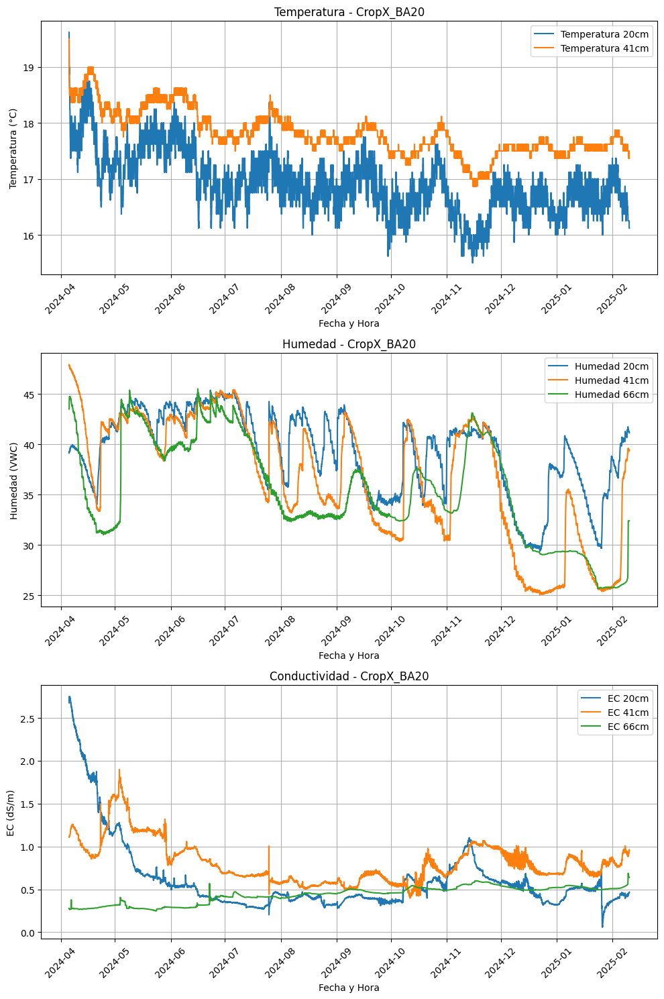

In [ ]:
# -------------------------------
# Gráfica de Temperatura (2 distancias)
plt.figure(figsize=(10, 15))

plt.subplot(3,1,1)
plt.plot(df_BA20['Fecha_Hora'], df_BA20['Temp(C)-20cm'], label='Temperatura 20cm')
plt.plot(df_BA20['Fecha_Hora'], df_BA20['Temp(C)-41cm'], label='Temperatura 41cm')
plt.title('Temperatura - CropX_BA20')
plt.xlabel('Fecha y Hora')
plt.ylabel('Temperatura (°C)')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)


# -------------------------------
# Gráfica de Humedad (3 distancias)
plt.subplot(3,1,2)
plt.plot(df_BA20['Fecha_Hora'], df_BA20['VWC-20cm'], label='Humedad 20cm')
plt.plot(df_BA20['Fecha_Hora'], df_BA20['VWC-41cm'], label='Humedad 41cm')
plt.plot(df_BA20['Fecha_Hora'], df_BA20['VWC-66cm'], label='Humedad 66cm')
plt.title('Humedad - CropX_BA20')
plt.xlabel('Fecha y Hora')
plt.ylabel('Humedad (VWC)')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)

# -------------------------------
# Gráfica de Conductividad (3 distancias)
plt.subplot(3,1,3)
plt.plot(df_BA20['Fecha_Hora'], df_BA20['EC(dS/m)-20cm'], label='EC 20cm')
plt.plot(df_BA20['Fecha_Hora'], df_BA20['EC(dS/m)-41cm'], label='EC 41cm')
plt.plot(df_BA20['Fecha_Hora'], df_BA20['EC(dS/m)-66cm'], label='EC 66cm')
plt.title('Conductividad - CropX_BA20')
plt.xlabel('Fecha y Hora')
plt.ylabel('EC (dS/m)')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

### **Cultivo 29**

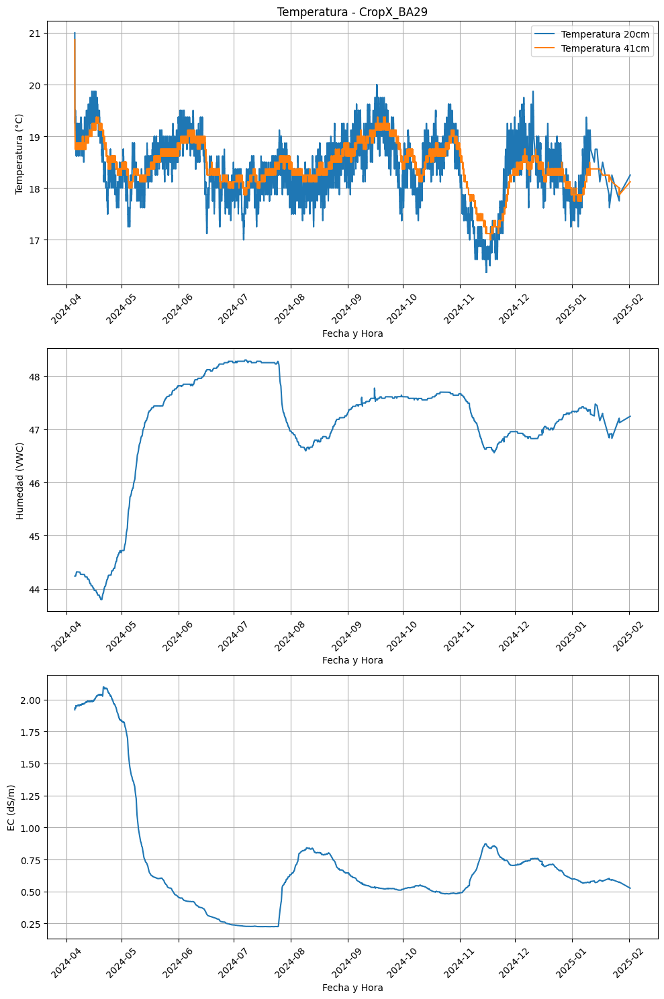

<Figure size 640x480 with 0 Axes>

In [ ]:
plt.figure(figsize=(10, 15))

plt.subplot(3,1,1)
plt.plot(df_BA29['Fecha_Hora'], df_BA29['Temp(C)-20cm'], label='Temperatura 20cm')
plt.plot(df_BA29['Fecha_Hora'], df_BA29['Temp(C)-41cm'], label='Temperatura 41cm')
plt.title('Temperatura - CropX_BA29')
plt.xlabel('Fecha y Hora')
plt.ylabel('Temperatura (°C)')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)


# -------------------------------
# Gráfica de Humedad (2 distancias)
plt.subplot(3,1,2)
plt.plot(df_BA29['Fecha_Hora'], df_BA29['VWC-20cm'], label='Humedad 20cm')
#plt.title('Humedad - CropX_BA29')
plt.xlabel('Fecha y Hora')
plt.ylabel('Humedad (VWC)')
#plt.legend()
plt.grid(True)
plt.xticks(rotation=45)


# -------------------------------
# Gráfica de Conductividad (2 distancias)
plt.subplot(3,1,3)
plt.plot(df_BA29['Fecha_Hora'], df_BA29['EC(dS/m)-20cm'], label='EC 20cm')
#plt.title('Conductividad - CropX_BA29')
plt.xlabel('Fecha y Hora')
plt.ylabel('EC (dS/m)')
#plt.legend()
plt.grid(True)
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

plt.savefig("Tiempo29.png")

### **b) Gráficas de líneas con bandas de variación**
Muestra media ± desviación estándar diaria/semanal.

In [ ]:
def resample_media(df, columnas, modo='D', plot=False, titulo=None):
    """
    df: DataFrame con columna 'Fecha_Hora'
    columnas: lista de nombres de columna a procesar
    modo: 'D' diario, 'W' semanal, 'M' mensual, etc. (ver .resample)
    plot: si True, dibuja un gráfico de líneas con las medias
    titulo: título de la figura (si plot=True)

    Retorna:
      tiempo: DatetimeIndex con los puntos de resampleo
      medias: DataFrame con las medias de cada columna
    """
    # --- Prepara el índice temporal ---
    df2 = df.copy()
    df2['Fecha_Hora'] = pd.to_datetime(df2['Fecha_Hora'])
    df2 = df2.set_index('Fecha_Hora')

    # --- Calcular medias ---
    medias = df2[columnas].resample(modo).mean()
    tiempo = medias.index

    # --- Graficar (opcional) ---
    if plot:
        plt.figure(figsize=(10, 5))
        for col in columnas:
            plt.plot(tiempo, medias[col], label=col)
        plt.title(titulo or f'Media Resampleo ({modo})')
        plt.xlabel('Fecha')
        plt.ylabel('Valor medio')
        plt.grid(True)
        plt.legend()
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

    return tiempo, medias


#### **Cultivo 6**

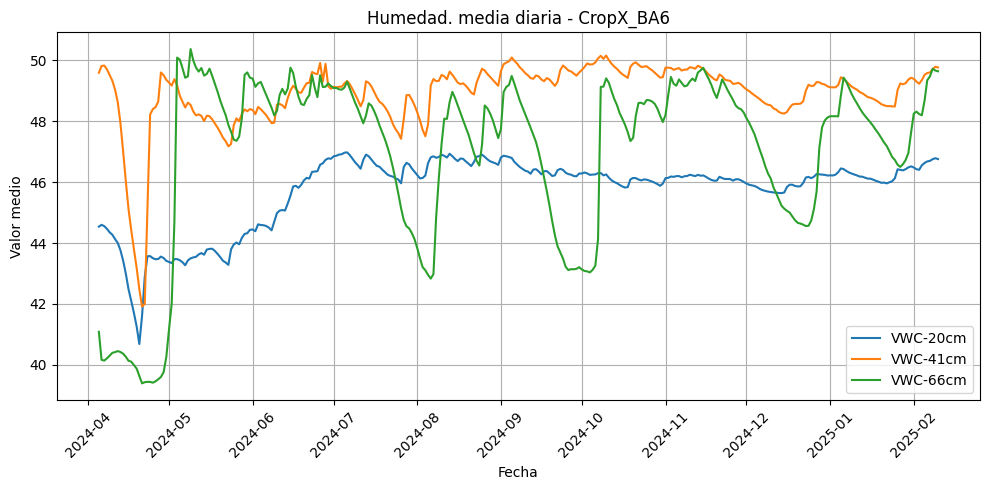

In [ ]:
columnas_humedad      = ['VWC-20cm','VWC-41cm','VWC-66cm']
columnas_temperatura  = ['Temp(C)-20cm','Temp(C)-41cm']
columnas_conductividad= ['EC(dS/m)-20cm','EC(dS/m)-41cm','EC(dS/m)-66cm']

tiempo_h6, medias_h6   = resample_media(df_BA6, columnas_humedad,       modo='D', plot=True, titulo='Humedad. media diaria - CropX_BA6')

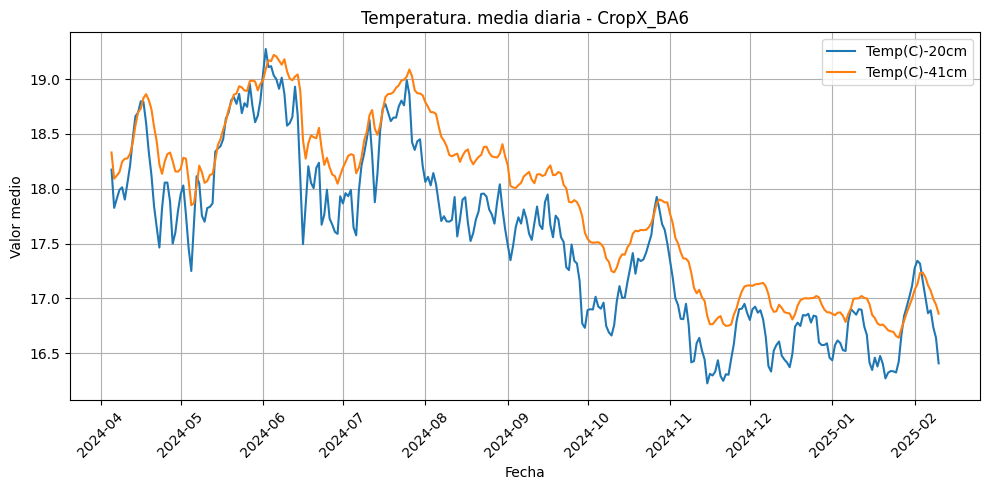

In [ ]:
tiempo_t6, medias_t6   = resample_media(df_BA6, columnas_temperatura,   modo='D', plot=True,titulo='Temperatura. media diaria - CropX_BA6')

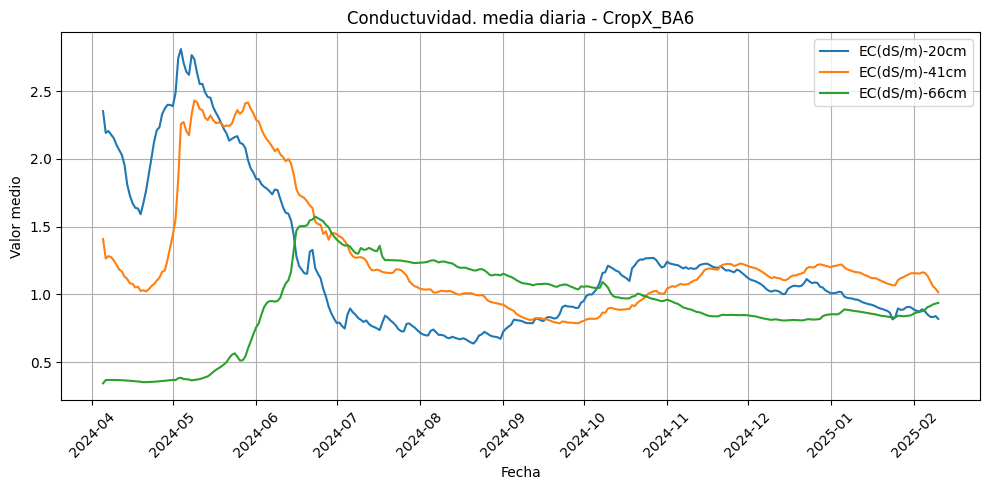

In [ ]:
tiempo_ec6, medias_ec6 = resample_media(df_BA6, columnas_conductividad, modo='D', plot=True, titulo='Conductuvidad. media diaria - CropX_BA6')

In [ ]:
df_crop6 = pd.concat([medias_h6, medias_t6, medias_ec6], axis=1)
df_crop6

,VWC-20cm,VWC-41cm,VWC-66cm,Temp(C)-20cm,Temp(C)-41cm,EC(dS/m)-20cm,EC(dS/m)-41cm,EC(dS/m)-66cm
Fecha_Hora,,,,,,,,
2024-04-05,44.538011,49.594996,41.081975,18.174762,18.330952,2.353012,1.408472,0.343098
2024-04-06,44.597299,49.817705,40.162521,17.825833,18.091458,2.192331,1.264748,0.367106
2024-04-07,44.554720,49.830302,40.136302,17.910638,18.120213,2.206574,1.282473,0.368525
2024-04-08,44.464413,49.705181,40.212241,17.990000,18.152708,2.180174,1.275133,0.368506
2024-04-09,44.350431,49.522528,40.298646,18.013125,18.246875,2.153603,1.250560,0.368254
...,...,...,...,...,...,...,...,...
2025-02-06,46.680846,49.586466,49.348912,16.865532,17.120426,0.851889,1.137008,0.905916
2025-02-07,46.698408,49.602599,49.473780,16.891875,17.072500,0.834912,1.101162,0.912947
2025-02-08,46.755785,49.710278,49.726531,16.736458,16.994583,0.832688,1.060237,0.926001


#### **Cultivo 20**

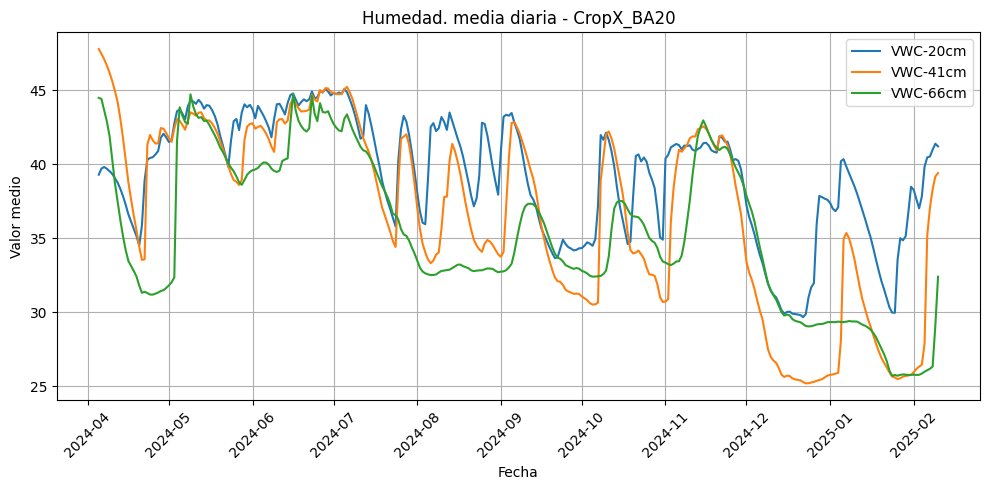

In [ ]:
columnas_humedad      = ['VWC-20cm', 'VWC-41cm', 'VWC-66cm']
columnas_temperatura  = ['Temp(C)-20cm','Temp(C)-41cm']
columnas_conductividad= ['EC(dS/m)-20cm','EC(dS/m)-41cm','EC(dS/m)-66cm']

tiempo_h20, medias_h20   = resample_media(df_BA20, columnas_humedad,       modo='D', plot=True, titulo='Humedad. media diaria - CropX_BA20')

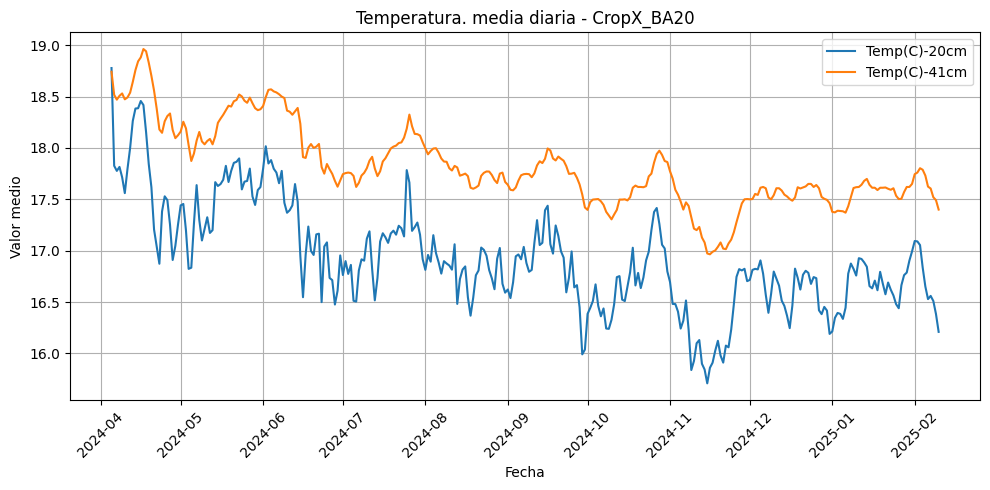

In [ ]:
tiempo_t20, medias_t20   = resample_media(df_BA20, columnas_temperatura,   modo='D', plot=True,titulo='Temperatura. media diaria - CropX_BA20')

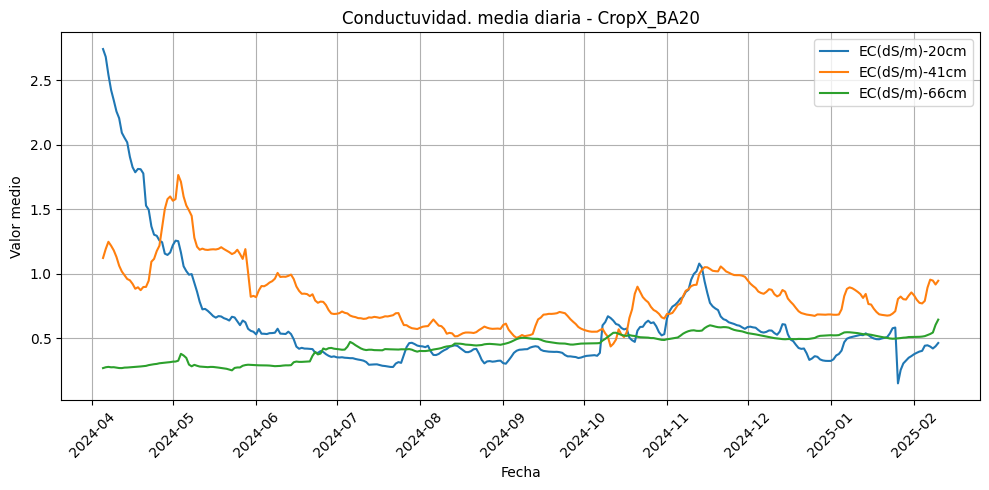

In [ ]:
tiempo_ec20, medias_ec20 = resample_media(df_BA20, columnas_conductividad, modo='D', plot=True, titulo='Conductuvidad. media diaria - CropX_BA20')

In [ ]:
df_crop20 = pd.concat([medias_h20, medias_t20, medias_ec20], axis=1)
df_crop20

,VWC-20cm,VWC-41cm,VWC-66cm,Temp(C)-20cm,Temp(C)-41cm,EC(dS/m)-20cm,EC(dS/m)-41cm,EC(dS/m)-66cm
Fecha_Hora,,,,,,,,
2024-04-05,39.285229,47.773357,44.473329,18.777143,18.740952,2.741171,1.121344,0.267638
2024-04-06,39.696259,47.452647,44.399977,17.826042,18.516458,2.680994,1.190814,0.274152
2024-04-07,39.804815,47.091016,43.629669,17.776458,18.469792,2.542214,1.246906,0.277098
2024-04-08,39.684886,46.664220,42.887155,17.815000,18.506875,2.423726,1.216383,0.273939
2024-04-09,39.524220,46.172363,41.908445,17.714167,18.530000,2.343443,1.180154,0.274587
...,...,...,...,...,...,...,...,...
2025-02-06,40.452115,35.191061,26.072883,16.528958,17.623542,0.444361,0.891377,0.523572
2025-02-07,40.510971,37.046442,26.170300,16.560000,17.605000,0.434869,0.953229,0.531934
2025-02-08,40.976929,38.299722,26.325145,16.510625,17.520000,0.419701,0.946215,0.543355


#### **Cultivo 29**

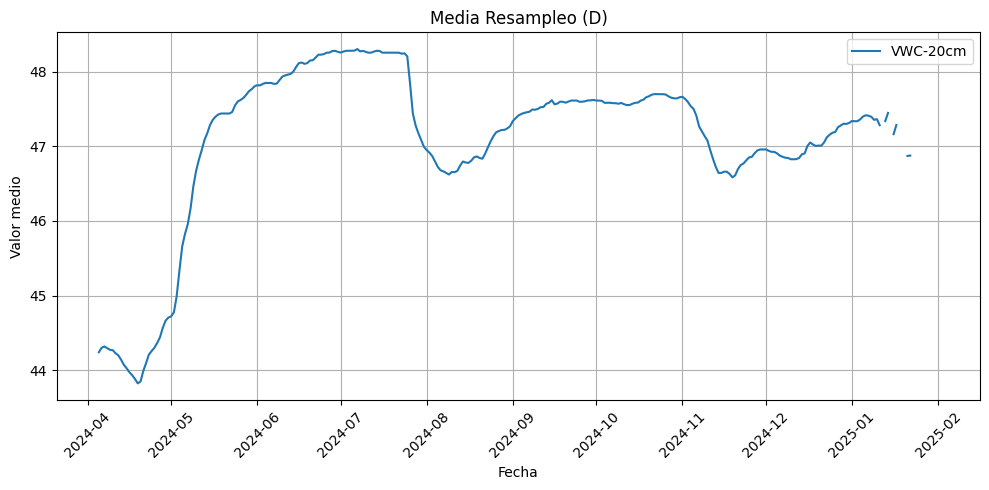

In [ ]:
columnas_humedad      = ['VWC-20cm']
columnas_temperatura  = ['Temp(C)-20cm','Temp(C)-41cm']
columnas_conductividad= ['EC(dS/m)-20cm']

tiempo_h29, medias_h29   = resample_media(df_BA29, columnas_humedad, modo='D', plot=True)


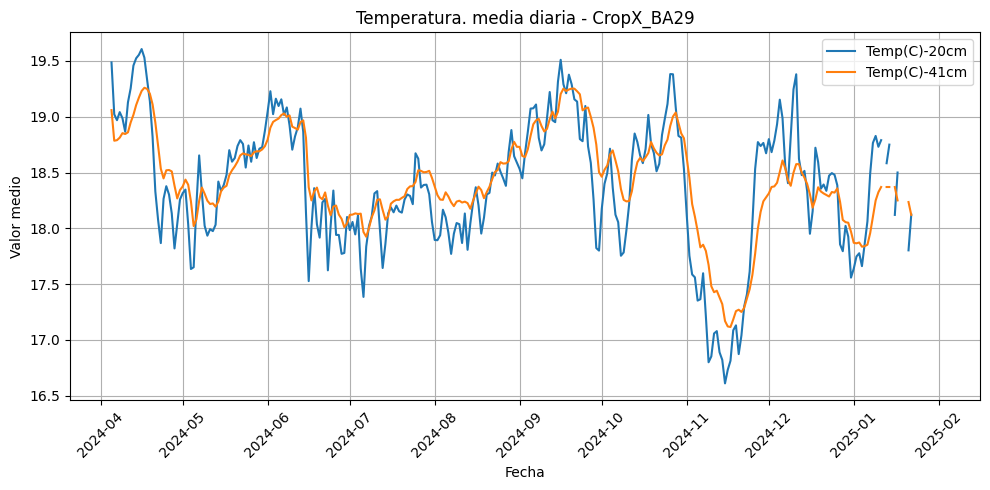

In [ ]:
tiempo_t29, medias_t29   = resample_media(df_BA29, columnas_temperatura,   modo='D', plot=True,titulo='Temperatura. media diaria - CropX_BA29')

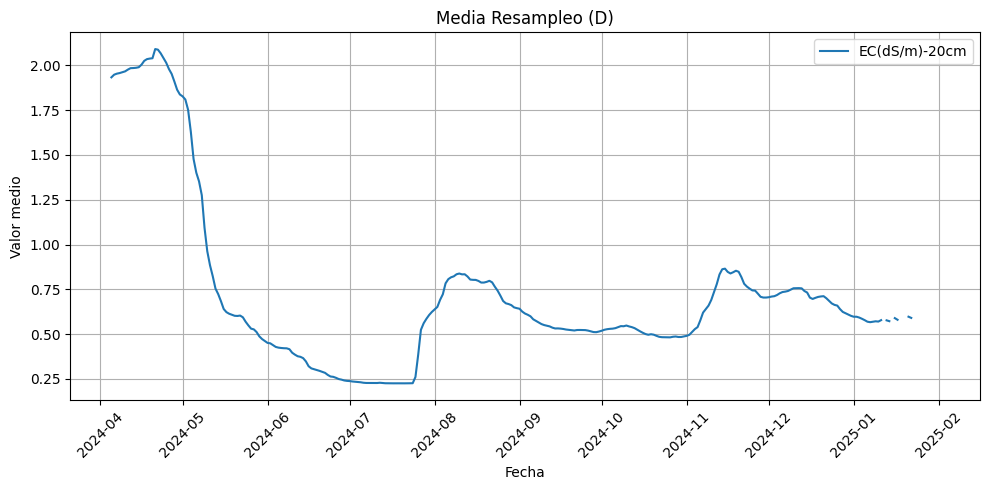

In [ ]:
tiempo_ec29, medias_ec29 = resample_media(df_BA29, columnas_conductividad, modo='D', plot=True)

In [ ]:
df_crop29 = pd.concat([medias_h29, medias_t29, medias_ec29], axis=1)
df_crop29

,VWC-20cm,Temp(C)-20cm,Temp(C)-41cm,EC(dS/m)-20cm
Fecha_Hora,,,,
2024-04-05,44.240221,19.486818,19.059545,1.933088
2024-04-06,44.300684,19.021667,18.785000,1.947882
2024-04-07,44.317772,18.969167,18.790000,1.953687
2024-04-08,44.294766,19.041458,18.812500,1.956965
2024-04-09,44.272687,18.986458,18.852917,1.961371
...,...,...,...,...
2025-01-28,NaN,NaN,NaN,NaN
2025-01-29,NaN,NaN,NaN,NaN
2025-01-30,NaN,NaN,NaN,NaN


### **c) Diagramas de violín o boxplots por día**

In [ ]:
def plot_boxplot_medias(tiempo, medias, titulo):
    """
    Dibuja un boxplot de las series de medias.

    tiempo : DatetimeIndex (no se usa directamente en el boxplot)
    medias  : DataFrame cuyas columnas son las series de medias ya resampleadas
    titulo  : título de la figura
    """
    # Recolectamos valores no nulos para cada columna
    datos = [medias[col].dropna().values for col in medias.columns]

    plt.figure(figsize=(8, 5))
    plt.boxplot(datos, labels=medias.columns, showmeans=True)
    plt.title(titulo)
    plt.ylabel('Valor medio')
    plt.xticks(rotation=45)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()


def plot_violin_medias(tiempo, medias, titulo):
    """
    Dibuja un violinplot de las series de medias.

    tiempo : DatetimeIndex (no se usa directamente en el violinplot)
    medias  : DataFrame cuyas columnas son las series de medias ya resampleadas
    titulo  : título de la figura
    """
    # Recolectamos valores no nulos para cada columna
    datos = [medias[col].dropna().values for col in medias.columns]

    plt.figure(figsize=(8, 5))
    vp = plt.violinplot(datos, showmeans=True)
    ax = plt.gca()
    ax.set_xticks(range(1, len(medias.columns) + 1))
    ax.set_xticklabels(medias.columns, rotation=45)

    plt.title(titulo)
    plt.ylabel('Valor medio')
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()


#### **Cultivo 6**

/tmp/ipython-input-19-3776642035.py:13: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(datos, labels=medias.columns, showmeans=True)


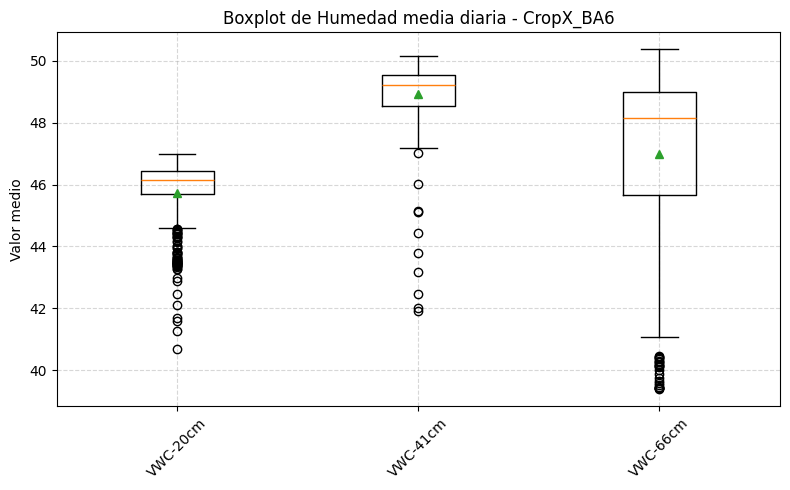

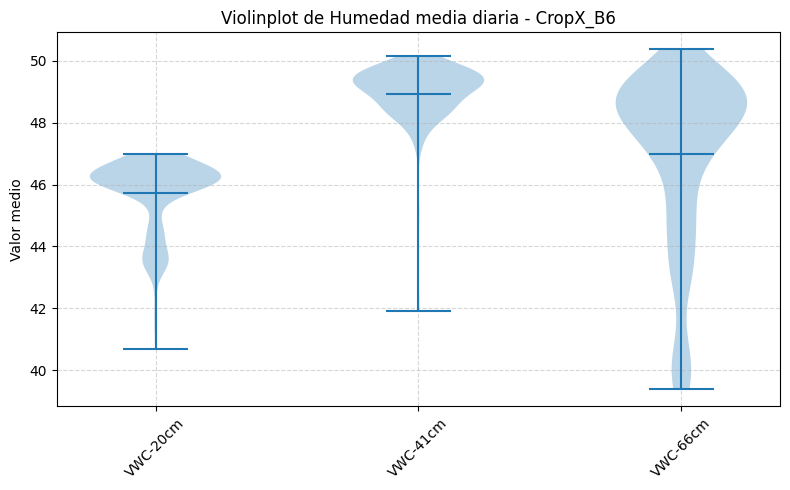

In [ ]:
plot_boxplot_medias(tiempo_h6, medias_h6, 'Boxplot de Humedad media diaria - CropX_BA6')
plot_violin_medias(tiempo_h6, medias_h6, 'Violinplot de Humedad media diaria - CropX_B6')

/tmp/ipython-input-19-3776642035.py:13: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(datos, labels=medias.columns, showmeans=True)


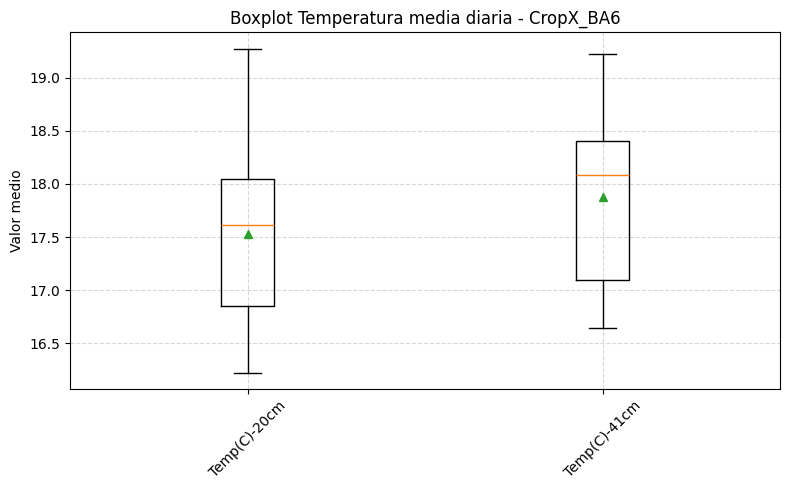

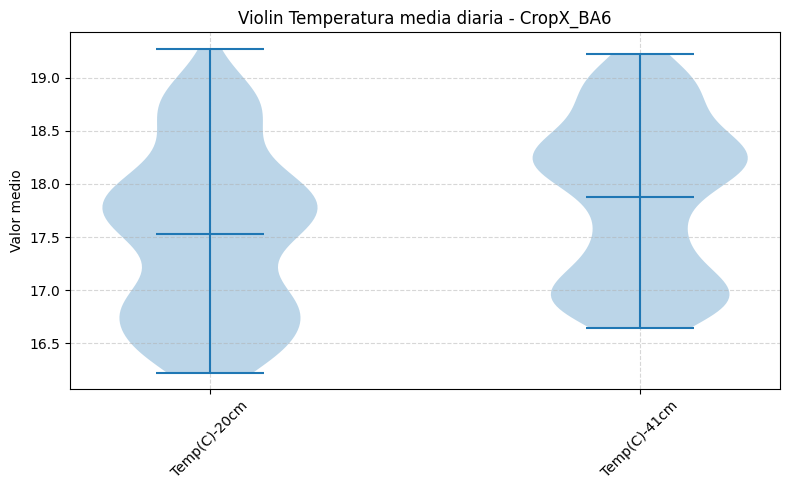

In [ ]:
plot_boxplot_medias(tiempo_t6, medias_t6, 'Boxplot Temperatura media diaria - CropX_BA6')
plot_violin_medias(tiempo_t6, medias_t6, 'Violin Temperatura media diaria - CropX_BA6')

/tmp/ipython-input-19-3776642035.py:13: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(datos, labels=medias.columns, showmeans=True)


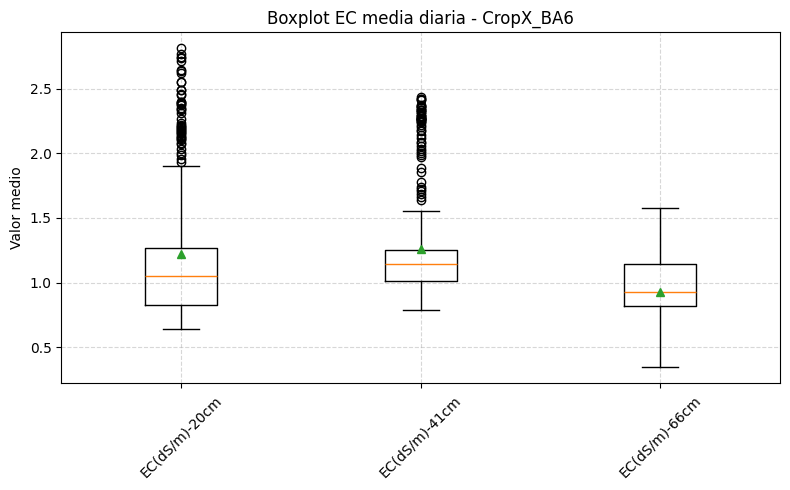

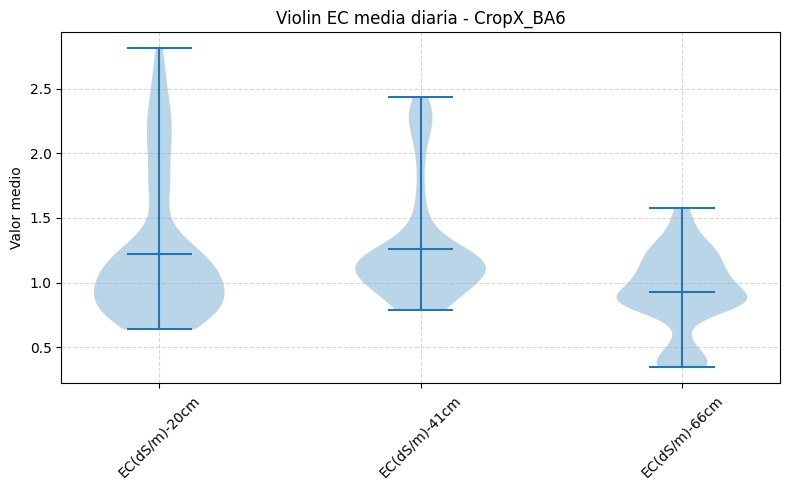

In [ ]:
plot_boxplot_medias(tiempo_ec6, medias_ec6, 'Boxplot EC media diaria - CropX_BA6')
plot_violin_medias(tiempo_ec6, medias_ec6, 'Violin EC media diaria - CropX_BA6')

#### **Cultivo 20**

/tmp/ipython-input-19-3776642035.py:13: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(datos, labels=medias.columns, showmeans=True)


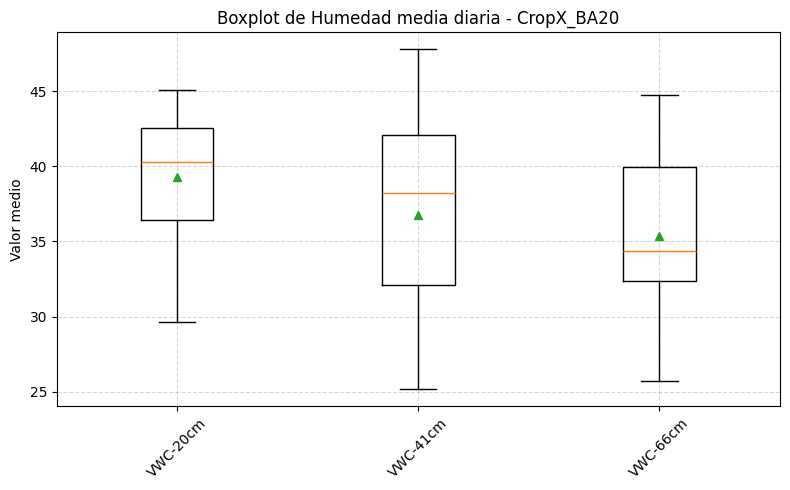

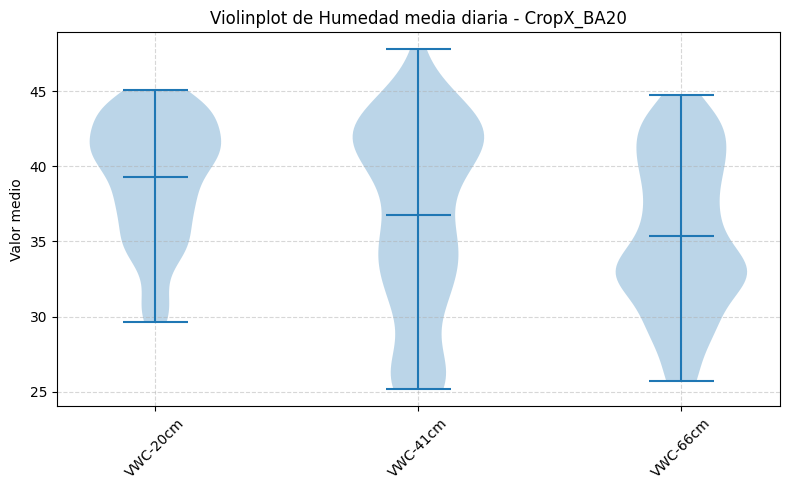

In [ ]:
plot_boxplot_medias(tiempo_h20, medias_h20, 'Boxplot de Humedad media diaria - CropX_BA20')
plot_violin_medias(tiempo_h20, medias_h20, 'Violinplot de Humedad media diaria - CropX_BA20')

/tmp/ipython-input-19-3776642035.py:13: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(datos, labels=medias.columns, showmeans=True)


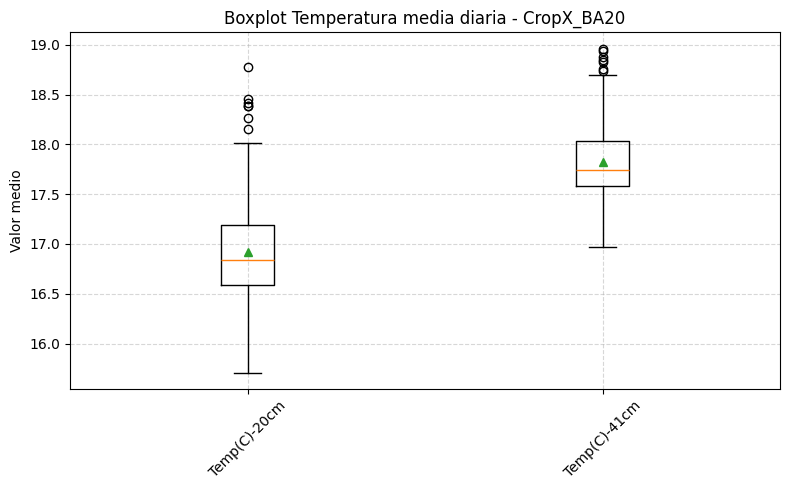

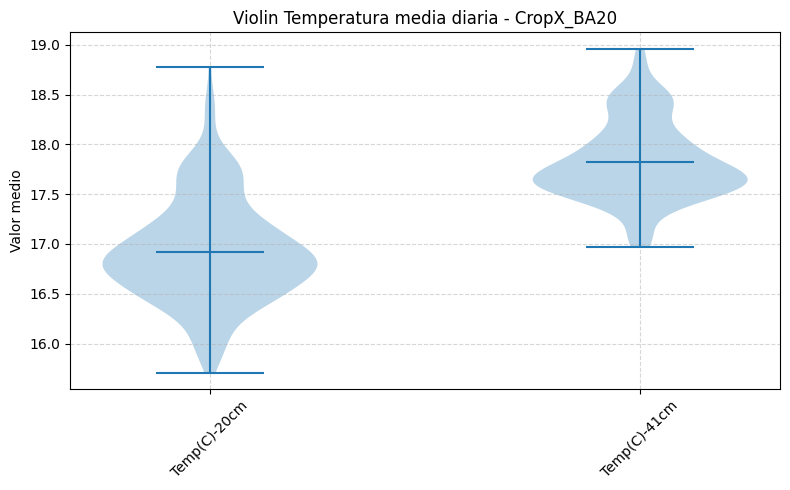

In [ ]:
plot_boxplot_medias(tiempo_t20, medias_t20, 'Boxplot Temperatura media diaria - CropX_BA20')
plot_violin_medias(tiempo_t20, medias_t20, 'Violin Temperatura media diaria - CropX_BA20')

/tmp/ipython-input-19-3776642035.py:13: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(datos, labels=medias.columns, showmeans=True)


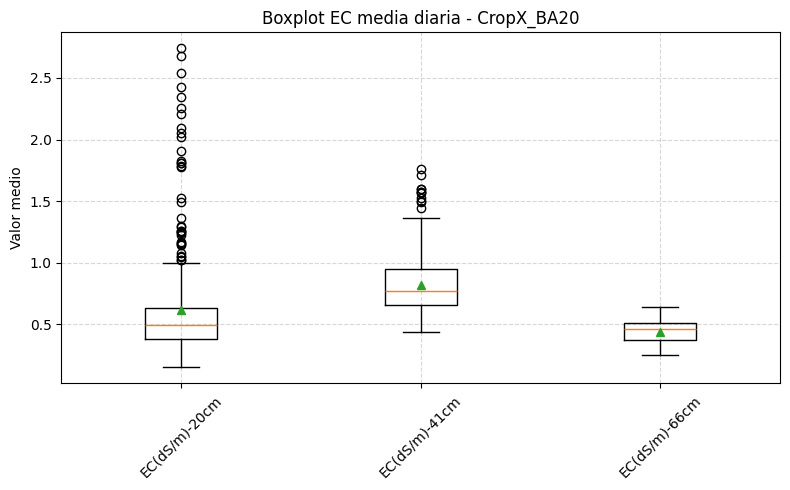

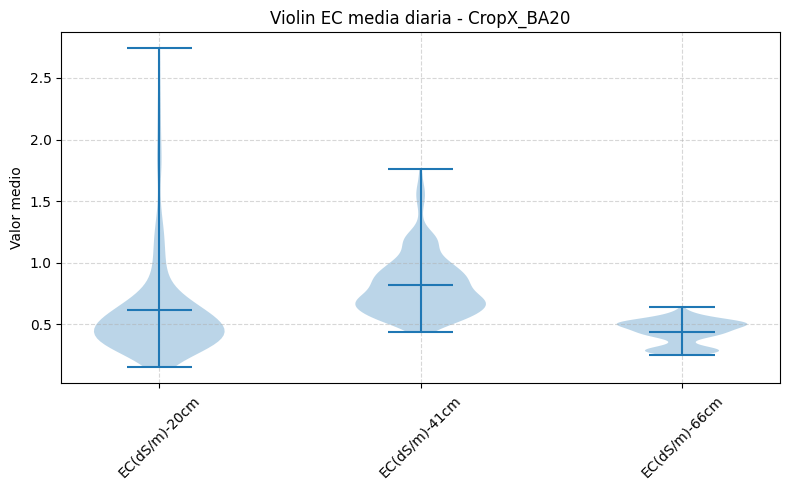

In [ ]:
plot_boxplot_medias(tiempo_ec20, medias_ec20, 'Boxplot EC media diaria - CropX_BA20')
plot_violin_medias(tiempo_ec20, medias_ec20, 'Violin EC media diaria - CropX_BA20')

#### **Cultivo 29**

/tmp/ipython-input-15-3776642035.py:13: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(datos, labels=medias.columns, showmeans=True)


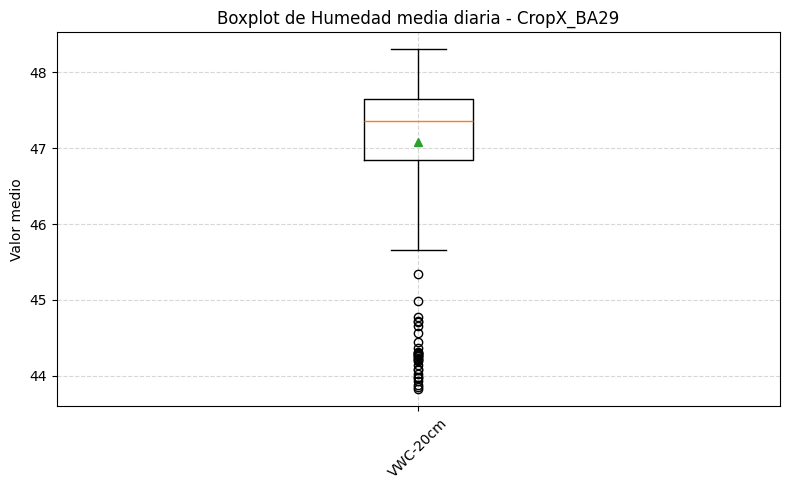

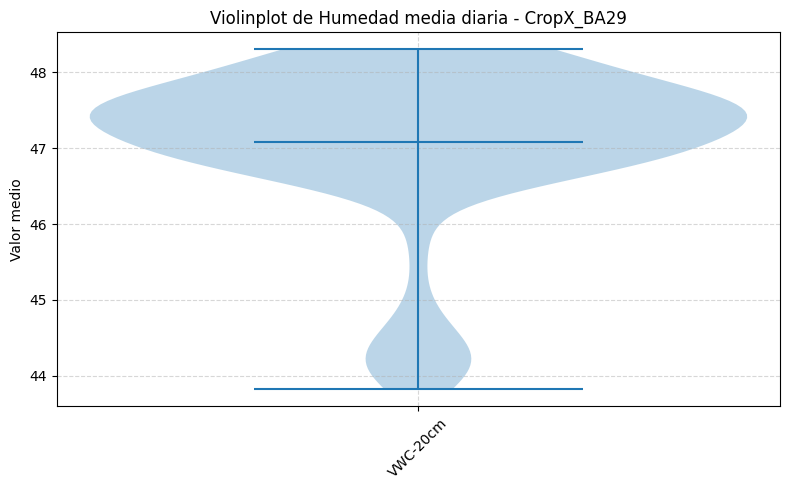

In [ ]:
plot_boxplot_medias(tiempo_h29, medias_h29, 'Boxplot de Humedad media diaria - CropX_BA29')
plot_violin_medias(tiempo_h29, medias_h29, 'Violinplot de Humedad media diaria - CropX_BA29')

/tmp/ipython-input-19-3776642035.py:13: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(datos, labels=medias.columns, showmeans=True)


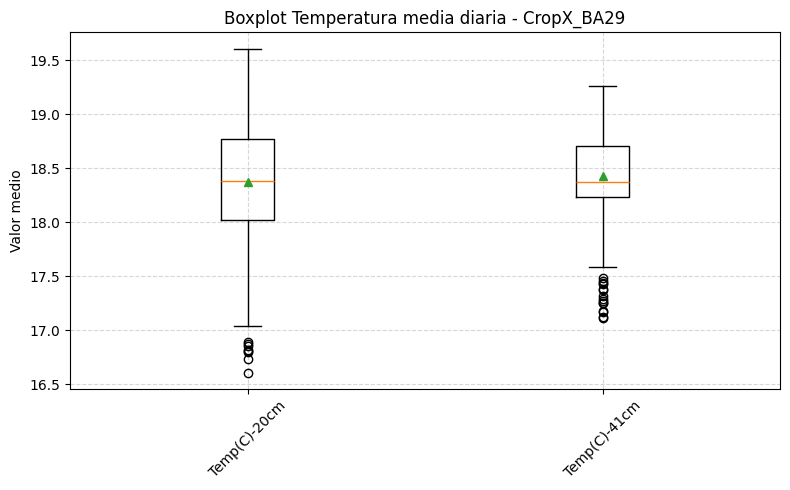

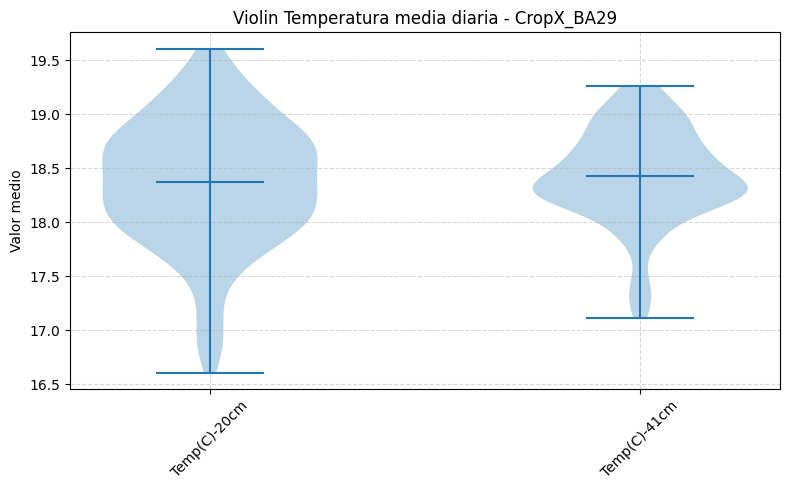

In [ ]:
plot_boxplot_medias(tiempo_t29, medias_t29, 'Boxplot Temperatura media diaria - CropX_BA29')
plot_violin_medias(tiempo_t29, medias_t29, 'Violin Temperatura media diaria - CropX_BA29')

/tmp/ipython-input-15-3776642035.py:13: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(datos, labels=medias.columns, showmeans=True)


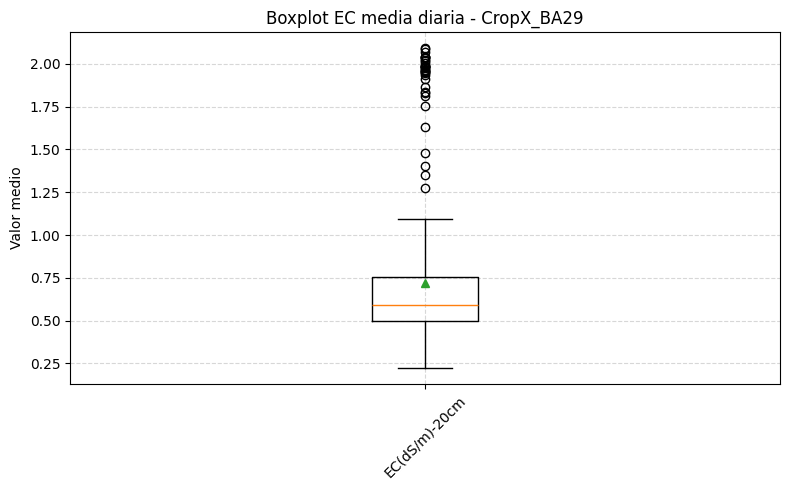

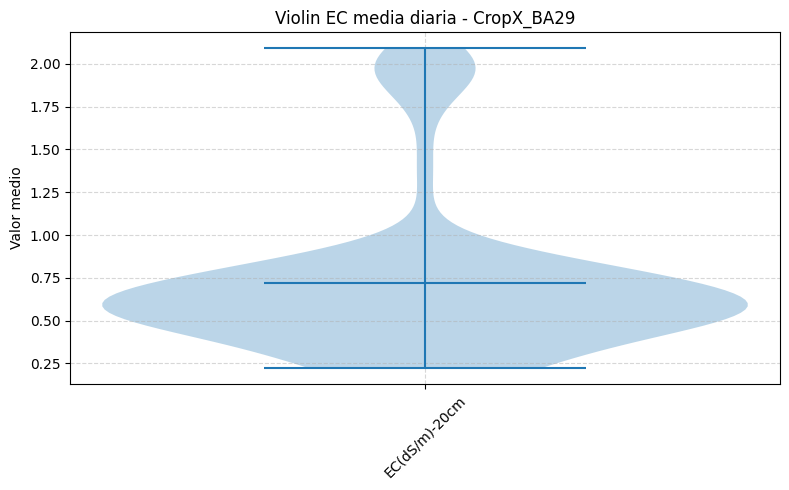

In [ ]:
plot_boxplot_medias(tiempo_ec29, medias_ec29, 'Boxplot EC media diaria - CropX_BA29')
plot_violin_medias(tiempo_ec29, medias_ec29, 'Violin EC media diaria - CropX_BA29')

#### **Boxplot por periodo - mes**

In [ ]:
tiempo_t20_m, medias_t20_m = resample_media(df_BA20, columnas_temperatura, modo='ME', plot=False)
tiempo_ec20_m, medias_t20_m = resample_media(df_BA20, columnas_conductividad, modo='ME', plot=False)

tiempo_t29_m, medias_t29_m = resample_media(df_BA29, columnas_temperatura, modo='ME', plot=False)
tiempo_ec29_m, medias_ec29_m = resample_media(df_BA29, columnas_conductividad, modo='ME', plot=False)
tiempo_h29_m, medias_h29_m = resample_media(df_BA29, columnas_humedad, modo='ME', plot=False)

tiempo_t6_m, medias_t6_m = resample_media(df_BA6, columnas_temperatura, modo='ME', plot=False)
tiempo_ec6_m, medias_t6_m = resample_media(df_BA6, columnas_conductividad, modo='ME', plot=False)


/tmp/ipython-input-30-3756768245.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(datos, labels=labels, showmeans=True)


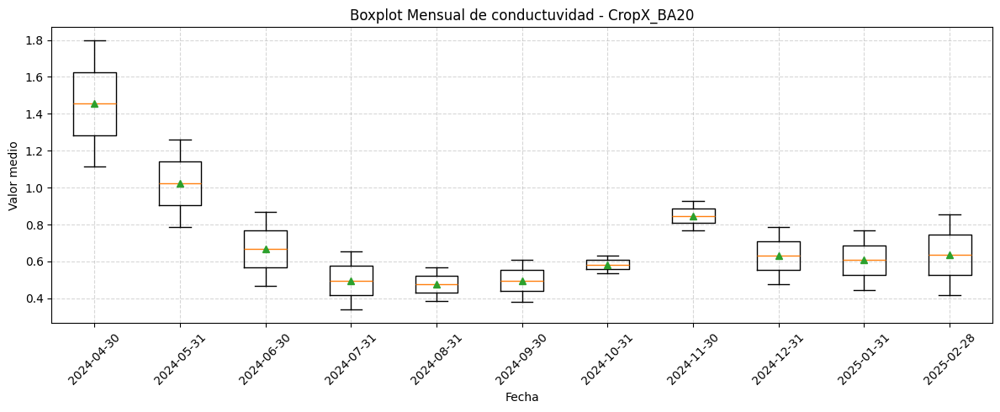

In [ ]:
def plot_boxplot_por_periodo(tiempo, medias, titulo):
    """
    Dibuja un boxplot POR PERIODO, es decir:
    - cada caja corresponde a un índice de `tiempo`
    - dentro de cada caja se muestra la distribución de valores
      entre las columnas de `medias` (p. ej. profundidades).

    tiempo : DatetimeIndex con fechas
    medias  : DataFrame indexado por esas mismas fechas
    titulo  : título de la figura
    """
    # Preparo los datos: una lista por fecha, con todos los valores de las columnas
    datos = [medias.loc[fecha].values for fecha in tiempo]
    labels = [fecha.strftime('%Y-%m-%d') for fecha in tiempo]

    plt.figure(figsize=(12, 5))
    plt.boxplot(datos, labels=labels, showmeans=True)
    plt.title(titulo)
    plt.xlabel('Fecha')
    plt.ylabel('Valor medio')
    plt.xticks(rotation=45)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()


def plot_violin_por_periodo(tiempo, medias, titulo):
    """
    Dibuja un violinplot POR PERIODO, es decir:
    - cada violín corresponde a un índice de `tiempo`
    - dentro de cada violín se ve la distribución de valores
      entre las columnas de `medias`.

    tiempo : DatetimeIndex con fechas
    medias  : DataFrame indexado por esas mismas fechas
    titulo  : título de la figura
    """
    datos = [medias.loc[fecha].values for fecha in tiempo]
    labels = [fecha.strftime('%Y-%m-%d') for fecha in tiempo]

    plt.figure(figsize=(12, 5))
    vp = plt.violinplot(datos, showmeans=True)
    ax = plt.gca()
    ax.set_xticks(range(1, len(labels)+1))
    ax.set_xticklabels(labels, rotation=45)

    plt.title(titulo)
    plt.xlabel('Fecha')
    plt.ylabel('Valor medio')
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

plot_boxplot_por_periodo(
    tiempo_t20_m,
    medias_t20_m,
    'Boxplot Mensual de conductuvidad - CropX_BA20'
)


/tmp/ipython-input-30-3756768245.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(datos, labels=labels, showmeans=True)


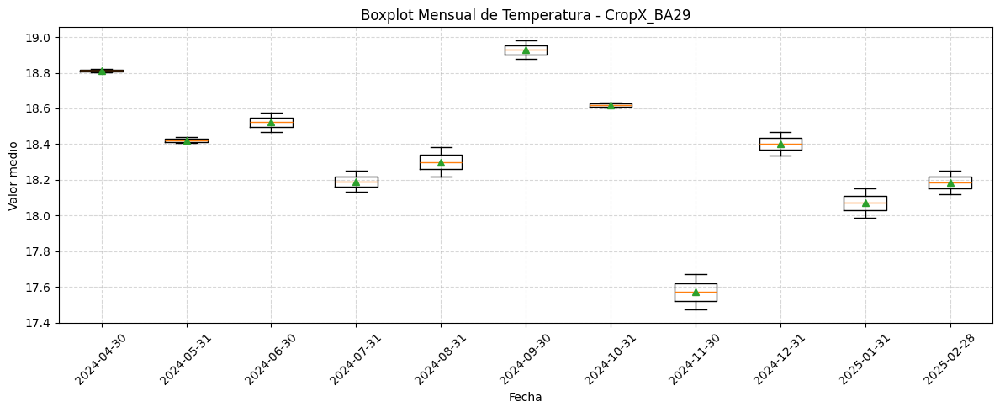

In [ ]:
plot_boxplot_por_periodo(
    tiempo_t29_m, medias_t29_m,
    'Boxplot Mensual de Temperatura - CropX_BA29'
)

/tmp/ipython-input-30-3756768245.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(datos, labels=labels, showmeans=True)


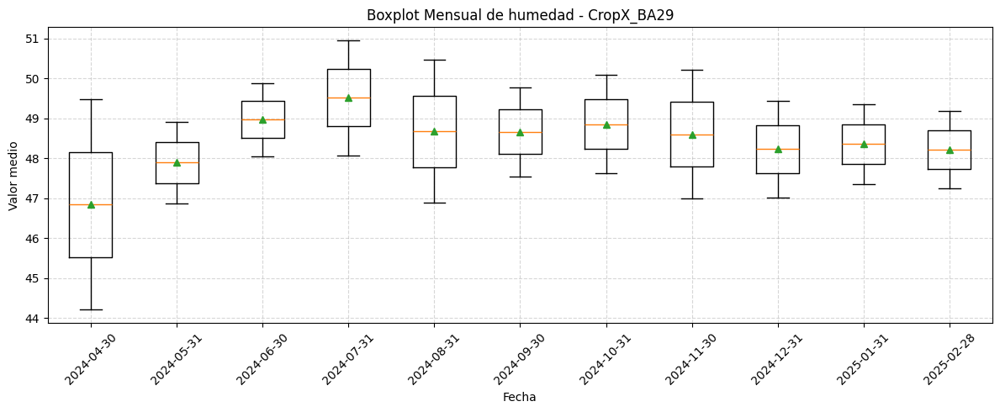

In [ ]:
plot_boxplot_por_periodo(
    tiempo_h29_m, medias_h29_m,
    'Boxplot Mensual de humedad - CropX_BA29'
)

/tmp/ipython-input-30-3756768245.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(datos, labels=labels, showmeans=True)


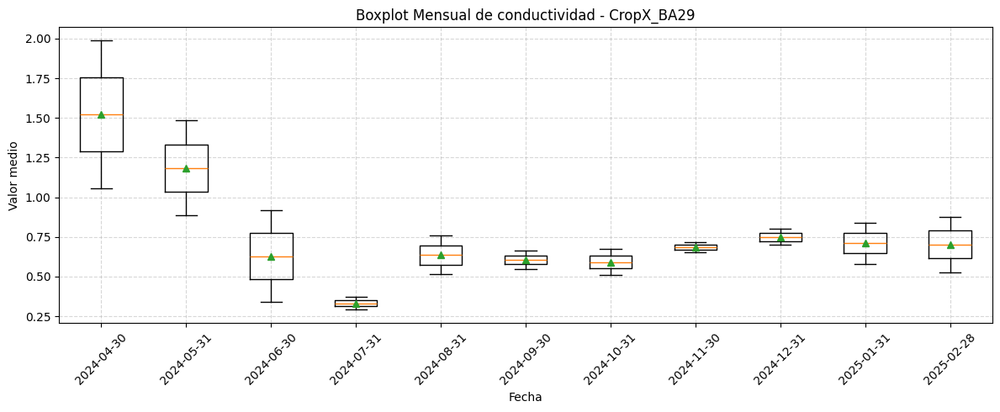

In [ ]:
plot_boxplot_por_periodo(
    tiempo_ec29_m, medias_ec29_m,
    'Boxplot Mensual de conductividad - CropX_BA29'
)

/tmp/ipython-input-30-3756768245.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(datos, labels=labels, showmeans=True)


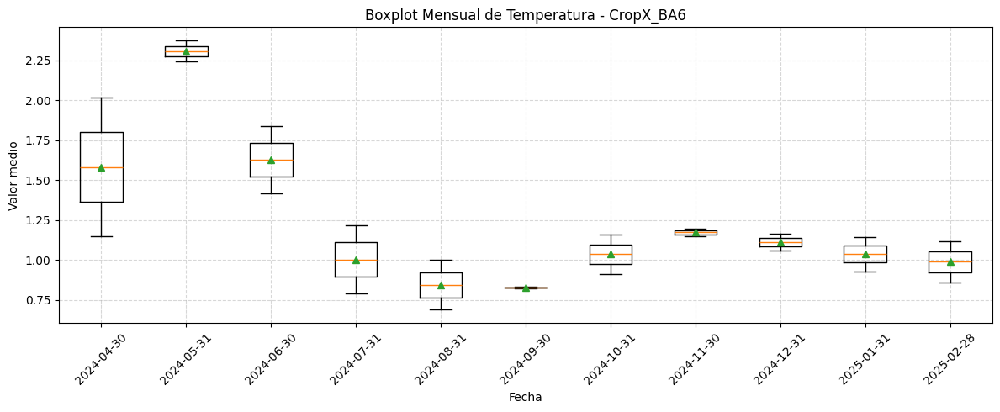

In [ ]:
plot_boxplot_por_periodo(
    tiempo_t6_m, medias_t6_m,
    'Boxplot Mensual de Temperatura - CropX_BA6'
)

### **d) Histogramas y Diagramas de densidad (KDE)**

In [ ]:
def plot_dist_kde_box(tiempo, medias, var_nombre):
    """
    Para un DataFrame `medias` cuyas columnas son profundidades
    (ej. 'VWC-20cm', 'VWC-41cm', ...) y su índice es `tiempo`,
    dibuja una figura con:
      - histograma+KDE por profundidad
      - boxplot por profundidad

    var_nombre: str, nombre de la variable (ej. 'Humedad')
    """
    # 1) Preparamos el DataFrame en formato largo
    df = medias.reset_index(drop=True).melt(
        var_name='Profundidad',
        value_name=var_nombre
    )

    # 2) Creamos la figura con dos ejes apilados
    fig, axes = plt.subplots(
        nrows=2, ncols=1,
        figsize=(8, 6),
        sharex=False,
        gridspec_kw={'height_ratios': [2, 1]}
    )

    # 3) Histograma + KDE
    sns.histplot(
        data=df,
        x=var_nombre,
        hue='Profundidad',
        kde=True,
        stat='density',
        common_norm=False,
        ax=axes[0]
    )
    axes[0].set_title(f'Distribución de {var_nombre} por profundidad')
    axes[0].set_xlabel('')
    axes[0].set_ylabel('Densidad')

    # 4) Boxplot
    sns.boxplot(
        data=df,
        x=var_nombre,
        y='Profundidad',
        orient='h',
        ax=axes[1],
        palette='pastel'
    )
    axes[1].set_ylabel('Profundidad')

    # 5) Ajustes finales
    # Quitar leyenda duplicada
    if axes[1].legend_:
        axes[1].legend_.remove()
    plt.tight_layout()
    plt.show()


#### **Cultivo 6**

/tmp/ipython-input-35-304587700.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


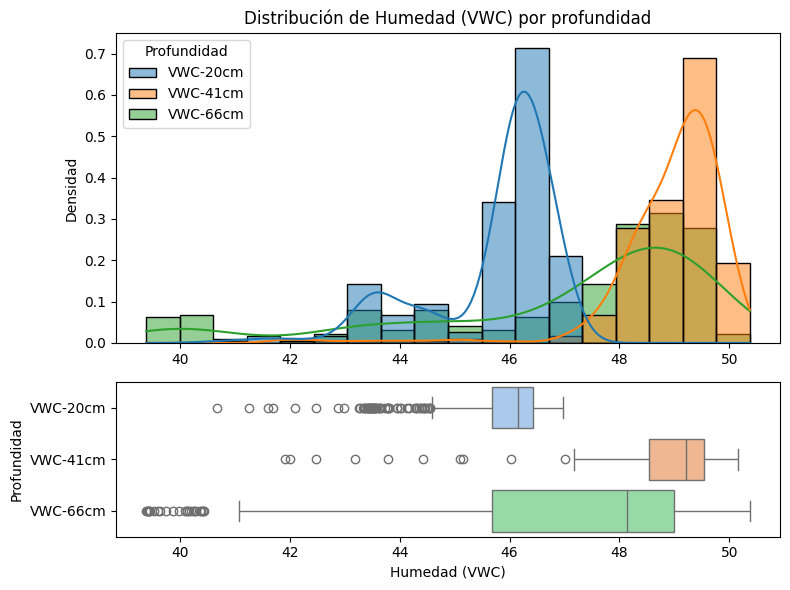

In [ ]:
plot_dist_kde_box(
    tiempo_h6,
    medias_h6,
    var_nombre='Humedad (VWC)'
)

/tmp/ipython-input-35-304587700.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


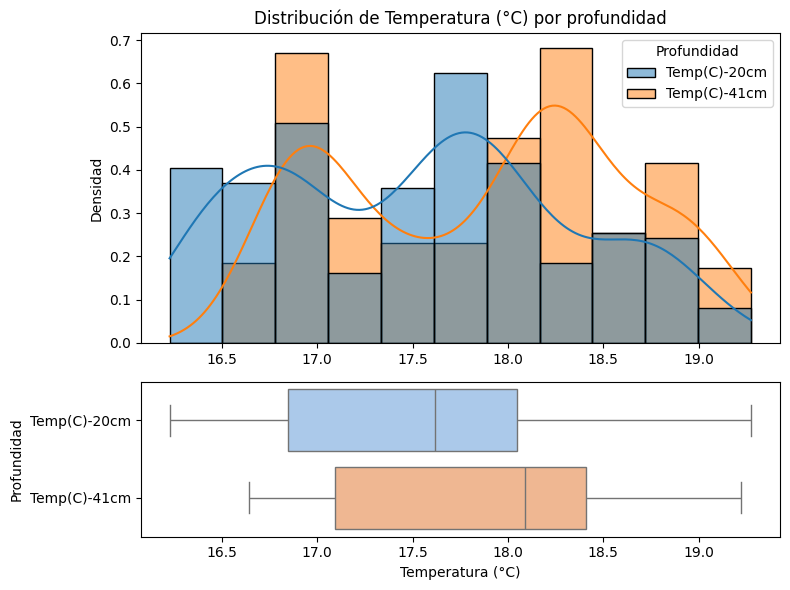

In [ ]:
plot_dist_kde_box(
    tiempo_t6,
    medias_t6,
    var_nombre='Temperatura (°C)'
)

/tmp/ipython-input-35-304587700.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


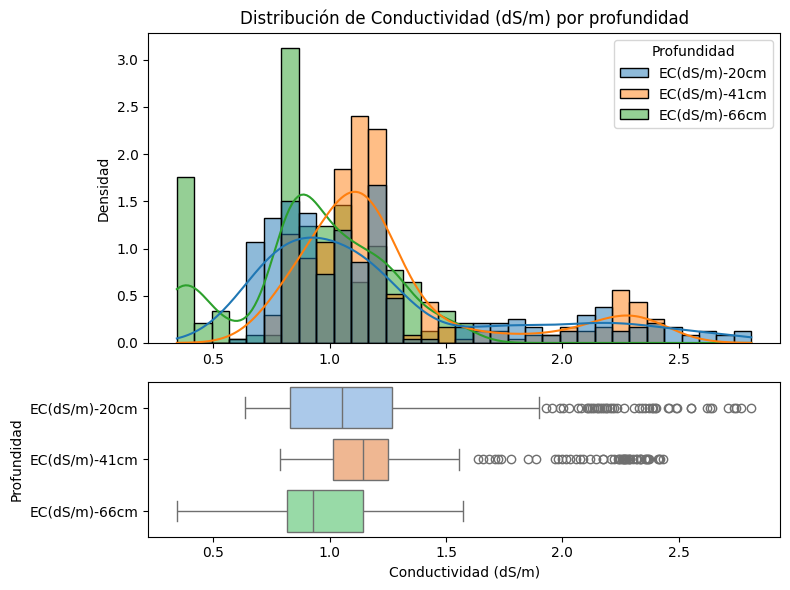

In [ ]:
plot_dist_kde_box(
    tiempo_ec6,
    medias_ec6,
    var_nombre='Conductividad (dS/m)'
)

#### **Cultivo 20.** *texto en cursiva*

/tmp/ipython-input-35-304587700.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


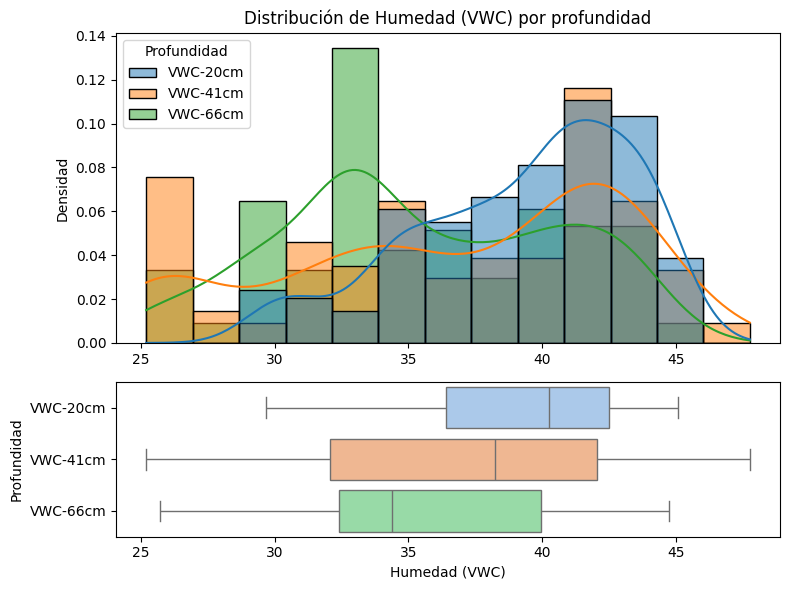

In [ ]:
plot_dist_kde_box(
    tiempo_h20,
    medias_h20,
    var_nombre='Humedad (VWC)'
)

/tmp/ipython-input-35-304587700.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


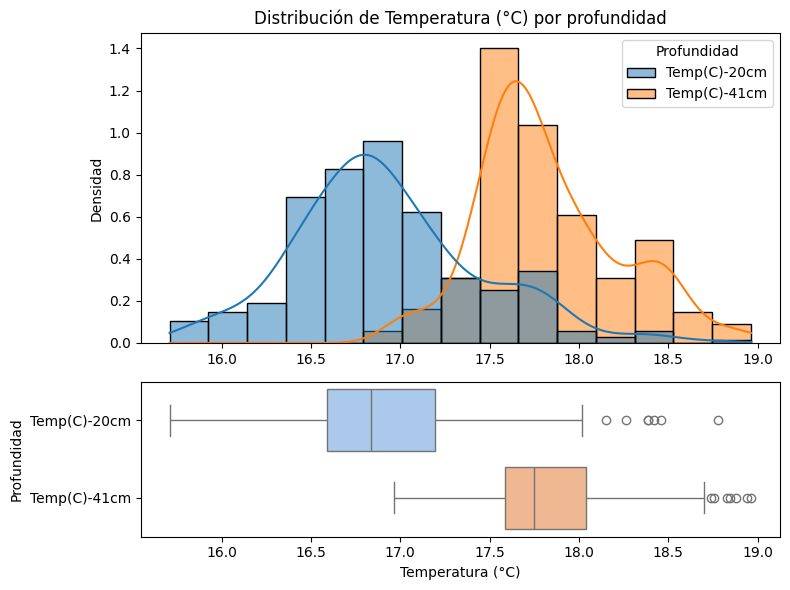

In [ ]:
plot_dist_kde_box(
    tiempo_t20,
    medias_t20,
    var_nombre='Temperatura (°C)'
)

/tmp/ipython-input-35-304587700.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


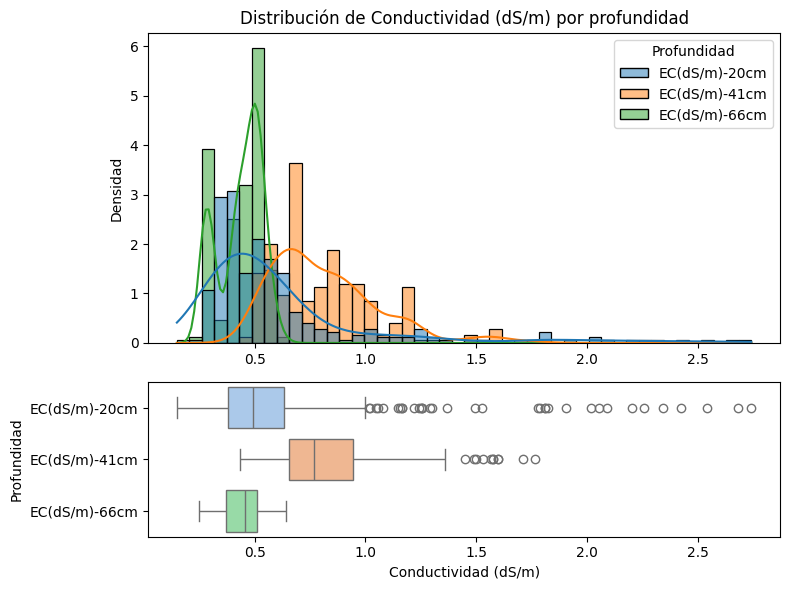

In [ ]:
plot_dist_kde_box(
    tiempo_ec20,
    medias_ec20,
    var_nombre='Conductividad (dS/m)'
)

#### **Cultivo 9**

/tmp/ipython-input-35-304587700.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


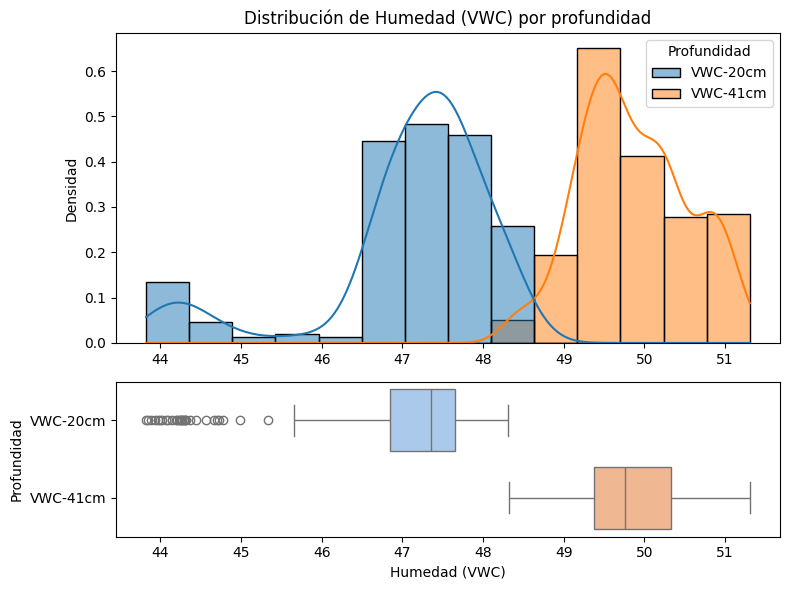

In [ ]:
plot_dist_kde_box(
    tiempo_h29,
    medias_h29,
    var_nombre='Humedad (VWC)'
)

/tmp/ipython-input-35-304587700.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


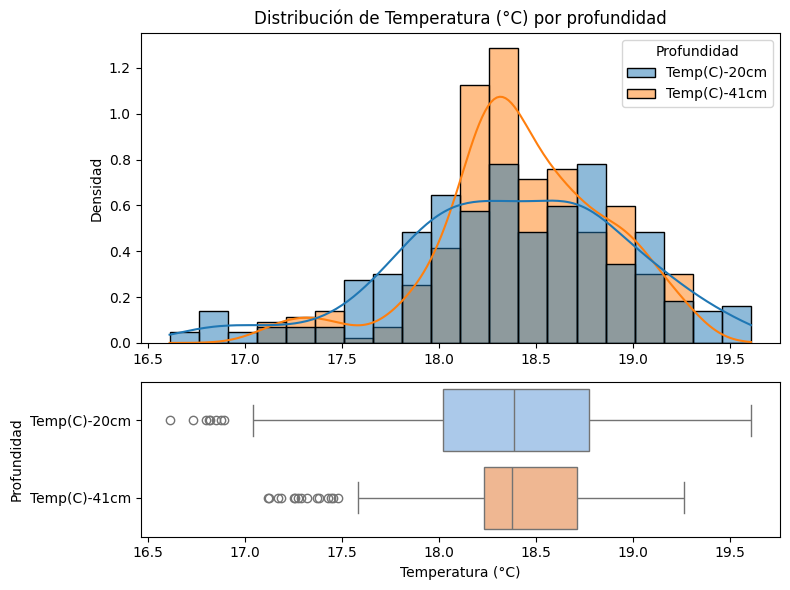

In [ ]:
plot_dist_kde_box(
    tiempo_t29,
    medias_t29,
    var_nombre='Temperatura (°C)'
)

/tmp/ipython-input-35-304587700.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


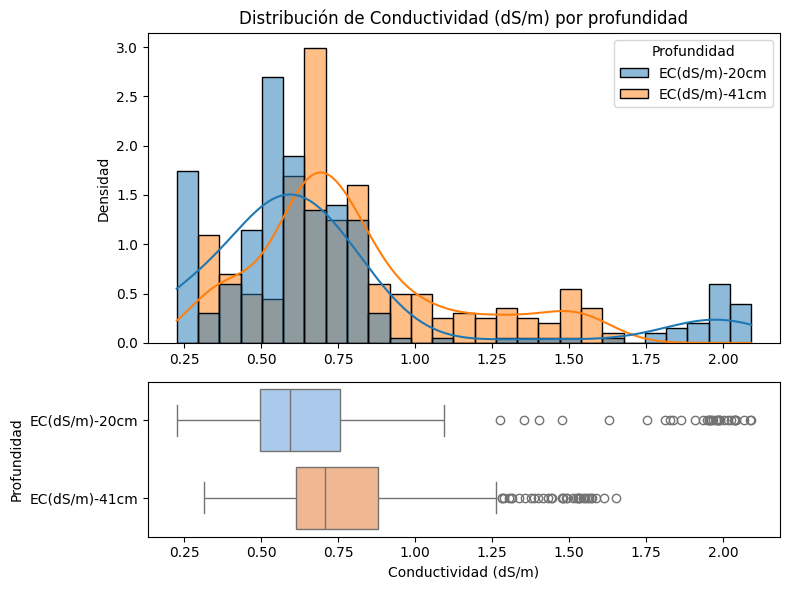

In [ ]:
plot_dist_kde_box(
    tiempo_ec29,
    medias_ec29,
    var_nombre='Conductividad (dS/m)'
)

### **f) Matriz de correlación**

### **Cultivo 6**

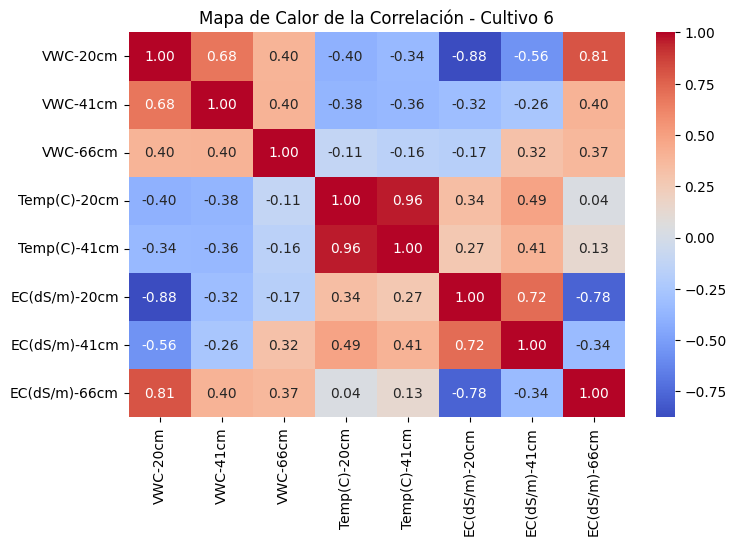

In [ ]:
Variables = df_BA6.iloc[:,1:9]

# Convertir todas las columnas a valores numéricos (los no convertibles se vuelven NaN)
Variables = Variables.apply(pd.to_numeric, errors='coerce')

# Calcular la matriz de correlación
correlacion = Variables.corr()
correlacion = df_crop6.corr()

# Graficar el mapa de calor
plt.figure(figsize=(8, 5))
sns.heatmap(correlacion, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Mapa de Calor de la Correlación - Cultivo 6')
plt.show()

### **Cultivo 20**

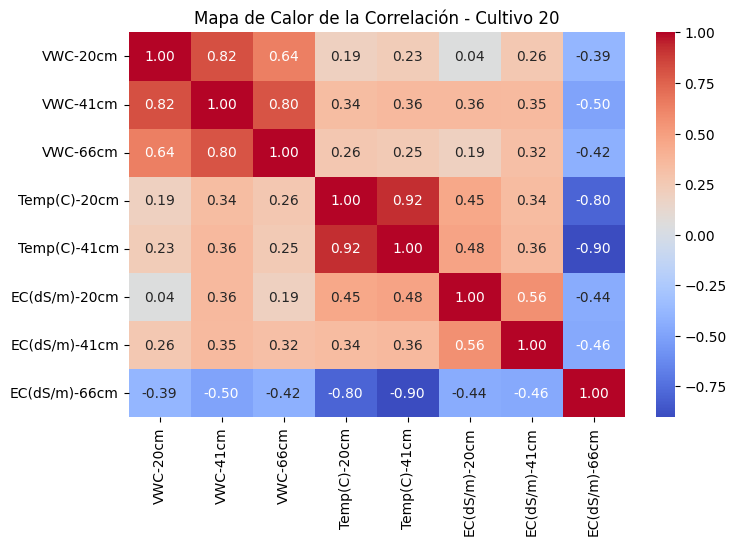

In [ ]:
Variables = df_BA20.iloc[:,1:9]

# Convertir todas las columnas a valores numéricos (los no convertibles se vuelven NaN)
Variables = Variables.apply(pd.to_numeric, errors='coerce')

# Calcular la matriz de correlación
correlacion = Variables.corr()
correlacion = df_crop20.corr()

# Graficar el mapa de calor
plt.figure(figsize=(8, 5))
sns.heatmap(correlacion, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Mapa de Calor de la Correlación - Cultivo 20')
plt.show()

### **Cultivo 29**

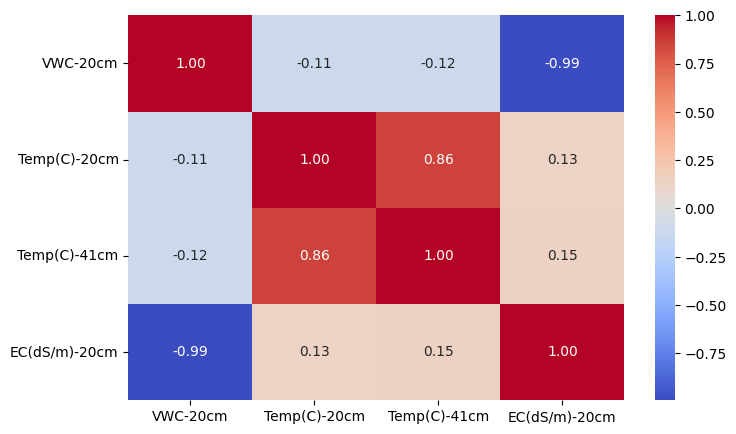

In [ ]:
Variables = df_BA29.iloc[:,1:7]

# Convertir todas las columnas a valores numéricos (los no convertibles se vuelven NaN)
Variables = Variables.apply(pd.to_numeric, errors='coerce')

# Calcular la matriz de correlación
correlacion = Variables.corr()
correlacion = df_crop29.corr()

# Graficar el mapa de calor
plt.figure(figsize=(8, 5))
sns.heatmap(correlacion, annot=True, cmap='coolwarm', fmt=".2f")
plt.show()

### **g) Gráficas de dispersión**

### **Cultivo 6**

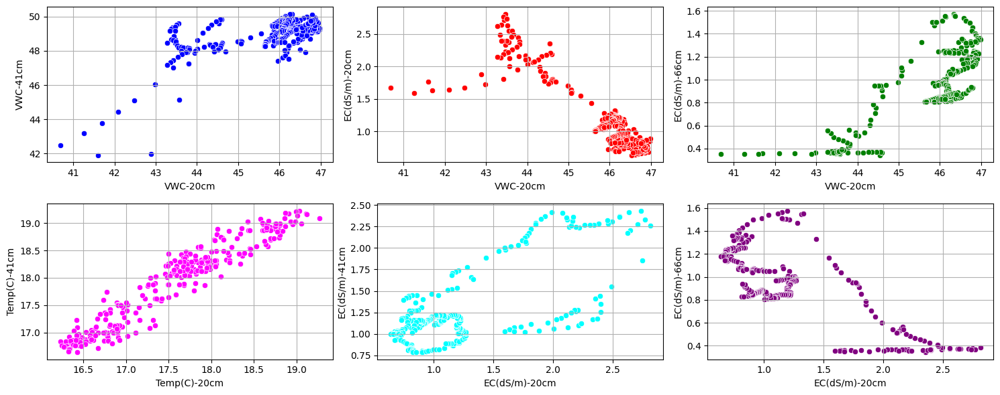

In [ ]:
#Entre variables con alta correlación
plt.figure(figsize=(15, 6))
plt.subplot(2,3,1)
sns.scatterplot(data=df_crop6, x='VWC-20cm', y='VWC-41cm', color='blue')
plt.grid()
plt.subplot(2,3,2)
sns.scatterplot(data=df_crop6, x='VWC-20cm', y='EC(dS/m)-20cm', color='red')
plt.grid()
plt.subplot(2,3,3)
sns.scatterplot(data=df_crop6, x='VWC-20cm', y='EC(dS/m)-66cm', color='green')
plt.grid()
plt.subplot(2,3,4)
sns.scatterplot(data=df_crop6, x='Temp(C)-20cm', y='Temp(C)-41cm', color='magenta')
plt.grid()
plt.subplot(2,3,5)
sns.scatterplot(data=df_crop6, x='EC(dS/m)-20cm', y='EC(dS/m)-41cm', color='cyan')
plt.grid()
plt.subplot(2,3,6)
sns.scatterplot(data=df_crop6, x='EC(dS/m)-20cm', y='EC(dS/m)-66cm', color='purple')
plt.grid()

plt.tight_layout()
plt.show()

### **Cultivo 20**

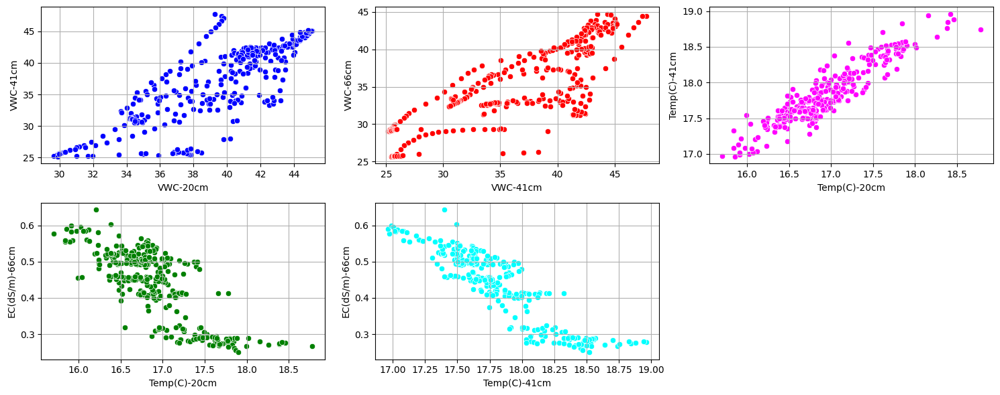

In [ ]:
#Entre variables con alta correlación
plt.figure(figsize=(15, 6))
plt.subplot(2,3,1)
sns.scatterplot(data=df_crop20, x='VWC-20cm', y='VWC-41cm', color='blue')
plt.grid()
plt.subplot(2,3,2)
sns.scatterplot(data=df_crop20, x='VWC-41cm', y='VWC-66cm', color='red')
plt.grid()
plt.subplot(2,3,3)
sns.scatterplot(data=df_crop20, x='Temp(C)-20cm', y='Temp(C)-41cm', color='magenta')
plt.grid()
plt.subplot(2,3,4)
sns.scatterplot(data=df_crop20, x='Temp(C)-20cm', y='EC(dS/m)-66cm', color='green')
plt.grid()
plt.subplot(2,3,5)
sns.scatterplot(data=df_crop20, x='Temp(C)-41cm', y='EC(dS/m)-66cm', color='cyan')
plt.grid()


plt.tight_layout()
plt.show()

### **Cultivo 29**

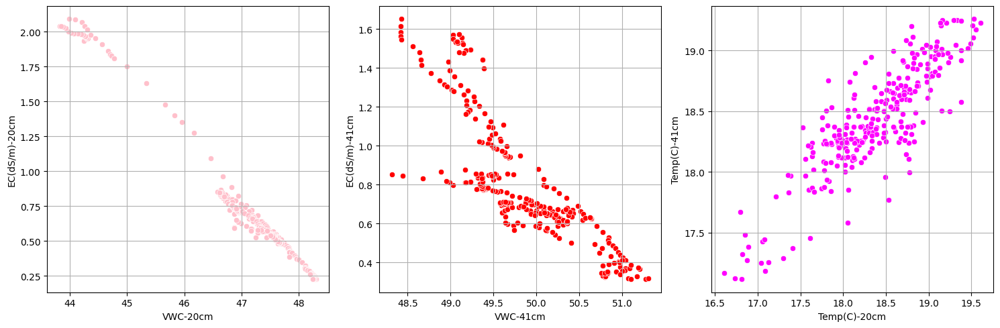

In [ ]:
#Entre variables con alta correlación
plt.figure(figsize=(15, 5))
plt.subplot(1,3,1)
sns.scatterplot(data=df_crop29, x='VWC-20cm', y='EC(dS/m)-20cm', color='pink')
plt.grid()
plt.subplot(1,3,2)
sns.scatterplot(data=df_crop29, x='VWC-41cm', y='EC(dS/m)-41cm', color='red')
plt.grid()
plt.subplot(1,3,3)
sns.scatterplot(data=df_crop29, x='Temp(C)-20cm', y='Temp(C)-41cm', color='magenta')
plt.grid()

plt.tight_layout()
plt.show()

### **h) Pairplot**

### **Cultivo 6**

<Figure size 1500x1500 with 0 Axes>

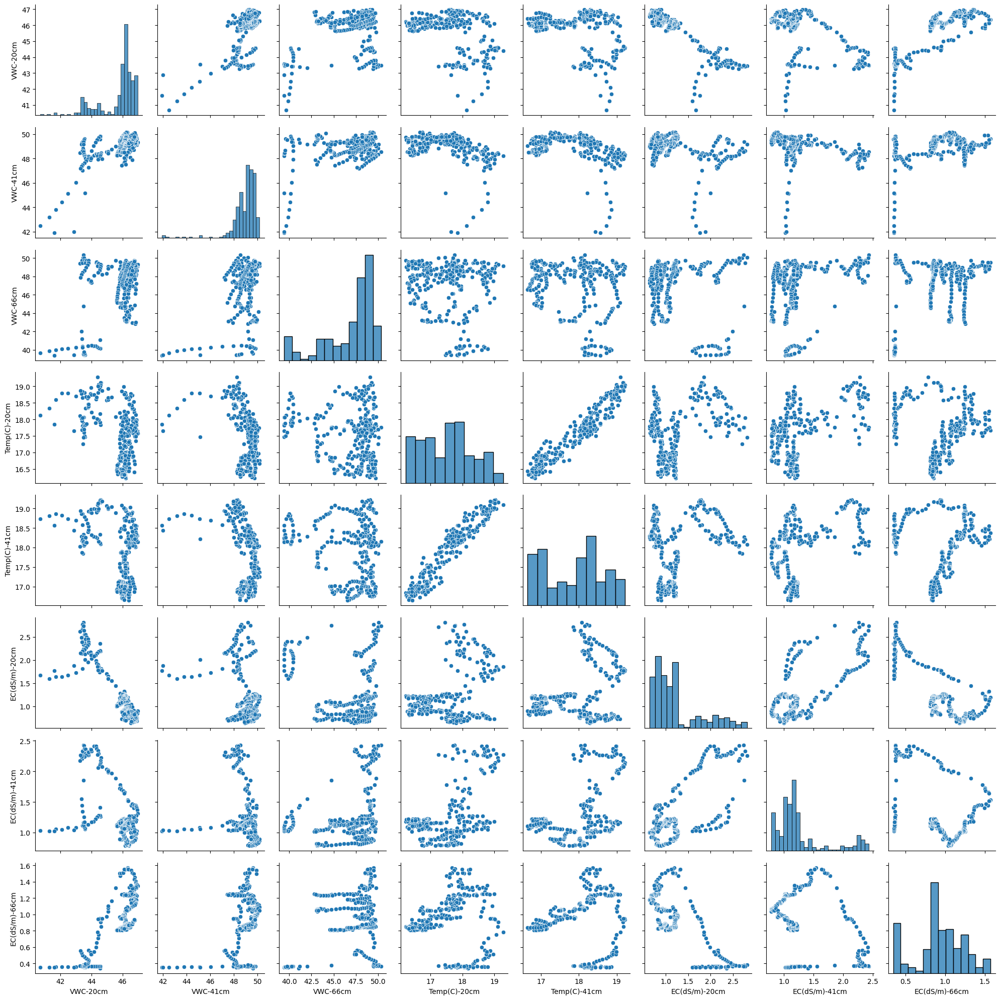

In [ ]:
plt.figure(figsize=(15, 15))
sns.pairplot(df_crop6[['VWC-20cm',	'VWC-41cm',	'VWC-66cm',	'Temp(C)-20cm',	'Temp(C)-41cm',	'EC(dS/m)-20cm',	'EC(dS/m)-41cm',	'EC(dS/m)-66cm']])
plt.tight_layout()
plt.show()

### **Cultivo 20**

<Figure size 1500x1500 with 0 Axes>

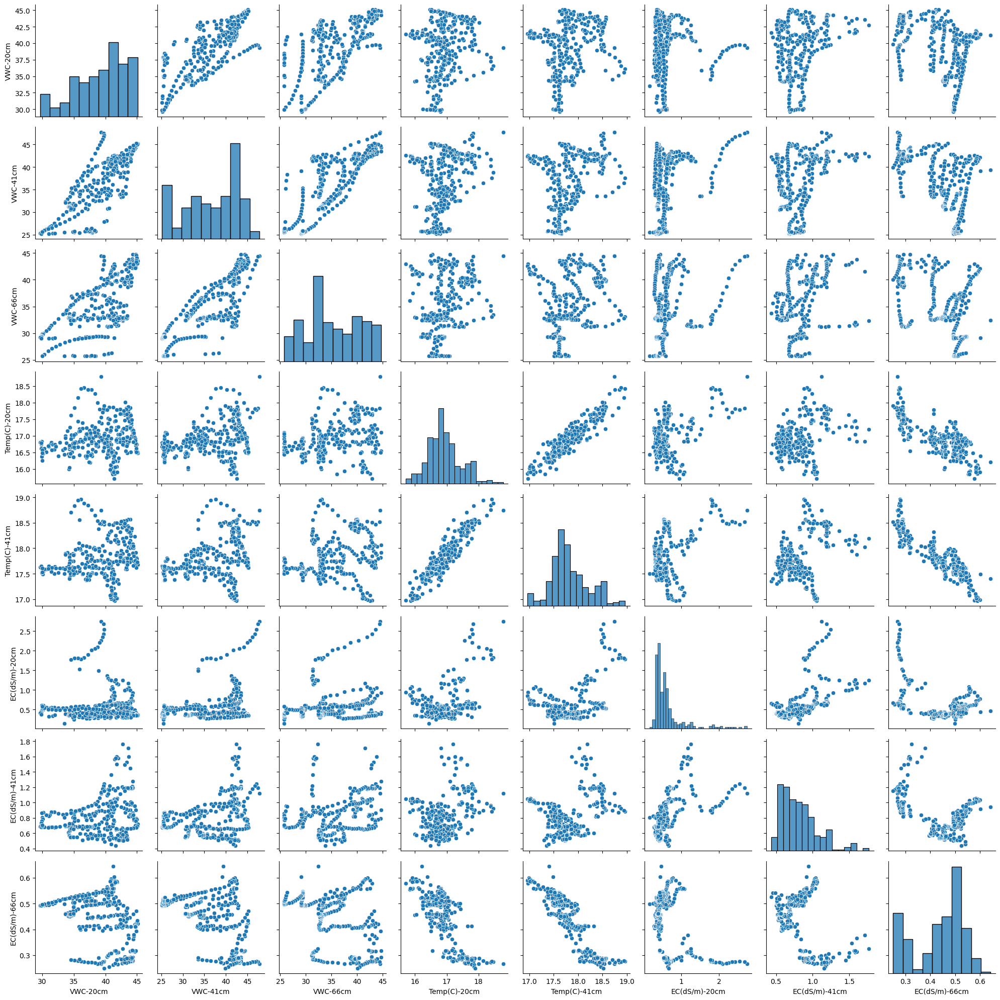

In [ ]:
plt.figure(figsize=(15, 15))
sns.pairplot(df_crop20[['VWC-20cm',	'VWC-41cm',	'VWC-66cm',	'Temp(C)-20cm',	'Temp(C)-41cm',	'EC(dS/m)-20cm',	'EC(dS/m)-41cm',	'EC(dS/m)-66cm']])
plt.tight_layout()
plt.show()

### **Cultivo 29**

<Figure size 1500x1500 with 0 Axes>

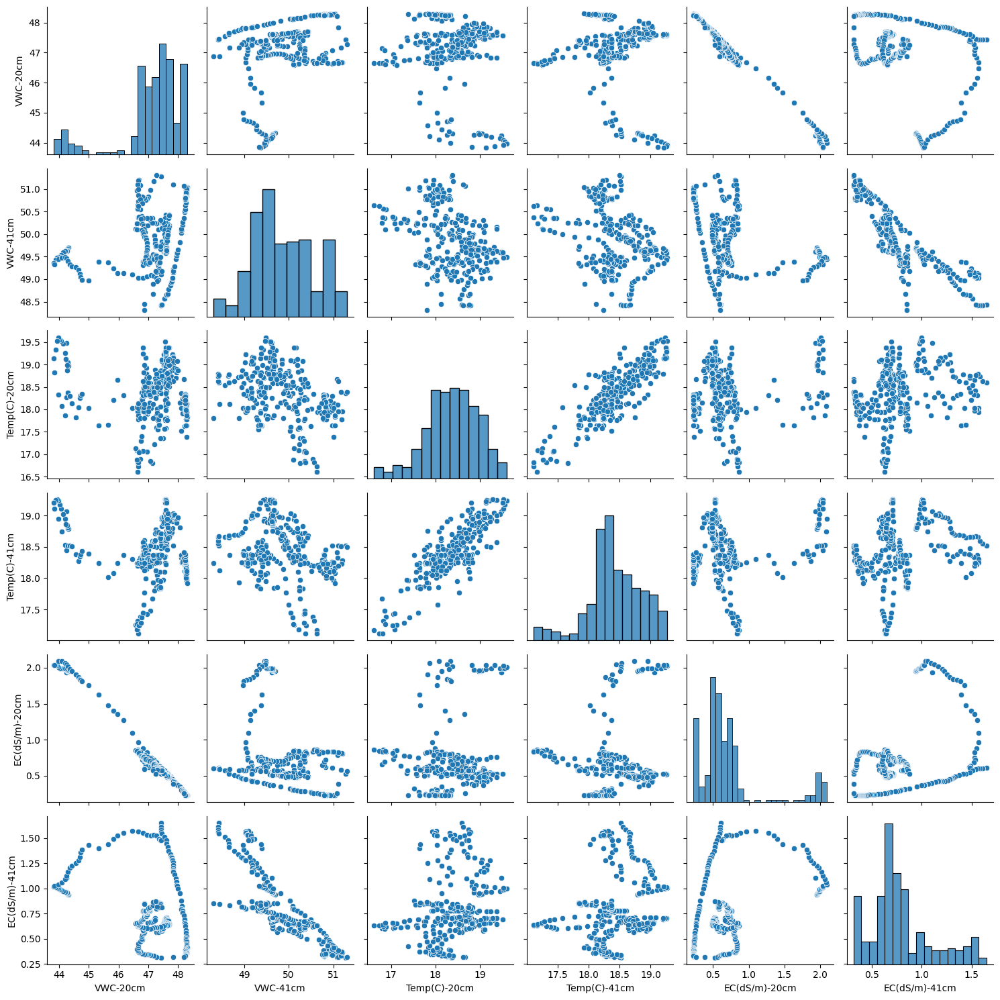

In [ ]:
plt.figure(figsize=(15, 15))
sns.pairplot(df_crop29[['VWC-20cm',	'VWC-41cm',	'Temp(C)-20cm',	'Temp(C)-41cm',	'EC(dS/m)-20cm',	'EC(dS/m)-41cm']])
plt.tight_layout()
plt.show()

# **Primeros Modelos - Cultivo 29**

MSE: 0.0257   R²: 0.7255

Importancia de variables (descendente):
      feature  importance
EC(dS/m)-20cm    0.974042
 Temp(C)-20cm    0.010764
 Temp(C)-41cm    0.010132
EC(dS/m)-41cm    0.004363
     VWC-41cm    0.000700


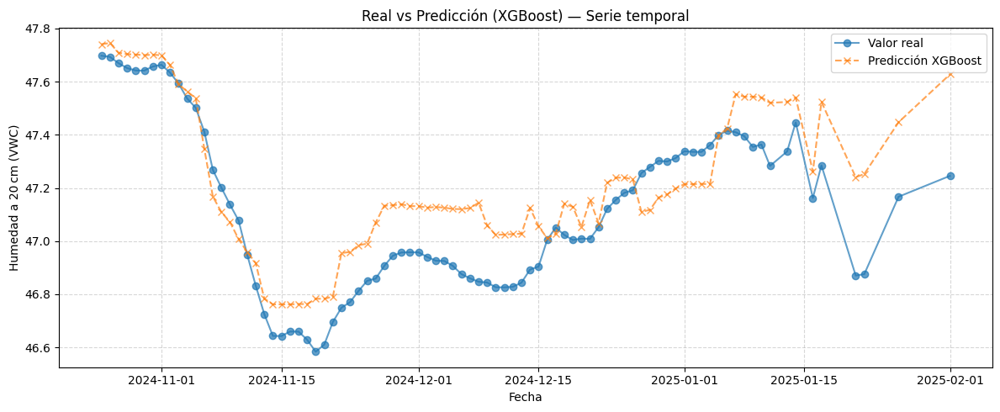

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection   import train_test_split
from sklearn.preprocessing    import StandardScaler
from xgboost                  import XGBRegressor
from sklearn.metrics          import mean_squared_error, r2_score

# --- 1) Preparar X_full con índice temporal ---
# Asume que `medias_h29`, `medias_t29`, `medias_ec29` tienen índice DatetimeIndex
X_full = pd.concat([medias_h29, medias_t29, medias_ec29], axis=1).dropna()

# Guardamos el index para graficar más tarde
time_full = X_full.index

# Variable objetivo y matriz de características
y_full = X_full['VWC-20cm'].values
X_full_values = X_full.drop(columns=['VWC-20cm']).values
feature_names = X_full.drop(columns=['VWC-20cm']).columns.tolist()

# --- 2) División train/test sin barajar para mantener orden temporal ---
X_train, X_test, y_train, y_test, t_train, t_test = train_test_split(
    X_full_values, y_full, time_full,
    test_size=0.3,
    random_state=42,
    shuffle=False
)

# --- 3) Escalado (opcional) ---
scaler_X = StandardScaler().fit(X_train)
X_train_s = scaler_X.transform(X_train)
X_test_s  = scaler_X.transform(X_test)

mask_tr    = np.isfinite(y_train)
X_train_s, y_train = X_train_s[mask_tr], y_train[mask_tr]

mask_te    = np.isfinite(y_test)
X_test_s, y_test = X_test_s[mask_te], y_test[mask_te]

# --- 4) Entrenar XGBoost ---
model = XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    random_state=42
)
model.fit(X_train_s, y_train)

# --- 5) Predecir ---
y_pred = model.predict(X_test_s)

# --- 6) Evaluar ---
mse = mean_squared_error(y_test, y_pred)
r2  = r2_score(y_test, y_pred)
print(f"MSE: {mse:.4f}   R²: {r2:.4f}")
importances = model.feature_importances_
imp_df = (
    pd.DataFrame({'feature': feature_names, 'importance': importances})
      .sort_values('importance', ascending=False)
)
print("\nImportancia de variables (descendente):")
print(imp_df.to_string(index=False))

# --- 7) Graficar vs tiempo real ---
plt.figure(figsize=(12, 5))
plt.plot(t_test, y_test, 'o-', label='Valor real', alpha=0.7)
plt.plot(t_test, y_pred, 'x--', label='Predicción XGBoost', alpha=0.7)
plt.xlabel('Fecha')
plt.ylabel('Humedad a 20 cm (VWC)')
plt.title('Real vs Predicción (XGBoost) — Serie temporal')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

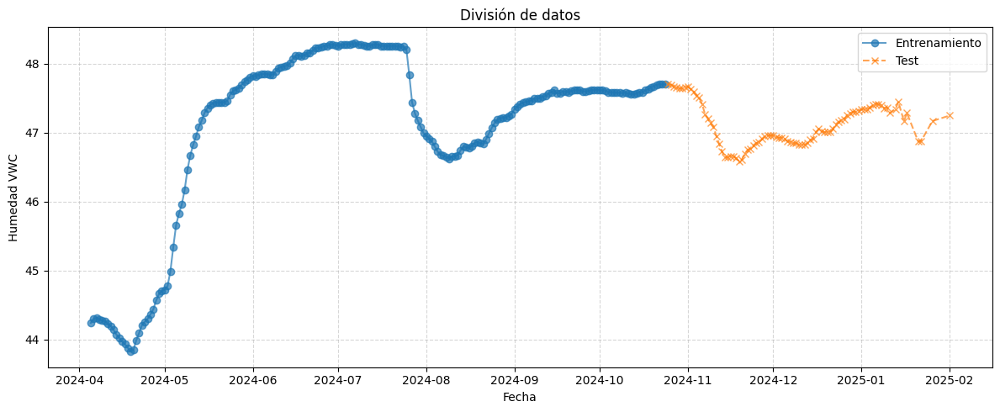

In [ ]:
plt.figure(figsize=(12, 5))
plt.plot(t_train, y_train, 'o-', label='Entrenamiento', alpha=0.7)
plt.plot(t_test, y_test, 'x--', label='Test', alpha=0.7)
plt.xlabel('Fecha')
plt.ylabel('Humedad VWC')
plt.title('División de datos')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


### Ocultar

MSE: 0.4396   R²: -0.7748


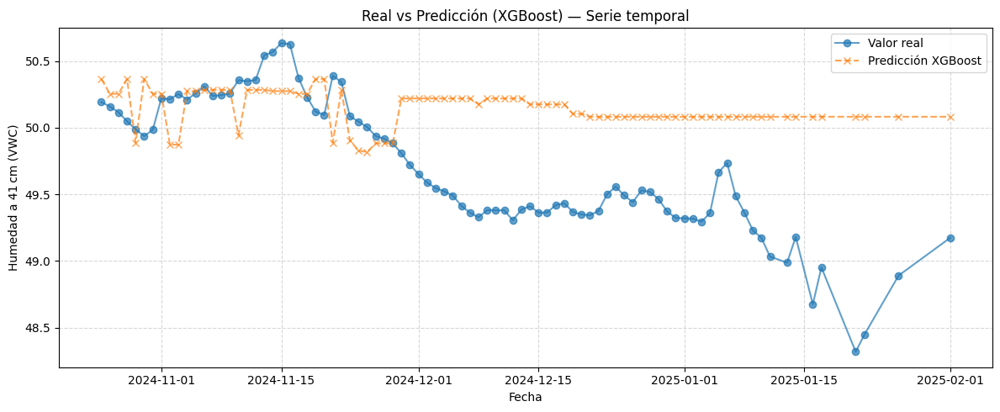

In [ ]:
X_full = pd.concat([medias_h29, medias_t29, medias_ec29], axis=1).dropna()

# Definimos la variable objetivo: Humedad a 20 cm
y = X_full['VWC-41cm'].values

# Construimos X quitando la columna objetivo
X = X_full.drop(columns=['VWC-41cm']).values
X = X_full['EC(dS/m)-41cm'].values

#feature_names = X_full.drop(columns=['VWC-41cm']).columns.tolist()

# --- 2) División train/test sin barajar para mantener orden temporal ---
X_train, X_test, y_train, y_test, t_train, t_test = train_test_split(
    X , y, time_full,
    test_size=0.3,
    random_state=42,
    shuffle=False
)

X_train = X_train.reshape(-1,1)
X_test = X_test.reshape(-1,1)
# --- 3) Escalado (opcional) ---
scaler_X = StandardScaler().fit(X_train)
X_train_s = scaler_X.transform(X_train)
X_test_s  = scaler_X.transform(X_test)

# --- 4) Entrenar XGBoost ---
model = XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    random_state=42
)
model.fit(X_train_s, y_train)

# --- 5) Predecir ---
y_pred = model.predict(X_test_s)

# --- 6) Evaluar ---
mse = mean_squared_error(y_test, y_pred)
r2  = r2_score(y_test, y_pred)
print(f"MSE: {mse:.4f}   R²: {r2:.4f}")
"""
importances = model.feature_importances_
imp_df = (
    pd.DataFrame({'feature': feature_names, 'importance': importances})
      .sort_values('importance', ascending=False)
)
print("\nImportancia de variables (descendente):")
print(imp_df.to_string(index=False))
"""
# --- 7) Graficar vs tiempo real ---
plt.figure(figsize=(12, 5))
plt.plot(t_test, y_test, 'o-', label='Valor real', alpha=0.7)
plt.plot(t_test, y_pred, 'x--', label='Predicción XGBoost', alpha=0.7)
plt.xlabel('Fecha')
plt.ylabel('Humedad a 41 cm (VWC)')
plt.title('Real vs Predicción (XGBoost) — Serie temporal')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()



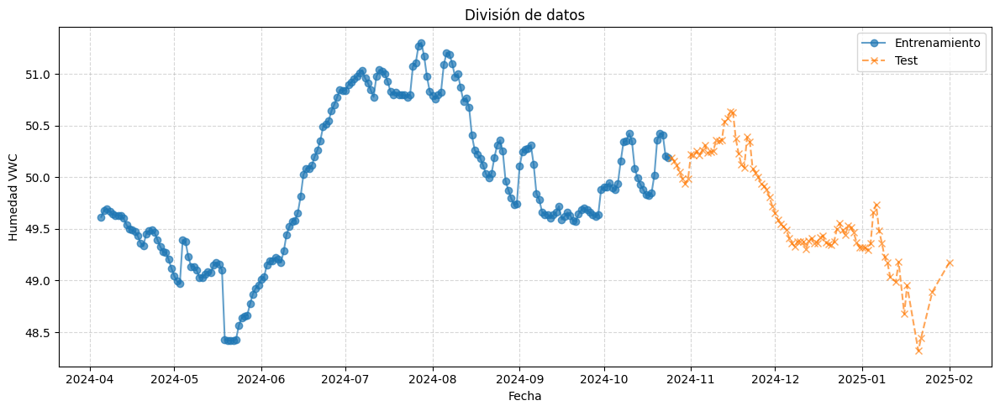

In [ ]:
plt.figure(figsize=(12, 5))
plt.plot(t_train, y_train, 'o-', label='Entrenamiento', alpha=0.7)
plt.plot(t_test, y_test, 'x--', label='Test', alpha=0.7)
plt.xlabel('Fecha')
plt.ylabel('Humedad VWC')
plt.title('División de datos')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

'EC(dS/m)-20cm',	'EC(dS/m)-41cm

### XGBOOST

MSE: 0.0051
R²:  0.5422

Importancia de variables (descendente):
      feature  importance
     VWC-20cm    0.988037
EC(dS/m)-41cm    0.010123
     VWC-41cm    0.001257
 Temp(C)-41cm    0.000351
 Temp(C)-20cm    0.000232


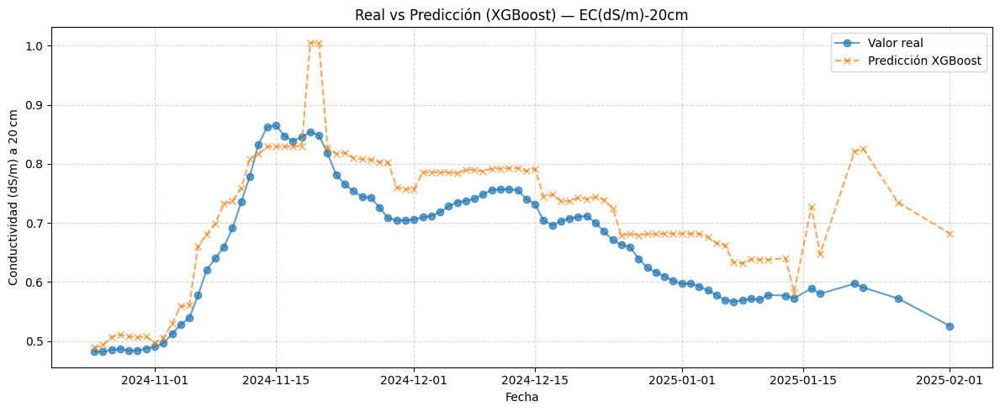

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection   import train_test_split
from sklearn.preprocessing    import StandardScaler
from xgboost                  import XGBRegressor
from sklearn.metrics          import mean_squared_error, r2_score

# 1) Construcción de X_full y extracción del índice temporal
# ----------------------------------------------------------
X_full = pd.concat([medias_h29, medias_t29, medias_ec29], axis=1).dropna()
time_full = X_full.index  # DatetimeIndex con las fechas de cada fila

# 2) Variable objetivo y matriz de características
# ------------------------------------------------
y = X_full['EC(dS/m)-20cm'].values
X = X_full.drop(columns=['EC(dS/m)-20cm']).values
feature_names = X_full.drop(columns=['EC(dS/m)-20cm']).columns.tolist()

# 3) División en entrenamiento y test (30% test)
# -----------------------------------------------
# Incluimos time_full para poder graficar luego con fechas
X_train, X_test, y_train, y_test, t_train, t_test = train_test_split(
    X, y, time_full,
    test_size=0.3,
    random_state=42,
    shuffle=False
)

# 4) Escalado de características
# -------------------------------
scaler_X  = StandardScaler().fit(X_train)
X_train_s = scaler_X.transform(X_train)
X_test_s  = scaler_X.transform(X_test)


mask_tr    = np.isfinite(y_train)
X_train_s, y_train = X_train_s[mask_tr], y_train[mask_tr]

mask_te    = np.isfinite(y_test)
X_test_s, y_test = X_test_s[mask_te], y_test[mask_te]

# 5) Entrenamiento del modelo XGBoost
# -----------------------------------
model = XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    random_state=42
)
model.fit(X_train_s, y_train)

# 6) Predicción y evaluación
# ---------------------------
y_pred = model.predict(X_test_s)
mse    = mean_squared_error(y_test, y_pred)
r2     = r2_score(y_test, y_pred)

print(f"MSE: {mse:.4f}")
print(f"R²:  {r2:.4f}")

# 7) Importancia de variables
# ---------------------------
importances = model.feature_importances_
imp_df = (
    pd.DataFrame({'feature': feature_names, 'importance': importances})
      .sort_values('importance', ascending=False)
)
print("\nImportancia de variables (descendente):")
print(imp_df.to_string(index=False))

# 8) Gráfica Real vs Predicción sobre tiempo real
# ------------------------------------------------
plt.figure(figsize=(12, 5))
plt.plot(t_test, y_test,  'o-', label='Valor real', alpha=0.7)
plt.plot(t_test, y_pred, 'x--', label='Predicción XGBoost', alpha=0.7)
plt.xlabel('Fecha')
plt.ylabel('Conductividad (dS/m) a 20 cm')
plt.title('Real vs Predicción (XGBoost) — EC(dS/m)-20cm')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


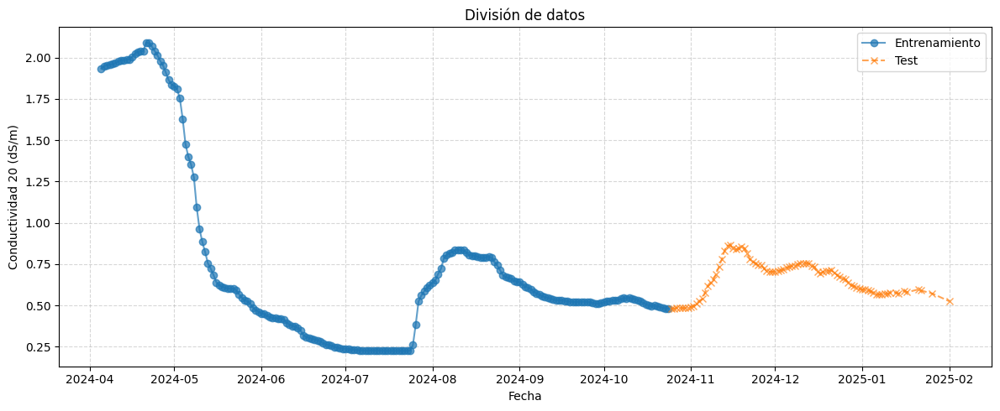

In [ ]:
plt.figure(figsize=(12, 5))
plt.plot(t_train, y_train, 'o-', label='Entrenamiento', alpha=0.7)
plt.plot(t_test, y_test, 'x--', label='Test', alpha=0.7)
plt.xlabel('Fecha')
plt.ylabel('Conductividad 20 (dS/m)')
plt.title('División de datos')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

### Ocultar

Error cuadrático medio (MSE): 0.16315718833552792
Coeficiente de determinación (R^2): -20.528502571832135

Importancia de variables (descendente):
      feature  importance
     VWC-41cm    0.900651
 Temp(C)-41cm    0.050796
     VWC-20cm    0.045123
EC(dS/m)-20cm    0.002455
 Temp(C)-20cm    0.000975


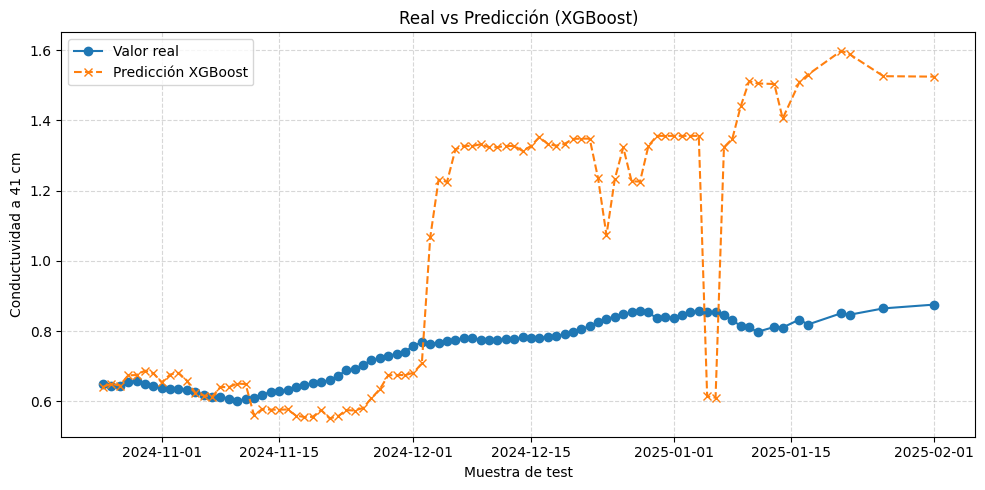

In [ ]:
X_full = pd.concat([medias_h29, medias_t29, medias_ec29], axis=1).dropna()

# Definimos la variable objetivo: Humedad a 20 cm
y = X_full['EC(dS/m)-41cm'].values

# Construimos X quitando la columna objetivo
X = X_full.drop(columns=['EC(dS/m)-41cm']).values

feature_names = X_full.drop(columns=['EC(dS/m)-41cm']).columns.tolist()

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.3,
    random_state=42,
    shuffle=False
)


scaler_X = StandardScaler().fit(X_train)
X_train_s = scaler_X.transform(X_train)
X_test_s  = scaler_X.transform(X_test)


model = XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    random_state=42
)
model.fit(X_train_s, y_train)


y_pred = model.predict(X_test_s)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Error cuadrático medio (MSE): {mse}")
print(f"Coeficiente de determinación (R^2): {r2}")

importances = model.feature_importances_
imp_df = pd.DataFrame({
    'feature': feature_names,
    'importance': importances
}).sort_values('importance', ascending=False)

print("\nImportancia de variables (descendente):")
print(imp_df.to_string(index=False))

plt.figure(figsize=(10, 5))
plt.plot(t_test, y_test, 'o-', label='Valor real')
plt.plot(t_test, y_pred, 'x--', label='Predicción XGBoost')
plt.xlabel('Muestra de test')
plt.ylabel('Conductuvidad a 41 cm')
plt.title('Real vs Predicción (XGBoost)')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


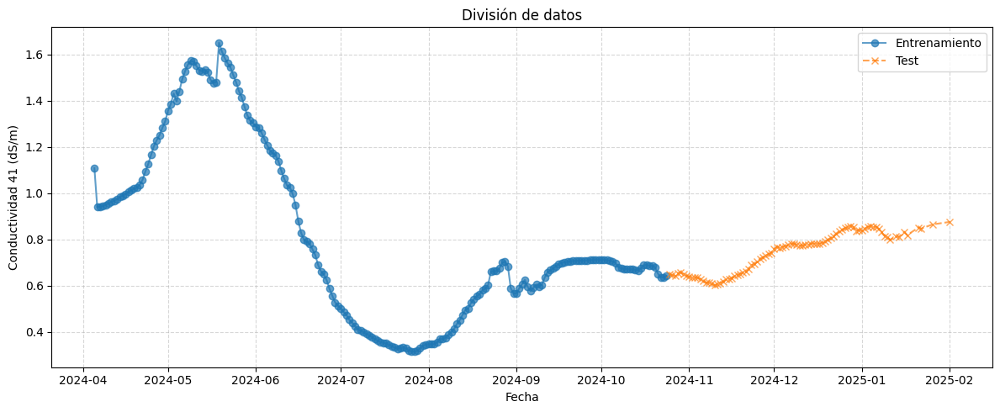

In [ ]:
plt.figure(figsize=(12, 5))
plt.plot(t_train, y_train, 'o-', label='Entrenamiento', alpha=0.7)
plt.plot(t_test, y_test, 'x--', label='Test', alpha=0.7)
plt.xlabel('Fecha')
plt.ylabel('Conductividad 41 (dS/m)')
plt.title('División de datos')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

El coeficiente de determinación, conocido como R², es una medida estadística que indica qué proporción de la variabilidad total de la variable dependiente (la que queremos predecir) es “explicada” por nuestro modelo de regresión.

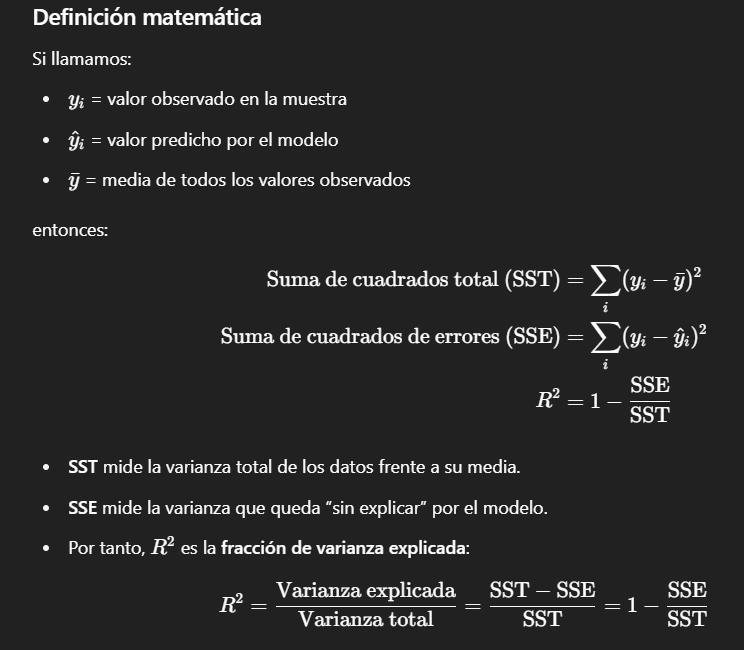

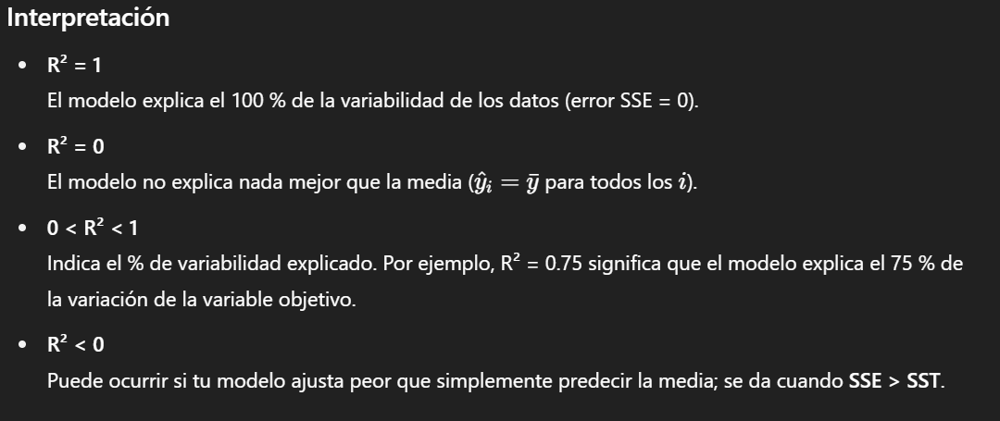

### Random Forest

Random Forest RMSE: 0.0271
Random Forest R²:   0.7104

Importancia de variables (Random Forest):
      feature  importance
EC(dS/m)-20cm    0.975510
EC(dS/m)-41cm    0.011127
 Temp(C)-41cm    0.006873
 Temp(C)-20cm    0.003899
     VWC-41cm    0.002591


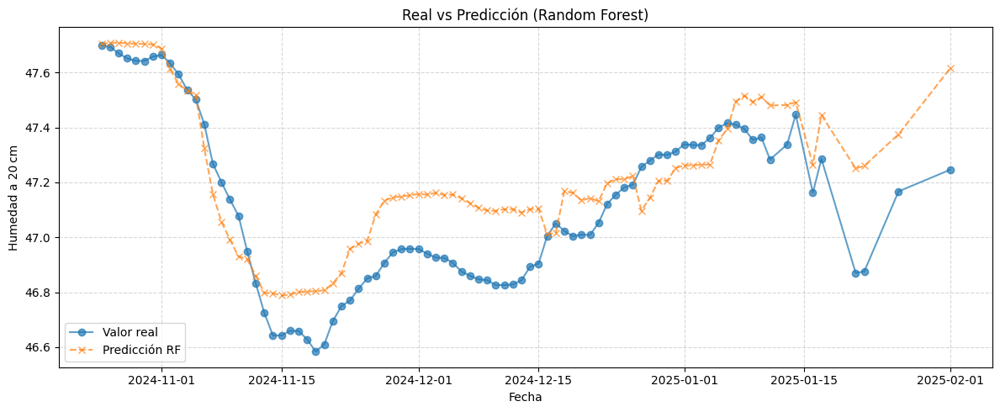

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection   import train_test_split
from sklearn.preprocessing    import StandardScaler
from sklearn.ensemble         import RandomForestRegressor
from sklearn.metrics          import mean_squared_error, r2_score

# --- 1) Construcción de X_full y capturar el índice temporal -------
X_full = pd.concat([medias_h29, medias_t29, medias_ec29], axis=1).dropna()
time_full = X_full.index  # DatetimeIndex

# --- 2) Variable objetivo y matriz de características -------------
y = X_full['VWC-20cm'].values
X = X_full.drop(columns=['VWC-20cm']).values
feature_names = X_full.drop(columns=['VWC-20cm']).columns.tolist()

# --- 3) División train/test sin barajar (mantener cronología) -------
X_train, X_test, y_train, y_test, t_train, t_test = train_test_split(
    X, y, time_full,
    test_size=0.3,
    random_state=42,
    shuffle=False
)

# --- 4) Escalado (opcional para RF) --------------------------------
scaler_X  = StandardScaler().fit(X_train)
X_train_s = scaler_X.transform(X_train)
X_test_s  = scaler_X.transform(X_test)

# --- 5) Entrenamiento RandomForestRegressor ------------------------
rf = RandomForestRegressor(
    n_estimators=100,
    max_depth=None,
    random_state=42,
    n_jobs=-1
)
rf.fit(X_train_s, y_train)

# --- 6) Predicción y evaluación ------------------------------------
y_pred_rf = rf.predict(X_test_s)
mse_rf   = mean_squared_error(y_test, y_pred_rf)
r2_rf     = r2_score(y_test, y_pred_rf)

print(f"Random Forest MSE: {mse_rf:.4f}")
print(f"Random Forest R²:   {r2_rf:.4f}")

# --- 7) Importancia de variables ----------------------------------
importances = rf.feature_importances_
imp_df = pd.DataFrame({
    'feature': feature_names,
    'importance': importances
}).sort_values('importance', ascending=False)

print("\nImportancia de variables (Random Forest):")
print(imp_df.to_string(index=False))

# --- 8) Gráfica comparativa real vs predicción con fechas reales ---
plt.figure(figsize=(12, 5))
plt.plot(t_test, y_test,   'o-', label='Valor real', alpha=0.7)
plt.plot(t_test, y_pred_rf,'x--', label='Predicción RF', alpha=0.7)
plt.xlabel('Fecha')
plt.ylabel('Humedad a 20 cm')
plt.title('Real vs Predicción (Random Forest)')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


### Random Forest no

Random Forest RMSE: 0.3227
Random Forest R²:   -0.3030

Importancia de variables (Random Forest):
      feature  importance
EC(dS/m)-41cm    0.908855
 Temp(C)-41cm    0.050550
     VWC-20cm    0.015185
EC(dS/m)-20cm    0.015126
 Temp(C)-20cm    0.010284


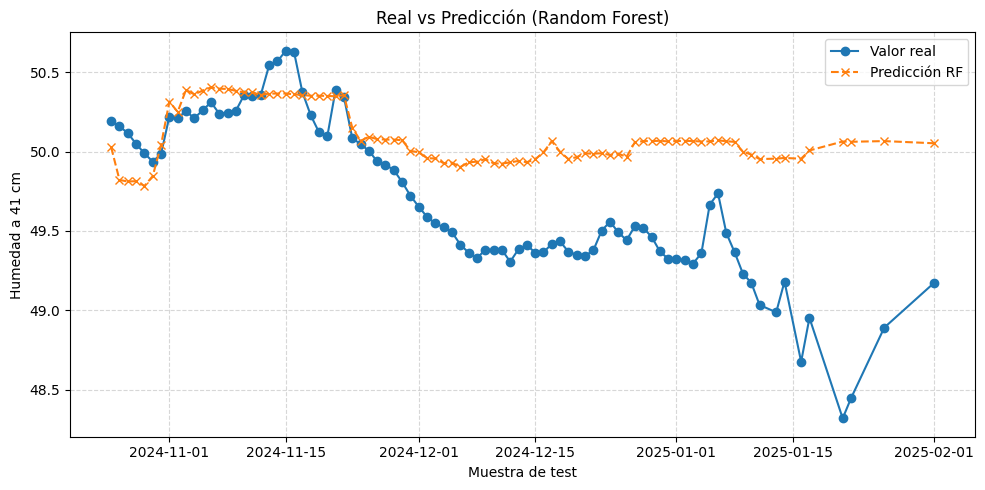

In [ ]:
X_full = pd.concat([medias_h29, medias_t29, medias_ec29], axis=1).dropna()
y      = X_full['VWC-41cm'].values
X      = X_full.drop(columns=['VWC-41cm']).values
feature_names = X_full.drop(columns=['VWC-41cm']).columns.tolist()

# 3) División train/test
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42, shuffle=False

)

# 4) Escalado (opcional para RF; no imprescindible)
scaler_X   = StandardScaler().fit(X_train)
X_train_s  = scaler_X.transform(X_train)
X_test_s   = scaler_X.transform(X_test)

# 5) Entrenamiento con RandomForestRegressor
rf = RandomForestRegressor(
    n_estimators=100,
    max_depth=None,
    random_state=42,
    n_jobs=-1
)
rf.fit(X_train_s, y_train)

# 6) Predicción y evaluación
y_pred_rf = rf.predict(X_test_s)
rmse_rf   = mean_squared_error(y_test, y_pred_rf)
r2_rf     = r2_score(y_test, y_pred_rf)

print(f"Random Forest RMSE: {rmse_rf:.4f}")
print(f"Random Forest R²:   {r2_rf:.4f}")

# 7) Importancias de variable
importances = rf.feature_importances_
imp_df = pd.DataFrame({
    'feature': feature_names,
    'importance': importances
}).sort_values('importance', ascending=False)

print("\nImportancia de variables (Random Forest):")
print(imp_df.to_string(index=False))

# 8) Gráfica comparativa real vs predicción
plt.figure(figsize=(10,5))
plt.plot(t_test,y_test,   'o-', label='Valor real')
plt.plot(t_test,y_pred_rf,'x--', label='Predicción RF')
plt.xlabel('Muestra de test')
plt.ylabel('Humedad a 41 cm')
plt.title('Real vs Predicción (Random Forest)')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


### Random Forest

Random Forest RMSE: 0.0037
Random Forest R²:   0.6734

Importancia de variables (Random Forest):
      feature  importance
     VWC-20cm    0.983258
EC(dS/m)-41cm    0.009379
 Temp(C)-41cm    0.004646
     VWC-41cm    0.002166
 Temp(C)-20cm    0.000551


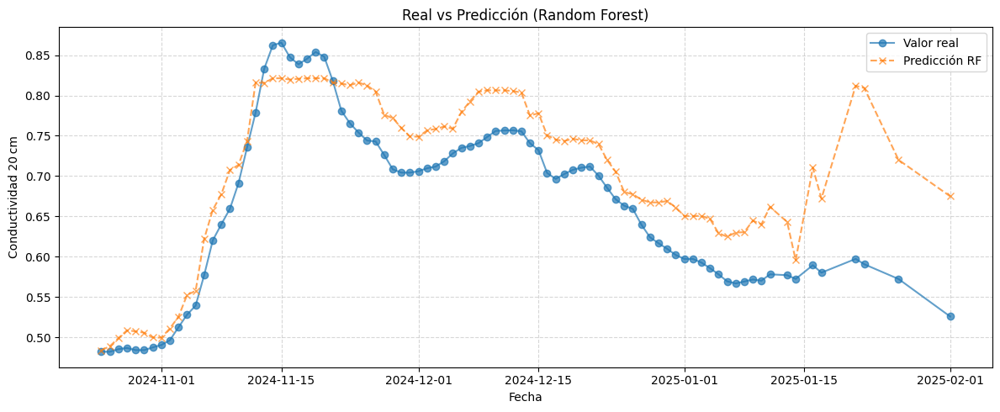

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection   import train_test_split
from sklearn.preprocessing    import StandardScaler
from sklearn.ensemble         import RandomForestRegressor
from sklearn.metrics          import mean_squared_error, r2_score

# --- 1) Construcción de X_full y capturar el índice temporal -------
X_full = pd.concat([medias_h29, medias_t29, medias_ec29], axis=1).dropna()
time_full = X_full.index  # DatetimeIndex

# --- 2) Variable objetivo y matriz de características -------------
y = X_full['EC(dS/m)-20cm'].values
X = X_full.drop(columns=['EC(dS/m)-20cm']).values
feature_names = X_full.drop(columns=['EC(dS/m)-20cm']).columns.tolist()

# --- 3) División train/test sin barajar (mantener cronología) -------
X_train, X_test, y_train, y_test, t_train, t_test = train_test_split(
    X, y, time_full,
    test_size=0.3,
    random_state=42,
    shuffle=False
)

# --- 4) Escalado (opcional para RF) --------------------------------
scaler_X  = StandardScaler().fit(X_train)
X_train_s = scaler_X.transform(X_train)
X_test_s  = scaler_X.transform(X_test)

# --- 5) Entrenamiento RandomForestRegressor ------------------------
rf = RandomForestRegressor(
    n_estimators=100,
    max_depth=None,
    random_state=42,
    n_jobs=-1
)
rf.fit(X_train_s, y_train)

# --- 6) Predicción y evaluación ------------------------------------
y_pred_rf = rf.predict(X_test_s)
mse_rf   = mean_squared_error(y_test, y_pred_rf)
r2_rf     = r2_score(y_test, y_pred_rf)

print(f"Random Forest MSE: {mse_rf:.4f}")
print(f"Random Forest R²:   {r2_rf:.4f}")

# --- 7) Importancia de variables ----------------------------------
importances = rf.feature_importances_
imp_df = pd.DataFrame({
    'feature': feature_names,
    'importance': importances
}).sort_values('importance', ascending=False)

print("\nImportancia de variables (Random Forest):")
print(imp_df.to_string(index=False))

# --- 8) Gráfica comparativa real vs predicción con fechas reales ---
plt.figure(figsize=(12, 5))
plt.plot(t_test, y_test,   'o-', label='Valor real', alpha=0.7)
plt.plot(t_test, y_pred_rf,'x--', label='Predicción RF', alpha=0.7)
plt.xlabel('Fecha')
plt.ylabel('Conductividad 20 cm')
plt.title('Real vs Predicción (Random Forest)')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


### Random Forest maLO

Random Forest RMSE: 0.1651
Random Forest R²:   -20.7840

Importancia de variables (Random Forest):
      feature  importance
     VWC-41cm    0.913409
     VWC-20cm    0.033418
EC(dS/m)-20cm    0.025875
 Temp(C)-41cm    0.023865
 Temp(C)-20cm    0.003433


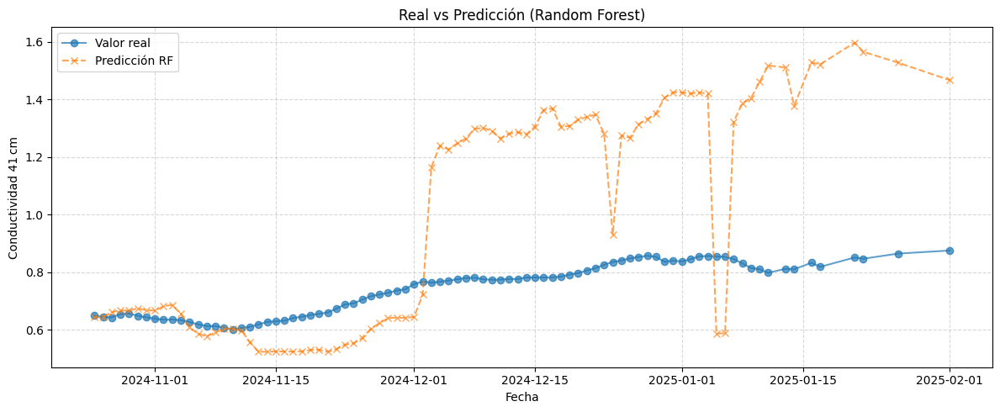

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection   import train_test_split
from sklearn.preprocessing    import StandardScaler
from sklearn.ensemble         import RandomForestRegressor
from sklearn.metrics          import mean_squared_error, r2_score

# --- 1) Construcción de X_full y capturar el índice temporal -------
X_full = pd.concat([medias_h29, medias_t29, medias_ec29], axis=1).dropna()
time_full = X_full.index  # DatetimeIndex

# --- 2) Variable objetivo y matriz de características -------------
y = X_full['EC(dS/m)-41cm'].values
X = X_full.drop(columns=['EC(dS/m)-41cm']).values
feature_names = X_full.drop(columns=['EC(dS/m)-41cm']).columns.tolist()

# --- 3) División train/test sin barajar (mantener cronología) -------
X_train, X_test, y_train, y_test, t_train, t_test = train_test_split(
    X, y, time_full,
    test_size=0.3,
    random_state=42,
    shuffle=False
)

# --- 4) Escalado (opcional para RF) --------------------------------
scaler_X  = StandardScaler().fit(X_train)
X_train_s = scaler_X.transform(X_train)
X_test_s  = scaler_X.transform(X_test)

# --- 5) Entrenamiento RandomForestRegressor ------------------------
rf = RandomForestRegressor(
    n_estimators=100,
    max_depth=None,
    random_state=42,
    n_jobs=-1
)
rf.fit(X_train_s, y_train)

# --- 6) Predicción y evaluación ------------------------------------
y_pred_rf = rf.predict(X_test_s)
rmse_rf   = mean_squared_error(y_test, y_pred_rf)
r2_rf     = r2_score(y_test, y_pred_rf)

print(f"Random Forest RMSE: {rmse_rf:.4f}")
print(f"Random Forest R²:   {r2_rf:.4f}")

# --- 7) Importancia de variables ----------------------------------
importances = rf.feature_importances_
imp_df = pd.DataFrame({
    'feature': feature_names,
    'importance': importances
}).sort_values('importance', ascending=False)

print("\nImportancia de variables (Random Forest):")
print(imp_df.to_string(index=False))

# --- 8) Gráfica comparativa real vs predicción con fechas reales ---
plt.figure(figsize=(12, 5))
plt.plot(t_test, y_test,   'o-', label='Valor real', alpha=0.7)
plt.plot(t_test, y_pred_rf,'x--', label='Predicción RF', alpha=0.7)
plt.xlabel('Fecha')
plt.ylabel('Conductividad 41 cm')
plt.title('Real vs Predicción (Random Forest)')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


# **Entrega final**

## **Uso de GridSearch para mejores hiperparámetros**

###  **XgBoost**

###  **RandomForest**

#### **VWC-20cm**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection   import train_test_split, GridSearchCV
from sklearn.preprocessing    import StandardScaler
from sklearn.ensemble         import RandomForestRegressor
from sklearn.metrics          import mean_squared_error, r2_score

# 1) Carga y preparación
# ----------------------
df = pd.read_excel('/content/DB_CropX_Aguacate.xlsx', sheet_name='CropX_BA29')
df['Fecha_Hora'] = pd.to_datetime(df['Fecha_Hora'])
df = df.set_index('Fecha_Hora').sort_index().asfreq('D')
target = 'VWC-20cm'

# 2) Split cronológico 70/30
# --------------------------
split = int(len(df) * 0.7)
df_daily = df.resample('D').mean(numeric_only=True)
train_df = df_daily.iloc[:split].copy()
test_df  = df_daily.iloc[split:].copy()

# 3) Preparar lag‑features para XGBoost
# -------------------------------------
def make_lag_features(df, lags=[1,2,3,7]):
    X = pd.DataFrame(index=df.index)
    for lag in lags:
        X[f'{target}_lag{lag}'] = df[target].shift(lag)
    for col in ['VWC-41cm','Temp(C)-20cm','EC(dS/m)-20cm']:
        X[f'{col}_lag1'] = df[col].shift(1)
    return X.dropna()

X_lags = make_lag_features(df)
y_lags = df[target].loc[X_lags.index]

split2 = int(len(X_lags) * 0.7)
X_train, X_test = X_lags.iloc[:split2], X_lags.iloc[split2:]
y_train, y_test = y_lags.iloc[:split2], y_lags.iloc[split2:]
t_test_lags     = X_test.index

# 4) Escalado y filtrado NaN en XGBoost
# -------------------------------------
scaler = StandardScaler().fit(X_train)
X_train_s = scaler.transform(X_train)
X_test_s  = scaler.transform(X_test)

mask_tr = np.isfinite(y_train)
X_train_s, y_train = X_train_s[mask_tr], y_train[mask_tr]

mask_te = np.isfinite(y_test)
X_test_s, y_test, t_test_lags = X_test_s[mask_te], y_test[mask_te], t_test_lags[mask_te]

# 4) Definimos el RandomForest y la malla de parámetros a explorar -----
rf = RandomForestRegressor(random_state=42)

param_grid = {
    'n_estimators': [50, 100, 200,1000],
    'max_depth':    [None, 5, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf':  [1, 2, 4],
    'max_features': ['log2', 'sqrt', None]
}

# 5) Creamos el GridSearchCV --------------------------------------------
grid_search = GridSearchCV(
    estimator=rf,
    param_grid=param_grid,
    cv=5,                   # 5‑fold cross‑validation
    scoring='neg_mean_squared_error',
    n_jobs=-1,              # usa todos los núcleos
    verbose=1
)

# 6) Ajustamos sólo sobre entrenamiento -------------------------------
grid_search.fit(X_train_s, y_train)

print("Mejores parámetros encontrados:")
print(grid_search.best_params_)
print("Mejor MSE (CV):", -grid_search.best_score_)

# 7) Evaluamos el mejor modelo sobre el test set -----------------------
best_rf = grid_search.best_estimator_
y_pred_train = best_rf.predict(X_train_s)
mse_train = mean_squared_error(y_train, y_pred_train)
r2_train = r2_score(y_train, y_pred_train)

print(f"\nTest MSE: {mse_train:.4f}")
print(f"Test R²:   {r2_train:.4f}")

y_pred = best_rf.predict(X_test_s)

mse_test = mean_squared_error(y_test, y_pred)
r2_test = r2_score(y_test, y_pred)

print(f"\nTest MSE: {mse_test:.4f}")
print(f"Test R²:   {r2_test:.4f}")

# 8) Importancia de variables del mejor modelo ------------------------
importances = best_rf.feature_importances_
print("\nImportancia de la variables:", importances)

# 9) Gráfica Real vs Predicción ----------------------------------------
plt.figure(figsize=(12,5))
plt.plot(t_test_lags, y_test,   'o-', label='Valor real', alpha=0.7)
plt.plot(t_test_lags, y_pred,   'x--',label='Predicción RF óptimo', alpha=0.7)
plt.xlabel('Fecha')
plt.ylabel('Humedad a 20 cm (VWC)')
plt.title('Real vs Predicción (Random Forest optimizado)')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


Fitting 5 folds for each of 432 candidates, totalling 2160 fits
Mejores parámetros encontrados:
{'max_depth': None, 'max_features': 'log2', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 1000}
Mejor MSE (CV): 0.8206294082227503


ValueError: Found input variables with inconsistent numbers of samples: [185, 79]


Test MSE: 0.0020
Test R²:   0.9986

Test MSE: 0.0133
Test R²:   0.8859

Importancia de la variables: [0.20871509 0.1960513  0.18238932 0.18601791 0.014382   0.00676757
 0.20567681]


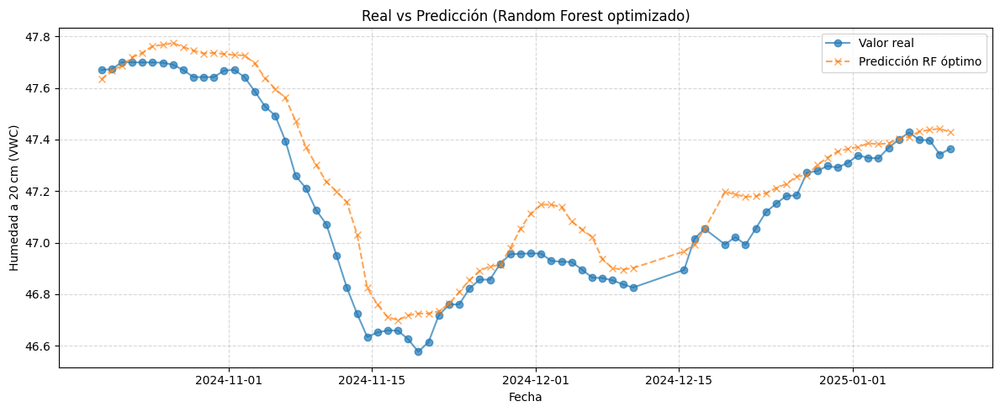

In [ ]:
# 7) Evaluamos el mejor modelo sobre el test set -----------------------
best_rf = grid_search.best_estimator_
y_pred_train = best_rf.predict(X_train_s)
mse_train = mean_squared_error(y_train, y_pred_train)
r2_train = r2_score(y_train, y_pred_train)

print(f"\nTrain MSE: {mse_train:.4f}")
print(f"Test R²:   {r2_train:.4f}")

y_pred = best_rf.predict(X_test_s)

mse_test = mean_squared_error(y_test, y_pred)
r2_test = r2_score(y_test, y_pred)

print(f"\nTest MSE: {mse_test:.4f}")
print(f"Test R²:   {r2_test:.4f}")

# 8) Importancia de variables del mejor modelo ------------------------
importances = best_rf.feature_importances_
print("\nImportancia de la variables:", importances)

# 9) Gráfica Real vs Predicción ----------------------------------------
plt.figure(figsize=(12,5))
plt.plot(t_test_lags, y_test,   'o-', label='Valor real', alpha=0.7)
plt.plot(t_test_lags, y_pred,   'x--',label='Predicción RF óptimo', alpha=0.7)
plt.xlabel('Fecha')
plt.ylabel('Humedad a 20 cm (VWC)')
plt.title('Real vs Predicción (Random Forest optimizado)')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

#### mejora de la mejora

--- Paso 1: Entrenando el Primer Random Forest (RF1) con parámetros óptimos ---
MSE del Primer Random Forest (RF1): 0.0232
R2 Score del Primer Random Forest (RF1): 0.7519
Longitud de X_train: 203
Longitud de train_preds_rf1: 203
Longitud de X_test: 87
Longitud de test_preds_rf1: 87

Predicciones de RF1 generadas como nueva característica.

--- Paso 2: Añadiendo predicciones de RF1 como nueva característica ---
Dimensiones de X_train_enhanced (con nueva característica): (203, 6)
Dimensiones de X_test_enhanced (con nueva característica): (87, 6)

--- Paso 3: Entrenando el Segundo Random Forest (RF2) ---
MSE del Segundo Random Forest (RF2 - Refinado): 0.0278
R2 Score del Segundo Random Forest (RF2 - Refinado): 0.7028
OOB Score del Segundo Random Forest (RF2 - Refinado): 0.9942

--- Comparación de Rendimiento ---
MSE del Primer RF (base): 0.0232
MSE del Segundo RF (iterativo/secuencial): 0.0278
R2 del Primer RF (base): 0.7519
R2 del Segundo RF (iterativo/secuencial): 0.7028

El segundo mod

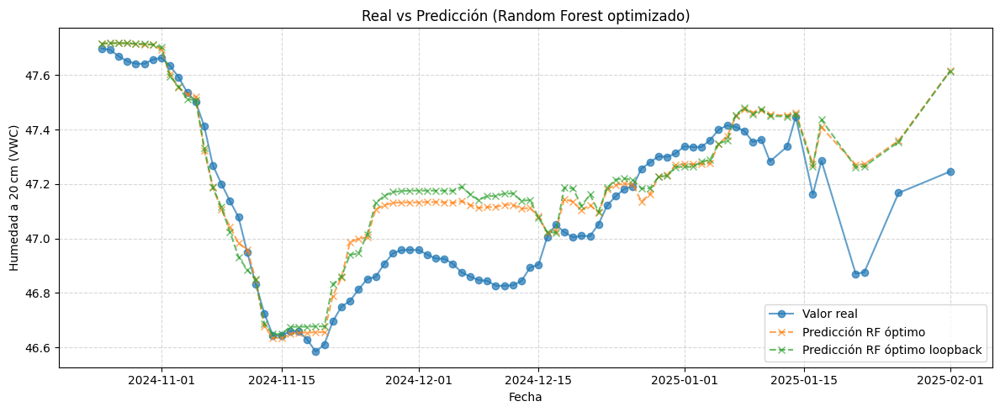

In [ ]:
#Mejora del mejor modelo xd
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from sklearn.datasets import make_classification # Para generar datos de ejemplo

# --- 0. Configuración de parámetros óptimos (los que encontraste con GridSearch) ---
best_params = {
    'max_depth': None,
    'max_features': None,
    'min_samples_leaf': 4,
    'min_samples_split': 2,
    'n_estimators': 200
}

X_full = pd.concat([medias_h29, medias_t29, medias_ec29], axis=1).dropna()
time_full = X_full.index  # DatetimeIndex

# --- 2) Variable objetivo y matriz de características -------------
y = X_full['VWC-20cm'].values
X = X_full.drop(columns=['VWC-20cm']).values
feature_names = X_full.drop(columns=['VWC-20cm']).columns.tolist()

# --- 3) División train/test sin barajar (mantener cronología) -------
X_train, X_test, y_train, y_test, t_train, t_test = train_test_split(
    X, y, time_full,
    test_size=0.3,
    random_state=42,
    shuffle=False
)

# 3) Escalado (opcional)
scaler = StandardScaler().fit(X_train)
X_train_s = scaler.transform(X_train)
X_test_s  = scaler.transform(X_test)

# --- 1. Entrenar el Primer Random Forest (RF1) con los Parámetros Óptimos ---
print("--- Paso 1: Entrenando el Primer Random Forest (RF1) con parámetros óptimos ---")
rf_model_1 = RandomForestRegressor(**best_params, random_state=42, oob_score=True)
rf_model_1.fit(X_train_s, y_train)

# Evaluar el primer modelo
y_pred_1 = rf_model_1.predict(X_test_s)
mse_1 = mean_squared_error(y_test, y_pred_1)
r2_1 = r2_score(y_test, y_pred_1)
print(f"MSE del Primer Random Forest (RF1): {mse_1:.4f}")
print(f"R2 Score del Primer Random Forest (RF1): {r2_1:.4f}")


# --- 2. Obtener las Predicciones de RF1 como Nueva Característica ---
# Para regresión, simplemente usamos predict() para obtener la salida continua del modelo
train_preds_rf1 = rf_model_1.predict(X_train_s)
test_preds_rf1 = rf_model_1.predict(X_test_s)
# Verificar las dimensiones antes de la asignación
print(f"Longitud de X_train: {len(X_train)}")
print(f"Longitud de train_preds_rf1: {len(train_preds_rf1)}")
print(f"Longitud de X_test: {len(X_test)}")
print(f"Longitud de test_preds_rf1: {len(test_preds_rf1)}\n")

print("Predicciones de RF1 generadas como nueva característica.\n")

# --- 3. Añadir las Predicciones como Nuevas Características ---
print("--- Paso 2: Añadiendo predicciones de RF1 como nueva característica ---")

# train_preds_rf1 es un array 1D, necesitamos que sea 2D (n_samples, 1) para hstack
X_train_enhanced = np.hstack((X_train_s, train_preds_rf1.reshape(-1, 1)))
X_test_enhanced = np.hstack((X_test_s, test_preds_rf1.reshape(-1, 1)))


print(f"Dimensiones de X_train_enhanced (con nueva característica): {X_train_enhanced.shape}")
print(f"Dimensiones de X_test_enhanced (con nueva característica): {X_test_enhanced.shape}\n")

# --- 4. Entrenar un Segundo Random Forest (RF2) con las Características Aumentadas ---
print("--- Paso 3: Entrenando el Segundo Random Forest (RF2) ---")
# Usamos los mismos parámetros óptimos para RF2.
rf_model_2 = RandomForestRegressor(**best_params, random_state=42, oob_score=True) # ¡Usamos Regressor!
rf_model_2.fit(X_train_enhanced, y_train)

# Evaluar el segundo modelo
y_pred_2 = rf_model_2.predict(X_test_enhanced)
mse_2 = mean_squared_error(y_test, y_pred_2)
r2_2 = r2_score(y_test, y_pred_2)
print(f"MSE del Segundo Random Forest (RF2 - Refinado): {mse_2:.4f}")
print(f"R2 Score del Segundo Random Forest (RF2 - Refinado): {r2_2:.4f}")
print(f"OOB Score del Segundo Random Forest (RF2 - Refinado): {rf_model_2.oob_score_:.4f}\n")

# --- Comparación Final ---
print("--- Comparación de Rendimiento ---")
print(f"MSE del Primer RF (base): {mse_1:.4f}")
print(f"MSE del Segundo RF (iterativo/secuencial): {mse_2:.4f}")
print(f"R2 del Primer RF (base): {r2_1:.4f}")
print(f"R2 del Segundo RF (iterativo/secuencial): {r2_2:.4f}")

if mse_2 < mse_1: # Un MSE menor es mejor
    print("\n¡El segundo modelo mejoró el rendimiento (menor MSE) al incorporar las predicciones del primero!")
elif mse_2 > mse_1:
    print("\nEl segundo modelo no mejoró el rendimiento. Esto puede ocurrir si las predicciones del primer modelo no añaden nueva información significativa o si el problema ya estaba casi resuelto por el primer modelo.")
else:
    print("\nAmbos modelos tuvieron un rendimiento similar.")


plt.figure(figsize=(12,5))
plt.plot(t_test, y_test,   'o-', label='Valor real', alpha=0.7)
plt.plot(t_test, y_pred_1,   'x--',label='Predicción RF óptimo', alpha=0.7)
plt.plot(t_test, y_pred_2,   'x--',label='Predicción RF óptimo loopback', alpha=0.7)
plt.xlabel('Fecha')
plt.ylabel('Humedad a 20 cm (VWC)')
plt.title('Real vs Predicción (Random Forest optimizado)')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

#### **EC(dS/m)-20cm**

Fitting 5 folds for each of 432 candidates, totalling 2160 fits
Mejores parámetros encontrados:
{'max_depth': None, 'max_features': None, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 50}
Mejor MSE (CV): 0.16709446193680316

Train MSE: 0.0002
Test R²:   0.9993

Test MSE: 0.0005
Test R²:   0.9592

Importancia de la variables: [0.14810283 0.07709817 0.03927992 0.03568353 0.69439443 0.00407968
 0.00136145]


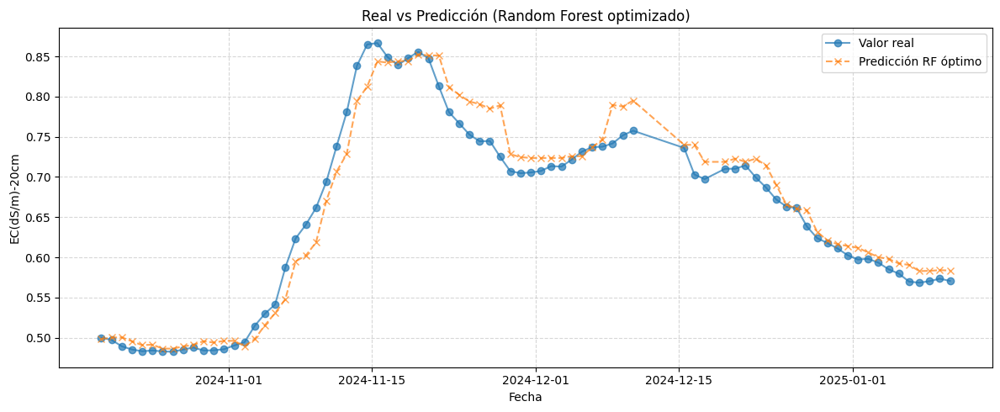

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection   import train_test_split, GridSearchCV
from sklearn.preprocessing    import StandardScaler
from sklearn.ensemble         import RandomForestRegressor
from sklearn.metrics          import mean_squared_error, r2_score

# 1) Carga y preparación
# ----------------------
df = pd.read_excel('/content/DB_CropX_Aguacate.xlsx', sheet_name='CropX_BA29')
df['Fecha_Hora'] = pd.to_datetime(df['Fecha_Hora'])
df = df.set_index('Fecha_Hora').sort_index().asfreq('D')
target = 'EC(dS/m)-20cm'

# 2) Split cronológico 70/30
# --------------------------
split = int(len(df) * 0.7)
train_df = df.iloc[:split].copy()
test_df  = df.iloc[split:].copy()

# 3) Preparar lag‑features para XGBoost
# -------------------------------------
def make_lag_features(df, lags=[1,2,3,7]):
    X = pd.DataFrame(index=df.index)
    # Lags de conductividad a 20cm
    for lag in lags:
        X[f'{target}_lag{lag}'] = df[target].shift(lag)
    # Lags de otras variables relevantes
    for col in ['VWC-20cm','Temp(C)-20cm','VWC-41cm']:
        X[f'{col}_lag1'] = df[col].shift(1)
    return X.dropna()

X_lags = make_lag_features(df)
y_lags = df[target].loc[X_lags.index]

split2 = int(len(X_lags) * 0.7)
X_train, X_test = X_lags.iloc[:split2], X_lags.iloc[split2:]
y_train, y_test = y_lags.iloc[:split2], y_lags.iloc[split2:]
t_test_lags     = X_test.index

# 4) Escalado y limpieza NaN para XGBoost
# ---------------------------------------
scaler = StandardScaler().fit(X_train)
X_train_s = scaler.transform(X_train)
X_test_s  = scaler.transform(X_test)

mask_tr    = np.isfinite(y_train)
X_train_s, y_train = X_train_s[mask_tr], y_train[mask_tr]

mask_te    = np.isfinite(y_test)
X_test_s, y_test, t_test_lags = X_test_s[mask_te], y_test[mask_te], t_test_lags[mask_te]


# 4) Definimos el RandomForest y la malla de parámetros a explorar -----
rf = RandomForestRegressor(random_state=42)

param_grid = {
    'n_estimators': [50, 100, 200,1000],
    'max_depth':    [None, 5, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf':  [1, 2, 4],
    'max_features': ['log2', 'sqrt', None]
}

# 5) Creamos el GridSearchCV --------------------------------------------
grid_search = GridSearchCV(
    estimator=rf,
    param_grid=param_grid,
    cv=5,                   # 5‑fold cross‑validation
    scoring='neg_mean_squared_error',
    n_jobs=-1,              # usa todos los núcleos
    verbose=1
)

# 6) Ajustamos sólo sobre entrenamiento -------------------------------
grid_search.fit(X_train_s, y_train)

print("Mejores parámetros encontrados:")
print(grid_search.best_params_)
print("Mejor MSE (CV):", -grid_search.best_score_)

# 7) Evaluamos el mejor modelo sobre el test set -----------------------
best_rf = grid_search.best_estimator_
y_pred_train = best_rf.predict(X_train_s)
mse_train = mean_squared_error(y_train, y_pred_train)
r2_train = r2_score(y_train, y_pred_train)

print(f"\nTrain MSE: {mse_train:.4f}")
print(f"Test R²:   {r2_train:.4f}")

y_pred = best_rf.predict(X_test_s)

mse_test = mean_squared_error(y_test, y_pred)
r2_test = r2_score(y_test, y_pred)

print(f"\nTest MSE: {mse_test:.4f}")
print(f"Test R²:   {r2_test:.4f}")

# 8) Importancia de variables del mejor modelo ------------------------
importances = best_rf.feature_importances_
print("\nImportancia de la variables:", importances)

# 9) Gráfica Real vs Predicción ----------------------------------------
plt.figure(figsize=(12,5))
plt.plot(t_test_lags, y_test,   'o-', label='Valor real', alpha=0.7)
plt.plot(t_test_lags, y_pred,   'x--',label='Predicción RF óptimo', alpha=0.7)
plt.xlabel('Fecha')
plt.ylabel('EC(dS/m)-20cm')
plt.title('Real vs Predicción (Random Forest optimizado)')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


#### MEjora de la mejora

--- Paso 1: Entrenando el Primer Random Forest (RF1) con parámetros óptimos ---
MSE del Primer Random Forest (RF1): 0.0037
R2 Score del Primer Random Forest (RF1): 0.6679
Longitud de X_train: 203
Longitud de train_preds_rf1: 203
Longitud de X_test: 87
Longitud de test_preds_rf1: 87

Predicciones de RF1 generadas como nueva característica.

--- Paso 2: Añadiendo predicciones de RF1 como nueva característica ---
Dimensiones de X_train_enhanced (con nueva característica): (203, 6)
Dimensiones de X_test_enhanced (con nueva característica): (87, 6)

--- Paso 3: Entrenando el Segundo Random Forest (RF2) ---
MSE del Segundo Random Forest (RF2 - Refinado): 0.0036
R2 Score del Segundo Random Forest (RF2 - Refinado): 0.6746
OOB Score del Segundo Random Forest (RF2 - Refinado): 0.9940

--- Comparación de Rendimiento ---
MSE del Primer RF (base): 0.0037
MSE del Segundo RF (iterativo/secuencial): 0.0036
R2 del Primer RF (base): 0.6679
R2 del Segundo RF (iterativo/secuencial): 0.6746

¡El segundo mo

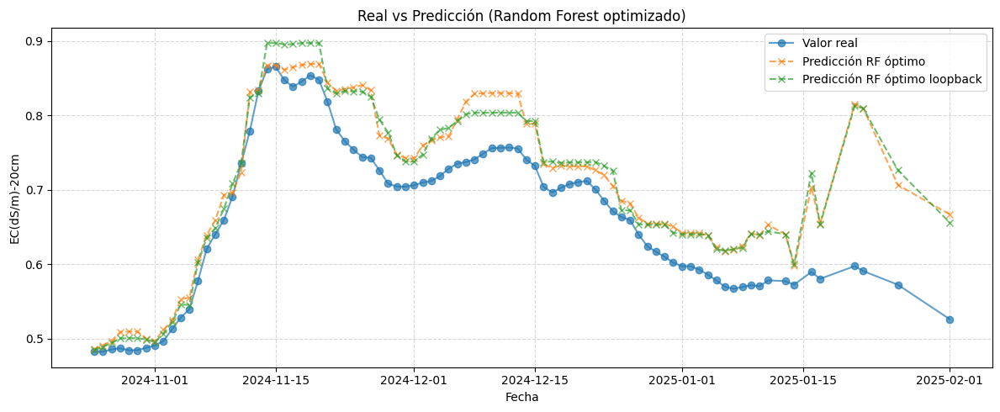

In [ ]:
#Mejora del mejor modelo xd
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from sklearn.datasets import make_classification # Para generar datos de ejemplo

# --- 0. Configuración de parámetros óptimos (los que encontraste con GridSearch) ---
best_params = {
    'max_depth': None,
    'max_features': None,
    'min_samples_leaf': 4,
    'min_samples_split': 2,
    'n_estimators': 200
}

X_full = pd.concat([medias_h29, medias_t29, medias_ec29], axis=1).dropna()
time_full = X_full.index  # DatetimeIndex

# --- 2) Variable objetivo y matriz de características -------------
y = X_full['EC(dS/m)-20cm'].values
X = X_full.drop(columns=['EC(dS/m)-20cm']).values
feature_names = X_full.drop(columns=['EC(dS/m)-20cm']).columns.tolist()

# --- 3) División train/test sin barajar (mantener cronología) -------
X_train, X_test, y_train, y_test, t_train, t_test = train_test_split(
    X, y, time_full,
    test_size=0.3,
    random_state=42,
    shuffle=False
)

# 3) Escalado (opcional)
scaler = StandardScaler().fit(X_train)
X_train_s = scaler.transform(X_train)
X_test_s  = scaler.transform(X_test)

# --- 1. Entrenar el Primer Random Forest (RF1) con los Parámetros Óptimos ---
print("--- Paso 1: Entrenando el Primer Random Forest (RF1) con parámetros óptimos ---")
rf_model_1 = RandomForestRegressor(**best_params, random_state=42, oob_score=True)
rf_model_1.fit(X_train_s, y_train)

# Evaluar el primer modelo
y_pred_1 = rf_model_1.predict(X_test_s)
mse_1 = mean_squared_error(y_test, y_pred_1)
r2_1 = r2_score(y_test, y_pred_1)
print(f"MSE del Primer Random Forest (RF1): {mse_1:.4f}")
print(f"R2 Score del Primer Random Forest (RF1): {r2_1:.4f}")


# --- 2. Obtener las Predicciones de RF1 como Nueva Característica ---
# Para regresión, simplemente usamos predict() para obtener la salida continua del modelo
train_preds_rf1 = rf_model_1.predict(X_train_s)
test_preds_rf1 = rf_model_1.predict(X_test_s)
# Verificar las dimensiones antes de la asignación
print(f"Longitud de X_train: {len(X_train)}")
print(f"Longitud de train_preds_rf1: {len(train_preds_rf1)}")
print(f"Longitud de X_test: {len(X_test)}")
print(f"Longitud de test_preds_rf1: {len(test_preds_rf1)}\n")

print("Predicciones de RF1 generadas como nueva característica.\n")

# --- 3. Añadir las Predicciones como Nuevas Características ---
print("--- Paso 2: Añadiendo predicciones de RF1 como nueva característica ---")

# train_preds_rf1 es un array 1D, necesitamos que sea 2D (n_samples, 1) para hstack
X_train_enhanced = np.hstack((X_train_s, train_preds_rf1.reshape(-1, 1)))
X_test_enhanced = np.hstack((X_test_s, test_preds_rf1.reshape(-1, 1)))


print(f"Dimensiones de X_train_enhanced (con nueva característica): {X_train_enhanced.shape}")
print(f"Dimensiones de X_test_enhanced (con nueva característica): {X_test_enhanced.shape}\n")

# --- 4. Entrenar un Segundo Random Forest (RF2) con las Características Aumentadas ---
print("--- Paso 3: Entrenando el Segundo Random Forest (RF2) ---")
# Usamos los mismos parámetros óptimos para RF2.
rf_model_2 = RandomForestRegressor(**best_params, random_state=42, oob_score=True) # ¡Usamos Regressor!
rf_model_2.fit(X_train_enhanced, y_train)

# Evaluar el segundo modelo
y_pred_2 = rf_model_2.predict(X_test_enhanced)
mse_2 = mean_squared_error(y_test, y_pred_2)
r2_2 = r2_score(y_test, y_pred_2)
print(f"MSE del Segundo Random Forest (RF2 - Refinado): {mse_2:.4f}")
print(f"R2 Score del Segundo Random Forest (RF2 - Refinado): {r2_2:.4f}")
print(f"OOB Score del Segundo Random Forest (RF2 - Refinado): {rf_model_2.oob_score_:.4f}\n")

# --- Comparación Final ---
print("--- Comparación de Rendimiento ---")
print(f"MSE del Primer RF (base): {mse_1:.4f}")
print(f"MSE del Segundo RF (iterativo/secuencial): {mse_2:.4f}")
print(f"R2 del Primer RF (base): {r2_1:.4f}")
print(f"R2 del Segundo RF (iterativo/secuencial): {r2_2:.4f}")

if mse_2 < mse_1: # Un MSE menor es mejor
    print("\n¡El segundo modelo mejoró el rendimiento (menor MSE) al incorporar las predicciones del primero!")
elif mse_2 > mse_1:
    print("\nEl segundo modelo no mejoró el rendimiento. Esto puede ocurrir si las predicciones del primer modelo no añaden nueva información significativa o si el problema ya estaba casi resuelto por el primer modelo.")
else:
    print("\nAmbos modelos tuvieron un rendimiento similar.")


plt.figure(figsize=(12,5))
plt.plot(t_test, y_test,   'o-', label='Valor real', alpha=0.7)
plt.plot(t_test, y_pred_1,   'x--',label='Predicción RF óptimo', alpha=0.7)
plt.plot(t_test, y_pred_2,   'x--',label='Predicción RF óptimo loopback', alpha=0.7)
plt.xlabel('Fecha')
plt.ylabel('EC(dS/m)-20cm')
plt.title('Real vs Predicción (Random Forest optimizado)')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

## **XGboost**

Fitting 5 folds for each of 324 candidates, totalling 1620 fits
Mejores hiperparámetros XGBoost:
{'colsample_bytree': 0.6, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200, 'subsample': 1.0}
Mejor MSE (CV): 0.831687558264442

Train MSE: 0.0001
Test R²:   0.9999

Test MSE: 0.0138
Test R²:   0.8817


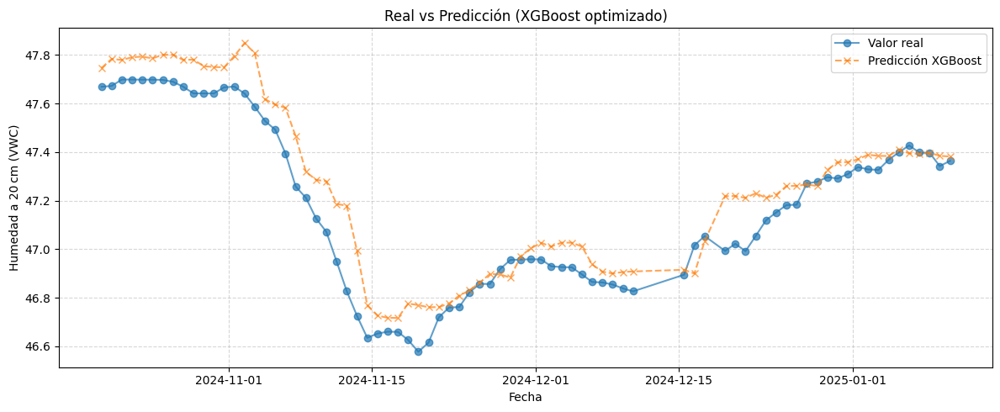

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection   import train_test_split, GridSearchCV
from sklearn.preprocessing    import StandardScaler
from sklearn.metrics          import mean_squared_error, r2_score
from xgboost                  import XGBRegressor

# 1) Carga y preparación
# ----------------------
df = pd.read_excel('/content/DB_CropX_Aguacate.xlsx', sheet_name='CropX_BA29')
df['Fecha_Hora'] = pd.to_datetime(df['Fecha_Hora'])
df = df.set_index('Fecha_Hora').sort_index().asfreq('D')
target = 'VWC-20cm'

# 2) Split cronológico 70/30
# --------------------------
split = int(len(df) * 0.7)
df_daily = df.resample('D').mean(numeric_only=True)
train_df = df_daily.iloc[:split].copy()
test_df  = df_daily.iloc[split:].copy()

# 3) Preparar lag‑features para XGBoost
# -------------------------------------
def make_lag_features(df, lags=[1,2,3,7]):
    X = pd.DataFrame(index=df.index)
    for lag in lags:
        X[f'{target}_lag{lag}'] = df[target].shift(lag)
    for col in ['VWC-41cm','Temp(C)-20cm','EC(dS/m)-20cm']:
        X[f'{col}_lag1'] = df[col].shift(1)
    return X.dropna()

X_lags = make_lag_features(df)
y_lags = df[target].loc[X_lags.index]

split2 = int(len(X_lags) * 0.7)
X_train, X_test = X_lags.iloc[:split2], X_lags.iloc[split2:]
y_train, y_test = y_lags.iloc[:split2], y_lags.iloc[split2:]
t_test_lags     = X_test.index

# 4) Escalado y filtrado NaN en XGBoost
# -------------------------------------
scaler = StandardScaler().fit(X_train)
X_train_s = scaler.transform(X_train)
X_test_s  = scaler.transform(X_test)

mask_tr = np.isfinite(y_train)
X_train_s, y_train = X_train_s[mask_tr], y_train[mask_tr]

mask_te = np.isfinite(y_test)
X_test_s, y_test, t_test_lags = X_test_s[mask_te], y_test[mask_te], t_test_lags[mask_te]

# 4) Definir XGBoost y la malla de hiperparámetros
# ------------------------------------------------
xgb = XGBRegressor(
    objective='reg:squarederror',
    random_state=42,
    n_jobs=-1
)

param_grid = {
    'n_estimators':    [50, 100, 200],
    'max_depth':       [3, 5, 7, 10],
    'learning_rate':   [0.01, 0.1, 0.2],
    'subsample':       [0.6, 0.8, 1.0],
    'colsample_bytree':[0.6, 0.8, 1.0]
}

# 5) Configurar GridSearchCV
# --------------------------
grid_search = GridSearchCV(
    estimator=xgb,
    param_grid=param_grid,
    cv=5,                             # 5‑fold cross‑validation
    scoring='neg_mean_squared_error',
    n_jobs=-1,
    verbose=1
)

# 6) Ajustar el grid search solo con el conjunto de entrenamiento
# ---------------------------------------------------------------
grid_search.fit(X_train_s, y_train)

print("Mejores hiperparámetros XGBoost:")
print(grid_search.best_params_)
print("Mejor MSE (CV):", -grid_search.best_score_)

# 7) Evaluar el mejor modelo en el conjunto de test
# -------------------------------------------------
best_xgb = grid_search.best_estimator_
y_pred_train = best_xgb.predict(X_train_s)
mse_train = mean_squared_error(y_train, y_pred_train)
r2_train = r2_score(y_train, y_pred_train)

print(f"\nTrain MSE: {mse_train:.4f}")
print(f"Test R²:   {r2_train:.4f}")

y_pred   = best_xgb.predict(X_test_s)

mse_test  = mean_squared_error(y_test, y_pred)
rmse_test = np.sqrt(mse_test)
r2_test   = r2_score(y_test, y_pred)

print(f"\nTest MSE: {mse_test:.4f}")
print(f"Test R²:   {r2_test:.4f}")


# 9) Gráfica Real vs Predicción
# -----------------------------
plt.figure(figsize=(12,5))
plt.plot(t_test_lags, y_test, 'o-',  label='Valor real',    alpha=0.7)
plt.plot(t_test_lags, y_pred, 'x--', label='Predicción XGBoost', alpha=0.7)
plt.xlabel('Fecha')
plt.ylabel('Humedad a 20 cm (VWC)')
plt.title('Real vs Predicción (XGBoost optimizado)')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


Fitting 5 folds for each of 324 candidates, totalling 1620 fits
Mejores hiperparámetros XGBoost:
{'colsample_bytree': 0.8, 'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 200, 'subsample': 0.8}
Mejor MSE (CV): 0.1677033878446586

Train MSE: 0.0000
Test R²:   1.0000

Test MSE: 0.0009
Test R²:   0.9312


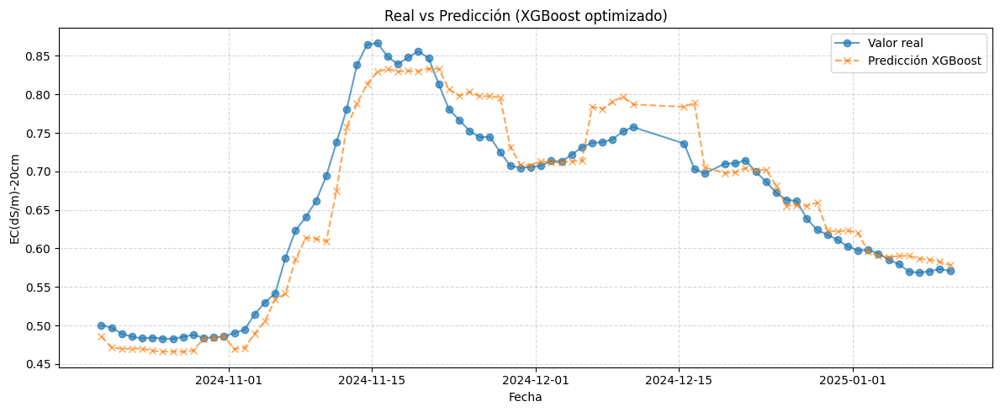

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection   import train_test_split, GridSearchCV
from sklearn.preprocessing    import StandardScaler
from sklearn.metrics          import mean_squared_error, r2_score
from xgboost                  import XGBRegressor

# 1) Carga y preparación
# ----------------------
df = pd.read_excel('/content/DB_CropX_Aguacate.xlsx', sheet_name='CropX_BA29')
df['Fecha_Hora'] = pd.to_datetime(df['Fecha_Hora'])
df = df.set_index('Fecha_Hora').sort_index().asfreq('D')
target = 'EC(dS/m)-20cm'

# 2) Split cronológico 70/30
# --------------------------
split = int(len(df) * 0.7)
train_df = df.iloc[:split].copy()
test_df  = df.iloc[split:].copy()

# 3) Preparar lag‑features para XGBoost
# -------------------------------------
def make_lag_features(df, lags=[1,2,3,7]):
    X = pd.DataFrame(index=df.index)
    # Lags de conductividad a 20cm
    for lag in lags:
        X[f'{target}_lag{lag}'] = df[target].shift(lag)
    # Lags de otras variables relevantes
    for col in ['VWC-20cm','Temp(C)-20cm','VWC-41cm']:
        X[f'{col}_lag1'] = df[col].shift(1)
    return X.dropna()

X_lags = make_lag_features(df)
y_lags = df[target].loc[X_lags.index]

split2 = int(len(X_lags) * 0.7)
X_train, X_test = X_lags.iloc[:split2], X_lags.iloc[split2:]
y_train, y_test = y_lags.iloc[:split2], y_lags.iloc[split2:]
t_test_lags     = X_test.index

# 4) Escalado y limpieza NaN para XGBoost
# ---------------------------------------
scaler = StandardScaler().fit(X_train)
X_train_s = scaler.transform(X_train)
X_test_s  = scaler.transform(X_test)

mask_tr    = np.isfinite(y_train)
X_train_s, y_train = X_train_s[mask_tr], y_train[mask_tr]

mask_te    = np.isfinite(y_test)
X_test_s, y_test, t_test_lags = X_test_s[mask_te], y_test[mask_te], t_test_lags[mask_te]

# 4) Definir XGBoost y la malla de hiperparámetros
# ------------------------------------------------
xgb = XGBRegressor(
    objective='reg:squarederror',
    random_state=42,
    n_jobs=-1
)

param_grid = {
    'n_estimators':    [50, 100, 200],
    'max_depth':       [3, 5, 7, 10],
    'learning_rate':   [0.01, 0.1, 0.2],
    'subsample':       [0.6, 0.8, 1.0],
    'colsample_bytree':[0.6, 0.8, 1.0]
}

# 5) Configurar GridSearchCV
# --------------------------
grid_search = GridSearchCV(
    estimator=xgb,
    param_grid=param_grid,
    cv=5,                             # 5‑fold cross‑validation
    scoring='neg_mean_squared_error',
    n_jobs=-1,
    verbose=1
)

# 6) Ajustar el grid search solo con el conjunto de entrenamiento
# ---------------------------------------------------------------
grid_search.fit(X_train_s, y_train)

print("Mejores hiperparámetros XGBoost:")
print(grid_search.best_params_)
print("Mejor MSE (CV):", -grid_search.best_score_)

# 7) Evaluar el mejor modelo en el conjunto de test
# -------------------------------------------------
best_xgb = grid_search.best_estimator_
y_pred_train = best_xgb.predict(X_train_s)
mse_train = mean_squared_error(y_train, y_pred_train)
r2_train = r2_score(y_train, y_pred_train)

print(f"\nTrain MSE: {mse_train:.4f}")
print(f"Test R²:   {r2_train:.4f}")
y_pred   = best_xgb.predict(X_test_s)

mse_test  = mean_squared_error(y_test, y_pred)
rmse_test = np.sqrt(mse_test)
r2_test   = r2_score(y_test, y_pred)

print(f"\nTest MSE: {mse_test:.4f}")
print(f"Test R²:   {r2_test:.4f}")


# 9) Gráfica Real vs Predicción
# -----------------------------
plt.figure(figsize=(12,5))
plt.plot(t_test_lags, y_test, 'o-',  label='Valor real',    alpha=0.7)
plt.plot(t_test_lags, y_pred, 'x--', label='Predicción XGBoost', alpha=0.7)
plt.xlabel('Fecha')
plt.ylabel('EC(dS/m)-20cm')
plt.title('Real vs Predicción (XGBoost optimizado)')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


In [ ]:
print(f"\nTrain MSE: {mse_train}")
print(f"Test R²:   {r2_train}")


Train MSE: 1.5005188250115936e-06
Test R²:   0.999994453191713


## **LSTM**

In [ ]:
pip install tensorflow

[I 2025-07-17 01:06:04,307] A new study created in memory with name: lstm_hyperparameter_tuning


Iniciando la optimización de hiperparámetros con Optuna...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


[I 2025-07-17 01:06:17,199] Trial 0 finished with value: 0.18640603633111943 and parameters: {'time_steps': 5, 'lstm_units': 32, 'dropout_rate': 0.1, 'learning_rate': 0.00041704254142286467, 'num_lstm_layers': 2}. Best is trial 0 with value: 0.18640603633111943.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 271ms/step


[I 2025-07-17 01:06:31,721] Trial 1 finished with value: 0.35667943612684494 and parameters: {'time_steps': 20, 'lstm_units': 96, 'dropout_rate': 0.5, 'learning_rate': 0.0035999495856118067, 'num_lstm_layers': 2}. Best is trial 0 with value: 0.18640603633111943.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


[I 2025-07-17 01:06:54,203] Trial 2 finished with value: 0.18213198850679307 and parameters: {'time_steps': 30, 'lstm_units': 128, 'dropout_rate': 0.1, 'learning_rate': 0.0005484822253675766, 'num_lstm_layers': 2}. Best is trial 2 with value: 0.18213198850679307.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


[I 2025-07-17 01:07:08,807] Trial 3 finished with value: 0.21198926968794624 and parameters: {'time_steps': 20, 'lstm_units': 64, 'dropout_rate': 0.5, 'learning_rate': 0.00042357500468691094, 'num_lstm_layers': 1}. Best is trial 2 with value: 0.18213198850679307.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


[I 2025-07-17 01:07:18,708] Trial 4 finished with value: 0.38347850610868556 and parameters: {'time_steps': 10, 'lstm_units': 32, 'dropout_rate': 0.1, 'learning_rate': 0.0003485320687372292, 'num_lstm_layers': 1}. Best is trial 2 with value: 0.18213198850679307.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


[I 2025-07-17 01:07:28,637] Trial 5 finished with value: 0.17461559949015287 and parameters: {'time_steps': 5, 'lstm_units': 96, 'dropout_rate': 0.30000000000000004, 'learning_rate': 0.0021241514406905183, 'num_lstm_layers': 1}. Best is trial 5 with value: 0.17461559949015287.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


[I 2025-07-17 01:07:39,252] Trial 6 finished with value: 0.10796791533205646 and parameters: {'time_steps': 30, 'lstm_units': 80, 'dropout_rate': 0.30000000000000004, 'learning_rate': 0.004324408700165292, 'num_lstm_layers': 1}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


[I 2025-07-17 01:07:51,587] Trial 7 finished with value: 0.25429967056626385 and parameters: {'time_steps': 25, 'lstm_units': 32, 'dropout_rate': 0.2, 'learning_rate': 0.002948626371066968, 'num_lstm_layers': 2}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 136ms/step


[I 2025-07-17 01:08:04,359] Trial 8 finished with value: 0.23033519056699053 and parameters: {'time_steps': 5, 'lstm_units': 128, 'dropout_rate': 0.30000000000000004, 'learning_rate': 0.0019682916996909233, 'num_lstm_layers': 2}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


[I 2025-07-17 01:08:16,238] Trial 9 finished with value: 0.45479026125847855 and parameters: {'time_steps': 10, 'lstm_units': 32, 'dropout_rate': 0.5, 'learning_rate': 0.0016628744741742385, 'num_lstm_layers': 2}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


[I 2025-07-17 01:08:25,918] Trial 10 finished with value: 0.17801837700161943 and parameters: {'time_steps': 30, 'lstm_units': 64, 'dropout_rate': 0.4, 'learning_rate': 0.009639670658172278, 'num_lstm_layers': 1}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step 


[I 2025-07-17 01:08:36,038] Trial 11 finished with value: 0.4282023542793782 and parameters: {'time_steps': 15, 'lstm_units': 96, 'dropout_rate': 0.30000000000000004, 'learning_rate': 0.00011737728800204429, 'num_lstm_layers': 1}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


[I 2025-07-17 01:08:53,495] Trial 12 finished with value: 0.2235212847923215 and parameters: {'time_steps': 25, 'lstm_units': 96, 'dropout_rate': 0.30000000000000004, 'learning_rate': 0.007008930181097012, 'num_lstm_layers': 1}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step 


[I 2025-07-17 01:09:02,379] Trial 13 finished with value: 0.23463410272949572 and parameters: {'time_steps': 15, 'lstm_units': 80, 'dropout_rate': 0.4, 'learning_rate': 0.0011784436573199152, 'num_lstm_layers': 1}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


[I 2025-07-17 01:09:13,562] Trial 14 finished with value: 0.18434555785635331 and parameters: {'time_steps': 25, 'lstm_units': 112, 'dropout_rate': 0.2, 'learning_rate': 0.00514510861995592, 'num_lstm_layers': 1}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


[I 2025-07-17 01:09:22,286] Trial 15 finished with value: 0.2515461314438596 and parameters: {'time_steps': 10, 'lstm_units': 64, 'dropout_rate': 0.4, 'learning_rate': 0.0026962411317816397, 'num_lstm_layers': 1}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


[I 2025-07-17 01:09:31,755] Trial 16 finished with value: 0.4853508452644352 and parameters: {'time_steps': 30, 'lstm_units': 80, 'dropout_rate': 0.2, 'learning_rate': 0.0008913343903202341, 'num_lstm_layers': 1}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step 


[I 2025-07-17 01:09:39,598] Trial 17 finished with value: 0.24659294538946155 and parameters: {'time_steps': 15, 'lstm_units': 80, 'dropout_rate': 0.4, 'learning_rate': 0.004726053065638462, 'num_lstm_layers': 1}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


[I 2025-07-17 01:09:51,031] Trial 18 finished with value: 0.15626390765854226 and parameters: {'time_steps': 5, 'lstm_units': 112, 'dropout_rate': 0.2, 'learning_rate': 0.0009188146412037995, 'num_lstm_layers': 1}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


[I 2025-07-17 01:10:01,435] Trial 19 finished with value: 0.3668119452990069 and parameters: {'time_steps': 20, 'lstm_units': 112, 'dropout_rate': 0.2, 'learning_rate': 0.0002195424859463216, 'num_lstm_layers': 1}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


[I 2025-07-17 01:10:16,370] Trial 20 finished with value: 0.20931419546360663 and parameters: {'time_steps': 25, 'lstm_units': 112, 'dropout_rate': 0.2, 'learning_rate': 0.0007735176058168253, 'num_lstm_layers': 1}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


[I 2025-07-17 01:10:24,490] Trial 21 finished with value: 0.18039742944671125 and parameters: {'time_steps': 5, 'lstm_units': 96, 'dropout_rate': 0.30000000000000004, 'learning_rate': 0.0015019135866818816, 'num_lstm_layers': 1}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


[I 2025-07-17 01:10:32,236] Trial 22 finished with value: 0.31497887040986366 and parameters: {'time_steps': 10, 'lstm_units': 112, 'dropout_rate': 0.30000000000000004, 'learning_rate': 0.0022276340438164744, 'num_lstm_layers': 1}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


[I 2025-07-17 01:10:46,868] Trial 23 finished with value: 0.23013174297460018 and parameters: {'time_steps': 5, 'lstm_units': 48, 'dropout_rate': 0.2, 'learning_rate': 0.0012535168360157843, 'num_lstm_layers': 1}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


[I 2025-07-17 01:10:58,608] Trial 24 finished with value: 0.1984182356355343 and parameters: {'time_steps': 5, 'lstm_units': 80, 'dropout_rate': 0.30000000000000004, 'learning_rate': 0.004248708698600094, 'num_lstm_layers': 1}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


[I 2025-07-17 01:11:08,990] Trial 25 finished with value: 0.19377438148506487 and parameters: {'time_steps': 10, 'lstm_units': 96, 'dropout_rate': 0.4, 'learning_rate': 0.0006909067313968546, 'num_lstm_layers': 1}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


[I 2025-07-17 01:11:19,699] Trial 26 finished with value: 0.2192940881261905 and parameters: {'time_steps': 5, 'lstm_units': 128, 'dropout_rate': 0.2, 'learning_rate': 0.006078379856653586, 'num_lstm_layers': 1}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step 


[I 2025-07-17 01:11:32,555] Trial 27 finished with value: 0.25578219792225393 and parameters: {'time_steps': 15, 'lstm_units': 112, 'dropout_rate': 0.30000000000000004, 'learning_rate': 0.0030027862594081763, 'num_lstm_layers': 1}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


[I 2025-07-17 01:11:42,192] Trial 28 finished with value: 0.30514669940656297 and parameters: {'time_steps': 10, 'lstm_units': 64, 'dropout_rate': 0.1, 'learning_rate': 0.009180569705648694, 'num_lstm_layers': 1}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 131ms/step


[I 2025-07-17 01:11:55,563] Trial 29 finished with value: 0.25677020180918686 and parameters: {'time_steps': 5, 'lstm_units': 96, 'dropout_rate': 0.1, 'learning_rate': 0.002176925304070438, 'num_lstm_layers': 2}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


[I 2025-07-17 01:12:07,779] Trial 30 finished with value: 0.28566432978500816 and parameters: {'time_steps': 20, 'lstm_units': 48, 'dropout_rate': 0.2, 'learning_rate': 0.0010128670601266254, 'num_lstm_layers': 1}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step


[I 2025-07-17 01:12:22,313] Trial 31 finished with value: 0.15369797389328516 and parameters: {'time_steps': 30, 'lstm_units': 64, 'dropout_rate': 0.4, 'learning_rate': 0.009230288324681984, 'num_lstm_layers': 1}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


[I 2025-07-17 01:12:42,049] Trial 32 finished with value: 0.167885227103249 and parameters: {'time_steps': 30, 'lstm_units': 80, 'dropout_rate': 0.4, 'learning_rate': 0.006822479403472348, 'num_lstm_layers': 1}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


[I 2025-07-17 01:12:59,582] Trial 33 finished with value: 0.18723927998076528 and parameters: {'time_steps': 30, 'lstm_units': 48, 'dropout_rate': 0.4, 'learning_rate': 0.006648932543326631, 'num_lstm_layers': 1}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


[I 2025-07-17 01:13:18,332] Trial 34 finished with value: 0.19989333155411715 and parameters: {'time_steps': 30, 'lstm_units': 64, 'dropout_rate': 0.5, 'learning_rate': 0.007867018881250153, 'num_lstm_layers': 1}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step


[I 2025-07-17 01:13:28,557] Trial 35 finished with value: 0.2143834415986866 and parameters: {'time_steps': 25, 'lstm_units': 80, 'dropout_rate': 0.4, 'learning_rate': 0.004397117162283559, 'num_lstm_layers': 1}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 282ms/step


[I 2025-07-17 01:13:43,950] Trial 36 finished with value: 0.29996379823458535 and parameters: {'time_steps': 30, 'lstm_units': 64, 'dropout_rate': 0.5, 'learning_rate': 0.000425523813298659, 'num_lstm_layers': 2}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


[I 2025-07-17 01:14:00,393] Trial 37 finished with value: 0.1207991166833717 and parameters: {'time_steps': 30, 'lstm_units': 80, 'dropout_rate': 0.4, 'learning_rate': 0.005544346862343605, 'num_lstm_layers': 1}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


[I 2025-07-17 01:14:10,837] Trial 38 finished with value: 0.182128426675218 and parameters: {'time_steps': 25, 'lstm_units': 80, 'dropout_rate': 0.5, 'learning_rate': 0.0035723055784568952, 'num_lstm_layers': 1}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


[I 2025-07-17 01:14:24,079] Trial 39 finished with value: 0.30818560590832494 and parameters: {'time_steps': 20, 'lstm_units': 48, 'dropout_rate': 0.4, 'learning_rate': 0.005572459831654204, 'num_lstm_layers': 2}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


[I 2025-07-17 01:14:34,082] Trial 40 finished with value: 0.2421979246847844 and parameters: {'time_steps': 30, 'lstm_units': 64, 'dropout_rate': 0.1, 'learning_rate': 0.0005831124099461927, 'num_lstm_layers': 1}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


[I 2025-07-17 01:14:46,076] Trial 41 finished with value: 0.2513085371118085 and parameters: {'time_steps': 30, 'lstm_units': 80, 'dropout_rate': 0.4, 'learning_rate': 0.008089843918353242, 'num_lstm_layers': 1}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


[I 2025-07-17 01:14:58,166] Trial 42 finished with value: 0.12716645344094976 and parameters: {'time_steps': 30, 'lstm_units': 80, 'dropout_rate': 0.4, 'learning_rate': 0.004018387649613609, 'num_lstm_layers': 1}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


[I 2025-07-17 01:15:08,544] Trial 43 finished with value: 0.20968596920785457 and parameters: {'time_steps': 25, 'lstm_units': 64, 'dropout_rate': 0.4, 'learning_rate': 0.003916791693345912, 'num_lstm_layers': 1}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


[I 2025-07-17 01:15:22,506] Trial 44 finished with value: 0.14940182582562592 and parameters: {'time_steps': 30, 'lstm_units': 96, 'dropout_rate': 0.5, 'learning_rate': 0.0033402767857866494, 'num_lstm_layers': 1}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


[I 2025-07-17 01:15:37,138] Trial 45 finished with value: 0.15063520380509215 and parameters: {'time_steps': 30, 'lstm_units': 96, 'dropout_rate': 0.5, 'learning_rate': 0.0035155416805286795, 'num_lstm_layers': 1}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


[I 2025-07-17 01:15:55,512] Trial 46 finished with value: 0.13806324000682316 and parameters: {'time_steps': 30, 'lstm_units': 96, 'dropout_rate': 0.5, 'learning_rate': 0.0027950629765741966, 'num_lstm_layers': 1}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


[I 2025-07-17 01:16:09,582] Trial 47 finished with value: 0.19672929037964995 and parameters: {'time_steps': 25, 'lstm_units': 96, 'dropout_rate': 0.5, 'learning_rate': 0.00262541854835986, 'num_lstm_layers': 1}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


[I 2025-07-17 01:16:27,806] Trial 48 finished with value: 0.1317779298475819 and parameters: {'time_steps': 30, 'lstm_units': 96, 'dropout_rate': 0.5, 'learning_rate': 0.0017584069851647043, 'num_lstm_layers': 1}. Best is trial 6 with value: 0.10796791533205646.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


[I 2025-07-17 01:16:36,395] Trial 49 finished with value: 0.3075925854466716 and parameters: {'time_steps': 25, 'lstm_units': 80, 'dropout_rate': 0.5, 'learning_rate': 0.0017940085680992403, 'num_lstm_layers': 1}. Best is trial 6 with value: 0.10796791533205646.



Optimización completada.
Número de pruebas terminadas: 50
Mejor RMSE encontrado: 0.1080
Mejores hiperparámetros:
  time_steps: 30
  lstm_units: 80
  dropout_rate: 0.30000000000000004
  learning_rate: 0.004324408700165292
  num_lstm_layers: 1

Re-entrenando el modelo con los mejores hiperparámetros...
Epoch 1/200


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 0.3749 - val_loss: 0.0769
Epoch 2/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0872 - val_loss: 0.0388
Epoch 3/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0495 - val_loss: 8.0642e-04
Epoch 4/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0337 - val_loss: 1.9773e-04
Epoch 5/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0282 - val_loss: 0.0032
Epoch 6/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0344 - val_loss: 0.0026
Epoch 7/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0271 - val_loss: 0.0032
Epoch 8/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0224 - val_loss: 4.8166e-04
Epoch 9/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0220 - val_loss: 7.8852e-04
Epoch 10/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0308 - val_loss: 4.7099e-04
Epoch 11/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0222 - val_loss: 6.3958e-04
Epoch 12/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.

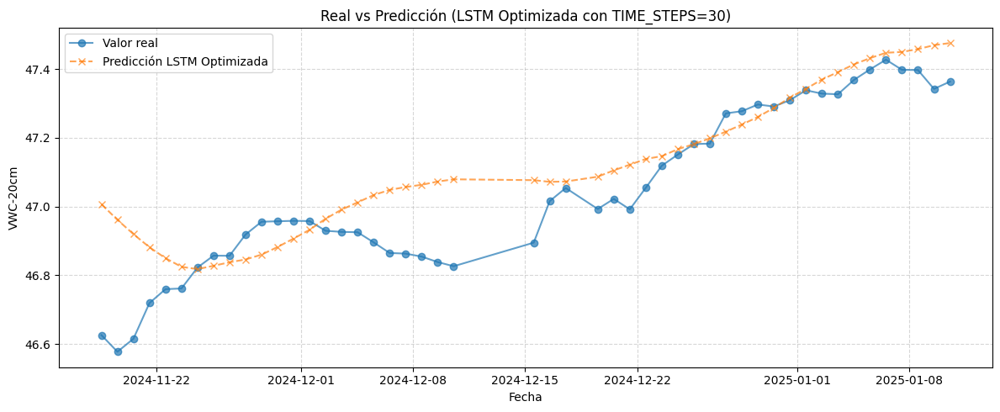

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import mean_squared_error, r2_score

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2 # Import for L2 regularization if needed
import gc
import optuna

# 1) Carga y preparación
# ----------------------
df = pd.read_excel('/content/DB_CropX_Aguacate.xlsx', sheet_name='CropX_BA29')
df['Fecha_Hora'] = pd.to_datetime(df['Fecha_Hora'])
df = df.set_index('Fecha_Hora').sort_index().asfreq('D')
target = 'VWC-20cm'

# 2) Split cronológico 70/30
# --------------------------
split = int(len(df) * 0.7)
df_daily = df.resample('D').mean(numeric_only=True)
train_df = df_daily.iloc[:split].copy()
test_df  = df_daily.iloc[split:].copy()

# 3) Preparar lag‑features para XGBoost
# -------------------------------------
def make_lag_features(df, lags=[1,2,3,7]):
    X = pd.DataFrame(index=df.index)
    for lag in lags:
        X[f'{target}_lag{lag}'] = df[target].shift(lag)
    for col in ['VWC-41cm','Temp(C)-20cm','EC(dS/m)-20cm']:
        X[f'{col}_lag1'] = df[col].shift(1)
    return X.dropna()

X_lags = make_lag_features(df)
y_lags = df[target].loc[X_lags.index]

split2 = int(len(X_lags) * 0.7)
X_train, X_test = X_lags.iloc[:split2], X_lags.iloc[split2:]
y_train, y_test = y_lags.iloc[:split2], y_lags.iloc[split2:]
t_test_lags     = X_test.index

# 4) Escalado y filtrado NaN en XGBoost
# -------------------------------------
scaler = StandardScaler().fit(X_train)
X_train_s = scaler.transform(X_train)
X_test_s  = scaler.transform(X_test)

mask_tr = np.isfinite(y_train)
X_train_s, y_train = X_train_s[mask_tr], y_train[mask_tr]

mask_te = np.isfinite(y_test)
X_test_s, y_test, t_test_lags = X_test_s[mask_te], y_test[mask_te], t_test_lags[mask_te]

# 3) Escalado de características (misma sección)
# -------------------------------------------------------
scaler_X = MinMaxScaler()
X_train_s = scaler_X.fit_transform(X_train_s)
X_test_s = scaler_X.transform(X_test_s)

scaler_y = MinMaxScaler()
y_train_s = scaler_y.fit_transform(y_train.values.reshape(-1, 1))
y_test_s = scaler_y.transform(y_test.values.reshape(-1, 1))

# Función para crear secuencias (misma sección)
def create_sequences(X, y, time_steps=1):
    Xs, ys = [], []
    for i in range(len(X) - time_steps):
        Xs.append(X[i:(i + time_steps)])
        ys.append(y[i + time_steps])
    return np.array(Xs), np.array(ys)

# --- NEW: Objective function for Optuna ---
def objective(trial):
    # Clear TensorFlow session to avoid memory leaks and ensure fresh model for each trial
    from tensorflow.keras import backend as K
    K.clear_session()
    gc.collect() # Force garbage collection

    # 1. Definir hiperparámetros a optimizar con Optuna
    # --------------------------------------------------
    # trial.suggest_int: para enteros (e.g., number of units, time_steps)
    # trial.suggest_float: para flotantes (e.g., learning_rate, dropout)
    # trial.suggest_categorical: para opciones discretas (e.g., optimizer)

    time_steps = trial.suggest_int('time_steps', 5, 30, step=5) # Example range, adjust as needed
    lstm_units = trial.suggest_int('lstm_units', 32, 128, step=16)
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5, step=0.1)
    learning_rate = trial.suggest_float('learning_rate', 1e-4, 1e-2, log=True) # Log scale for learning rate
    num_lstm_layers = trial.suggest_int('num_lstm_layers', 1, 2) # Try 1 or 2 LSTM layers

    # Re-create sequences for each trial based on the suggested time_steps
    # This is crucial because time_steps affects the shape of the input data
    X_train_lstm, y_train_lstm = create_sequences(X_train_s, y_train_s, time_steps)
    X_test_lstm, y_test_lstm = create_sequences(X_test_s, y_test_s, time_steps)

    # Ensure data is still valid after creating sequences
    if X_train_lstm.shape[0] == 0 or X_test_lstm.shape[0] == 0:
        # If sequences can't be formed (e.g., time_steps too large for data),
        # return a large error to make Optuna avoid this combination.
        return float('inf')

    # 2. Construir el modelo LSTM con los hiperparámetros sugeridos
    # -------------------------------------------------------------
    model = Sequential()

    # First LSTM layer
    model.add(LSTM(
        units=lstm_units,
        activation='relu',
        return_sequences=True if num_lstm_layers > 1 else False, # Only return sequences if stacking
        input_shape=(X_train_lstm.shape[1], X_train_lstm.shape[2])
    ))
    model.add(Dropout(dropout_rate))

    # Add additional LSTM layers if chosen
    for i in range(num_lstm_layers - 1):
        model.add(LSTM(
            units=lstm_units, # Could also optimize units for each layer
            activation='relu',
            return_sequences=True if i < num_lstm_layers - 2 else False # True for intermediate, False for last
        ))
        model.add(Dropout(dropout_rate))

    # Output layer
    model.add(Dense(units=1))

    # 3. Compilar el modelo
    # ---------------------
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='mse')

    # 4. Entrenar el modelo
    # ---------------------
    early_stopping = EarlyStopping(
        monitor='val_loss',
        patience=15, # Increased patience slightly for Optuna
        restore_best_weights=True,
        verbose=0 # No verbose output during Optuna trials
    )

    history = model.fit(
        X_train_lstm, y_train_lstm,
        epochs=150, # Set a sufficiently high number, early stopping will manage
        batch_size=32, # You could also optimize batch_size
        validation_split=0.2,
        callbacks=[early_stopping],
        verbose=0 # Suppress verbose output for each trial
    )

    # 5. Evaluar el modelo en el conjunto de test (o validación)
    # ----------------------------------------------------------
    # For Optuna, we want to minimize a metric, so we'll return RMSE
    y_pred_s = model.predict(X_test_lstm)

    # Inverse transform
    y_pred = scaler_y.inverse_transform(y_pred_s)
    y_test_actual = scaler_y.inverse_transform(y_test_lstm)

    rmse_test = np.sqrt(mean_squared_error(y_test_actual, y_pred))

    # Optuna by default minimizes the objective function, so we return RMSE.
    return rmse_test

# --- Ejecutar la optimización con Optuna ---
print("Iniciando la optimización de hiperparámetros con Optuna...")

# Crear un estudio de Optuna
# study_name: un nombre para el estudio (opcional, útil para guardar resultados)
# direction: 'minimize' o 'maximize' la función objetivo
study = optuna.create_study(direction='minimize', study_name='lstm_hyperparameter_tuning')

# Ejecutar la optimización
# n_trials: número de combinaciones de hiperparámetros a probar
# timeout: tiempo máximo en segundos para ejecutar el estudio
study.optimize(objective, n_trials=50, timeout=None) # Start with 50 trials, adjust as needed

print("\nOptimización completada.")
print(f"Número de pruebas terminadas: {len(study.trials)}")
print(f"Mejor RMSE encontrado: {study.best_value:.4f}")
print("Mejores hiperparámetros:")
for key, value in study.best_params.items():
    print(f"  {key}: {value}")

# --- Re-entrenar el modelo con los mejores hiperparámetros encontrados ---
print("\nRe-entrenando el modelo con los mejores hiperparámetros...")

# Extraer los mejores parámetros
best_time_steps = study.best_params['time_steps']
best_lstm_units = study.best_params['lstm_units']
best_dropout_rate = study.best_params['dropout_rate']
best_learning_rate = study.best_params['learning_rate']
best_num_lstm_layers = study.best_params['num_lstm_layers']


# Re-create sequences with the best time_steps
X_train_final_lstm, y_train_final_lstm = create_sequences(X_train_s, y_train_s, best_time_steps)
X_test_final_lstm, y_test_final_lstm = create_sequences(X_test_s, y_test_s, best_time_steps)

# Build the final model
final_model = Sequential()
final_model.add(LSTM(
    units=best_lstm_units,
    activation='relu',
    return_sequences=True if best_num_lstm_layers > 1 else False,
    input_shape=(X_train_final_lstm.shape[1], X_train_final_lstm.shape[2])
))
final_model.add(Dropout(best_dropout_rate))

for i in range(best_num_lstm_layers - 1):
    final_model.add(LSTM(
        units=best_lstm_units,
        activation='relu',
        return_sequences=True if i < best_num_lstm_layers - 2 else False
    ))
    final_model.add(Dropout(best_dropout_rate))

final_model.add(Dense(units=1))

final_model.compile(optimizer=Adam(learning_rate=best_learning_rate), loss='mse')

# Train the final model with full training data (optional: you could also train on X_full_s if desired)
early_stopping_final = EarlyStopping(
    monitor='val_loss',
    patience=20, # More patience for final training
    restore_best_weights=True,
    verbose=1
)

history_final = final_model.fit(
    X_train_final_lstm, y_train_final_lstm,
    epochs=200, # A higher number since early stopping will manage
    batch_size=32,
    validation_split=0.2, # Still use a validation split to monitor progress
    callbacks=[early_stopping_final],
    verbose=1
)

# 6) Evaluar el mejor modelo final en el conjunto de test
# -------------------------------------------------------
y_pred_final_s = final_model.predict(X_test_final_lstm)

y_pred_final = scaler_y.inverse_transform(y_pred_final_s)
y_test_final_actual = scaler_y.inverse_transform(y_test_final_lstm)


mse_final_test = mean_squared_error(y_test_final_actual, y_pred_final)
rmse_final_test = np.sqrt(mse_final_test)
r2_final_test = r2_score(y_test_final_actual, y_pred_final)

print(f"\nTest MSE (Mejor Modelo LSTM): {mse_final_test:.4f}")
print(f"Test R² (Mejor Modelo LSTM):   {r2_final_test:.4f}")

# 7) Gráfica Real vs Predicción del mejor modelo
# ---------------------------------------------
plt.figure(figsize=(12, 5))
# Ajustar t_test para la longitud de la secuencia (best_time_steps)
plt.plot(t_test_lags[best_time_steps:], y_test_final_actual, 'o-', label='Valor real', alpha=0.7)
plt.plot(t_test_lags[best_time_steps:], y_pred_final, 'x--', label='Predicción LSTM Optimizada', alpha=0.7)
plt.xlabel('Fecha')
plt.ylabel('VWC-20cm')
plt.title(f'Real vs Predicción (LSTM Optimizada con TIME_STEPS={best_time_steps})')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

In [ ]:
y_pred_final_s_train = final_model.predict(X_train_final_lstm)
y_pred_final_train = scaler_y.inverse_transform(y_pred_final_s_train)
y_train_final_actual = scaler_y.inverse_transform(y_train_final_lstm)
mse_final_train = mean_squared_error(y_train_final_actual, y_pred_final_train)
rmse_final_train = np.sqrt(mse_final_train)
r2_final_train = r2_score(y_train_final_actual, y_pred_final_train)
print(f"\nTrain MSE (Mejor Modelo LSTM): {mse_final_train:.4f}")
print(f"Test R² (Mejor Modelo LSTM):   {r2_final_train:.4f}")

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

Train MSE (Mejor Modelo LSTM): 0.0395
Test R² (Mejor Modelo LSTM):   0.8366


[I 2025-07-17 00:09:33,275] A new study created in memory with name: lstm_hyperparameter_tuning


Iniciando la optimización de hiperparámetros con Optuna...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


[I 2025-07-17 00:09:41,435] Trial 0 finished with value: 0.09478275616714855 and parameters: {'time_steps': 30, 'lstm_units': 64, 'dropout_rate': 0.4, 'learning_rate': 0.001537815482229226, 'num_lstm_layers': 1}. Best is trial 0 with value: 0.09478275616714855.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


[I 2025-07-17 00:09:53,632] Trial 1 finished with value: 0.11381687715354454 and parameters: {'time_steps': 20, 'lstm_units': 112, 'dropout_rate': 0.5, 'learning_rate': 0.004367269334760041, 'num_lstm_layers': 2}. Best is trial 0 with value: 0.09478275616714855.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


[I 2025-07-17 00:10:05,382] Trial 2 finished with value: 0.14450240434316516 and parameters: {'time_steps': 10, 'lstm_units': 32, 'dropout_rate': 0.2, 'learning_rate': 0.0022734912415164595, 'num_lstm_layers': 2}. Best is trial 0 with value: 0.09478275616714855.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 270ms/step


[I 2025-07-17 00:10:18,223] Trial 3 finished with value: 0.1304992571041503 and parameters: {'time_steps': 30, 'lstm_units': 112, 'dropout_rate': 0.30000000000000004, 'learning_rate': 0.0039037910857800456, 'num_lstm_layers': 2}. Best is trial 0 with value: 0.09478275616714855.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


[I 2025-07-17 00:10:30,020] Trial 4 finished with value: 0.1484866253472525 and parameters: {'time_steps': 10, 'lstm_units': 112, 'dropout_rate': 0.30000000000000004, 'learning_rate': 0.002359974798581793, 'num_lstm_layers': 2}. Best is trial 0 with value: 0.09478275616714855.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step


[I 2025-07-17 00:10:40,848] Trial 5 finished with value: 0.17345825985885768 and parameters: {'time_steps': 25, 'lstm_units': 64, 'dropout_rate': 0.2, 'learning_rate': 0.00024117417408386332, 'num_lstm_layers': 2}. Best is trial 0 with value: 0.09478275616714855.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step 


[I 2025-07-17 00:10:51,176] Trial 6 finished with value: 0.15817794906800225 and parameters: {'time_steps': 15, 'lstm_units': 96, 'dropout_rate': 0.30000000000000004, 'learning_rate': 0.00030770886086032987, 'num_lstm_layers': 1}. Best is trial 0 with value: 0.09478275616714855.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


[I 2025-07-17 00:10:59,090] Trial 7 finished with value: 0.19915290879556027 and parameters: {'time_steps': 10, 'lstm_units': 96, 'dropout_rate': 0.1, 'learning_rate': 0.0002379084490131667, 'num_lstm_layers': 1}. Best is trial 0 with value: 0.09478275616714855.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


[I 2025-07-17 00:11:07,597] Trial 8 finished with value: 0.13217115755469822 and parameters: {'time_steps': 25, 'lstm_units': 32, 'dropout_rate': 0.1, 'learning_rate': 0.0013483174173126535, 'num_lstm_layers': 1}. Best is trial 0 with value: 0.09478275616714855.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


[I 2025-07-17 00:11:15,658] Trial 9 finished with value: 0.10469972436784662 and parameters: {'time_steps': 25, 'lstm_units': 112, 'dropout_rate': 0.4, 'learning_rate': 0.0018998489043437897, 'num_lstm_layers': 1}. Best is trial 0 with value: 0.09478275616714855.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


[I 2025-07-17 00:11:26,532] Trial 10 finished with value: 0.07389135278628854 and parameters: {'time_steps': 30, 'lstm_units': 64, 'dropout_rate': 0.5, 'learning_rate': 0.009112184430321715, 'num_lstm_layers': 1}. Best is trial 10 with value: 0.07389135278628854.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


[I 2025-07-17 00:11:35,352] Trial 11 finished with value: 0.0866831173809451 and parameters: {'time_steps': 30, 'lstm_units': 64, 'dropout_rate': 0.5, 'learning_rate': 0.007184134975309939, 'num_lstm_layers': 1}. Best is trial 10 with value: 0.07389135278628854.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


[I 2025-07-17 00:11:45,907] Trial 12 finished with value: 0.06464346454376171 and parameters: {'time_steps': 30, 'lstm_units': 64, 'dropout_rate': 0.5, 'learning_rate': 0.00979659954158827, 'num_lstm_layers': 1}. Best is trial 12 with value: 0.06464346454376171.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


[I 2025-07-17 00:11:55,475] Trial 13 finished with value: 0.10926881453216837 and parameters: {'time_steps': 20, 'lstm_units': 48, 'dropout_rate': 0.5, 'learning_rate': 0.009603151249736977, 'num_lstm_layers': 1}. Best is trial 12 with value: 0.06464346454376171.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


[I 2025-07-17 00:12:04,069] Trial 14 finished with value: 0.09250584573102885 and parameters: {'time_steps': 5, 'lstm_units': 80, 'dropout_rate': 0.4, 'learning_rate': 0.0008131724510875994, 'num_lstm_layers': 1}. Best is trial 12 with value: 0.06464346454376171.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


[I 2025-07-17 00:12:12,443] Trial 15 finished with value: 0.19015855280420238 and parameters: {'time_steps': 30, 'lstm_units': 80, 'dropout_rate': 0.5, 'learning_rate': 0.0005801494402128052, 'num_lstm_layers': 1}. Best is trial 12 with value: 0.06464346454376171.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


[I 2025-07-17 00:12:21,089] Trial 16 finished with value: 0.08549526980716605 and parameters: {'time_steps': 25, 'lstm_units': 48, 'dropout_rate': 0.4, 'learning_rate': 0.005082733821480367, 'num_lstm_layers': 1}. Best is trial 12 with value: 0.06464346454376171.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


[I 2025-07-17 00:12:32,980] Trial 17 finished with value: 0.2623504788954998 and parameters: {'time_steps': 20, 'lstm_units': 48, 'dropout_rate': 0.5, 'learning_rate': 0.00013145807528524314, 'num_lstm_layers': 1}. Best is trial 12 with value: 0.06464346454376171.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


[I 2025-07-17 00:12:44,450] Trial 18 finished with value: 0.07973500751735312 and parameters: {'time_steps': 30, 'lstm_units': 64, 'dropout_rate': 0.4, 'learning_rate': 0.00909365761641739, 'num_lstm_layers': 1}. Best is trial 12 with value: 0.06464346454376171.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step 


[I 2025-07-17 00:12:56,070] Trial 19 finished with value: 0.0999936172360391 and parameters: {'time_steps': 15, 'lstm_units': 80, 'dropout_rate': 0.5, 'learning_rate': 0.0031276728341691562, 'num_lstm_layers': 1}. Best is trial 12 with value: 0.06464346454376171.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


[I 2025-07-17 00:13:10,612] Trial 20 finished with value: 0.17403975448450965 and parameters: {'time_steps': 25, 'lstm_units': 128, 'dropout_rate': 0.2, 'learning_rate': 0.0059426060219047476, 'num_lstm_layers': 2}. Best is trial 12 with value: 0.06464346454376171.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


[I 2025-07-17 00:13:20,534] Trial 21 finished with value: 0.15707468996558147 and parameters: {'time_steps': 30, 'lstm_units': 64, 'dropout_rate': 0.4, 'learning_rate': 0.009576595942687801, 'num_lstm_layers': 1}. Best is trial 12 with value: 0.06464346454376171.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


[I 2025-07-17 00:13:29,789] Trial 22 finished with value: 0.08119958636908749 and parameters: {'time_steps': 30, 'lstm_units': 48, 'dropout_rate': 0.4, 'learning_rate': 0.00990311296002695, 'num_lstm_layers': 1}. Best is trial 12 with value: 0.06464346454376171.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


[I 2025-07-17 00:13:37,508] Trial 23 finished with value: 0.08439449849412861 and parameters: {'time_steps': 25, 'lstm_units': 80, 'dropout_rate': 0.5, 'learning_rate': 0.006425074721677401, 'num_lstm_layers': 1}. Best is trial 12 with value: 0.06464346454376171.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


[I 2025-07-17 00:13:48,209] Trial 24 finished with value: 0.08434043111215014 and parameters: {'time_steps': 30, 'lstm_units': 64, 'dropout_rate': 0.4, 'learning_rate': 0.0035541293226393016, 'num_lstm_layers': 1}. Best is trial 12 with value: 0.06464346454376171.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


[I 2025-07-17 00:13:58,286] Trial 25 finished with value: 0.07946445967280226 and parameters: {'time_steps': 30, 'lstm_units': 96, 'dropout_rate': 0.5, 'learning_rate': 0.006876263522725001, 'num_lstm_layers': 1}. Best is trial 12 with value: 0.06464346454376171.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


[I 2025-07-17 00:14:08,497] Trial 26 finished with value: 0.08825113120651419 and parameters: {'time_steps': 25, 'lstm_units': 96, 'dropout_rate': 0.5, 'learning_rate': 0.006195916841903596, 'num_lstm_layers': 1}. Best is trial 12 with value: 0.06464346454376171.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


[I 2025-07-17 00:14:20,269] Trial 27 finished with value: 0.14759293615057306 and parameters: {'time_steps': 20, 'lstm_units': 96, 'dropout_rate': 0.5, 'learning_rate': 0.002884674252832314, 'num_lstm_layers': 1}. Best is trial 12 with value: 0.06464346454376171.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


[I 2025-07-17 00:14:32,079] Trial 28 finished with value: 0.07469194108840996 and parameters: {'time_steps': 30, 'lstm_units': 128, 'dropout_rate': 0.5, 'learning_rate': 0.004632061082075746, 'num_lstm_layers': 1}. Best is trial 12 with value: 0.06464346454376171.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


[I 2025-07-17 00:14:41,449] Trial 29 finished with value: 0.0983422859000685 and parameters: {'time_steps': 30, 'lstm_units': 48, 'dropout_rate': 0.4, 'learning_rate': 0.001283877407044484, 'num_lstm_layers': 1}. Best is trial 12 with value: 0.06464346454376171.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


[I 2025-07-17 00:14:55,083] Trial 30 finished with value: 0.09198758502890698 and parameters: {'time_steps': 25, 'lstm_units': 128, 'dropout_rate': 0.5, 'learning_rate': 0.004181544733097155, 'num_lstm_layers': 1}. Best is trial 12 with value: 0.06464346454376171.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


[I 2025-07-17 00:15:08,853] Trial 31 finished with value: 0.09930410413858251 and parameters: {'time_steps': 30, 'lstm_units': 128, 'dropout_rate': 0.5, 'learning_rate': 0.007341479359243005, 'num_lstm_layers': 1}. Best is trial 12 with value: 0.06464346454376171.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


[I 2025-07-17 00:15:19,863] Trial 32 finished with value: 0.06937210804942909 and parameters: {'time_steps': 30, 'lstm_units': 80, 'dropout_rate': 0.5, 'learning_rate': 0.004912624080295023, 'num_lstm_layers': 1}. Best is trial 12 with value: 0.06464346454376171.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


[I 2025-07-17 00:15:30,390] Trial 33 finished with value: 0.08710418065917488 and parameters: {'time_steps': 25, 'lstm_units': 80, 'dropout_rate': 0.5, 'learning_rate': 0.004766619477087988, 'num_lstm_layers': 1}. Best is trial 12 with value: 0.06464346454376171.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step


[I 2025-07-17 00:15:41,834] Trial 34 finished with value: 0.1188757465071066 and parameters: {'time_steps': 30, 'lstm_units': 80, 'dropout_rate': 0.4, 'learning_rate': 0.004935537505744182, 'num_lstm_layers': 2}. Best is trial 12 with value: 0.06464346454376171.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


[I 2025-07-17 00:15:51,340] Trial 35 finished with value: 0.1317522755365791 and parameters: {'time_steps': 30, 'lstm_units': 64, 'dropout_rate': 0.5, 'learning_rate': 0.0020650947885069598, 'num_lstm_layers': 1}. Best is trial 12 with value: 0.06464346454376171.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


[I 2025-07-17 00:16:02,794] Trial 36 finished with value: 0.1377424999316111 and parameters: {'time_steps': 5, 'lstm_units': 32, 'dropout_rate': 0.30000000000000004, 'learning_rate': 0.002771770043948319, 'num_lstm_layers': 2}. Best is trial 12 with value: 0.06464346454376171.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


[I 2025-07-17 00:16:14,216] Trial 37 finished with value: 0.07951410105834392 and parameters: {'time_steps': 30, 'lstm_units': 80, 'dropout_rate': 0.5, 'learning_rate': 0.0037133629082160406, 'num_lstm_layers': 1}. Best is trial 12 with value: 0.06464346454376171.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step 


[I 2025-07-17 00:16:24,340] Trial 38 finished with value: 0.10642340227264219 and parameters: {'time_steps': 15, 'lstm_units': 112, 'dropout_rate': 0.2, 'learning_rate': 0.007387757991950029, 'num_lstm_layers': 1}. Best is trial 12 with value: 0.06464346454376171.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


[I 2025-07-17 00:16:36,680] Trial 39 finished with value: 0.21738052072150243 and parameters: {'time_steps': 20, 'lstm_units': 64, 'dropout_rate': 0.4, 'learning_rate': 0.0008690735929035679, 'num_lstm_layers': 2}. Best is trial 12 with value: 0.06464346454376171.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


[I 2025-07-17 00:16:51,897] Trial 40 finished with value: 0.10329956309720441 and parameters: {'time_steps': 25, 'lstm_units': 96, 'dropout_rate': 0.30000000000000004, 'learning_rate': 0.0054458388963213025, 'num_lstm_layers': 1}. Best is trial 12 with value: 0.06464346454376171.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


[I 2025-07-17 00:17:00,978] Trial 41 finished with value: 0.05824760303332173 and parameters: {'time_steps': 30, 'lstm_units': 96, 'dropout_rate': 0.5, 'learning_rate': 0.007844189721289911, 'num_lstm_layers': 1}. Best is trial 41 with value: 0.05824760303332173.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


[I 2025-07-17 00:17:12,114] Trial 42 finished with value: 0.07928298825337045 and parameters: {'time_steps': 30, 'lstm_units': 112, 'dropout_rate': 0.5, 'learning_rate': 0.007943790988472314, 'num_lstm_layers': 1}. Best is trial 41 with value: 0.05824760303332173.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


[I 2025-07-17 00:17:22,446] Trial 43 finished with value: 0.06996614761983248 and parameters: {'time_steps': 30, 'lstm_units': 128, 'dropout_rate': 0.5, 'learning_rate': 0.004360650827073155, 'num_lstm_layers': 1}. Best is trial 41 with value: 0.05824760303332173.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


[I 2025-07-17 00:17:30,303] Trial 44 finished with value: 0.0949445598648006 and parameters: {'time_steps': 30, 'lstm_units': 80, 'dropout_rate': 0.5, 'learning_rate': 0.008125174024888696, 'num_lstm_layers': 1}. Best is trial 41 with value: 0.05824760303332173.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


[I 2025-07-17 00:17:39,920] Trial 45 finished with value: 0.09274977253769683 and parameters: {'time_steps': 25, 'lstm_units': 64, 'dropout_rate': 0.5, 'learning_rate': 0.005873428747409897, 'num_lstm_layers': 1}. Best is trial 41 with value: 0.05824760303332173.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


[I 2025-07-17 00:17:48,250] Trial 46 finished with value: 0.1874462362045831 and parameters: {'time_steps': 30, 'lstm_units': 96, 'dropout_rate': 0.5, 'learning_rate': 0.0003974739689316938, 'num_lstm_layers': 1}. Best is trial 41 with value: 0.05824760303332173.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


[I 2025-07-17 00:17:56,041] Trial 47 finished with value: 0.1306864724768207 and parameters: {'time_steps': 10, 'lstm_units': 112, 'dropout_rate': 0.4, 'learning_rate': 0.001647862209490939, 'num_lstm_layers': 1}. Best is trial 41 with value: 0.05824760303332173.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


[I 2025-07-17 00:18:07,439] Trial 48 finished with value: 0.09780838204147659 and parameters: {'time_steps': 25, 'lstm_units': 64, 'dropout_rate': 0.1, 'learning_rate': 0.0037489755342836667, 'num_lstm_layers': 1}. Best is trial 41 with value: 0.05824760303332173.
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


[I 2025-07-17 00:18:15,978] Trial 49 finished with value: 0.16167533104799645 and parameters: {'time_steps': 25, 'lstm_units': 112, 'dropout_rate': 0.5, 'learning_rate': 0.008242903382520874, 'num_lstm_layers': 1}. Best is trial 41 with value: 0.05824760303332173.



Optimización completada.
Número de pruebas terminadas: 50
Mejor RMSE encontrado: 0.0582
Mejores hiperparámetros:
  time_steps: 30
  lstm_units: 96
  dropout_rate: 0.5
  learning_rate: 0.007844189721289911
  num_lstm_layers: 1

Re-entrenando el modelo con los mejores hiperparámetros...
Epoch 1/200


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.0638 - val_loss: 0.0077
Epoch 2/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0127 - val_loss: 0.0034
Epoch 3/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0110 - val_loss: 1.0788e-04
Epoch 4/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0083 - val_loss: 8.4665e-05
Epoch 5/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0055 - val_loss: 4.0652e-04
Epoch 6/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0046 - val_loss: 9.5328e-04
Epoch 7/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0048 - val_loss: 5.8570e-04
Epoch 8/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0031 - val_loss: 2.3148e-04
Epoch 9/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0045 - val_loss: 2.6415e-04
Epoch 10/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0030 - val_loss: 3.2320e-04
Epoch 11/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0036 - val_loss: 1.3359e-04
Epoch 12/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step

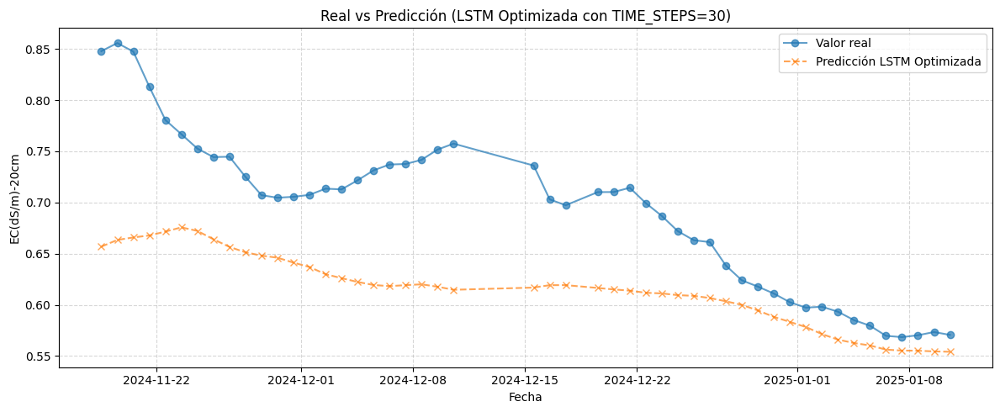

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import mean_squared_error, r2_score

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2 # Import for L2 regularization if needed
import gc

# 1) Carga y preparación
# ----------------------
df = pd.read_excel('/content/DB_CropX_Aguacate.xlsx', sheet_name='CropX_BA29')
df['Fecha_Hora'] = pd.to_datetime(df['Fecha_Hora'])
df = df.set_index('Fecha_Hora').sort_index().asfreq('D')
target = 'EC(dS/m)-20cm'

# 2) Split cronológico 70/30
# --------------------------
split = int(len(df) * 0.7)
train_df = df.iloc[:split].copy()
test_df  = df.iloc[split:].copy()

# 3) Preparar lag‑features para XGBoost
# -------------------------------------
def make_lag_features(df, lags=[1,2,3,7]):
    X = pd.DataFrame(index=df.index)
    # Lags de conductividad a 20cm
    for lag in lags:
        X[f'{target}_lag{lag}'] = df[target].shift(lag)
    # Lags de otras variables relevantes
    for col in ['VWC-20cm','Temp(C)-20cm','VWC-41cm']:
        X[f'{col}_lag1'] = df[col].shift(1)
    return X.dropna()

X_lags = make_lag_features(df)
y_lags = df[target].loc[X_lags.index]

split2 = int(len(X_lags) * 0.7)
X_train, X_test = X_lags.iloc[:split2], X_lags.iloc[split2:]
y_train, y_test = y_lags.iloc[:split2], y_lags.iloc[split2:]
t_test_lags     = X_test.index

# 4) Escalado y limpieza NaN para XGBoost
# ---------------------------------------
scaler = StandardScaler().fit(X_train)
X_train_s = scaler.transform(X_train)
X_test_s  = scaler.transform(X_test)

mask_tr    = np.isfinite(y_train)
X_train_s, y_train = X_train_s[mask_tr], y_train[mask_tr]

mask_te    = np.isfinite(y_test)
X_test_s, y_test, t_test_lags = X_test_s[mask_te], y_test[mask_te], t_test_lags[mask_te]

scaler_X = MinMaxScaler()
X_train_s = scaler_X.fit_transform(X_train_s)
X_test_s = scaler_X.transform(X_test_s)

scaler_y = MinMaxScaler()
y_train_s = scaler_y.fit_transform(y_train.values.reshape(-1, 1))
y_test_s = scaler_y.transform(y_test.values.reshape(-1, 1))

# Función para crear secuencias (misma sección)
def create_sequences(X, y, time_steps=1):
    Xs, ys = [], []
    for i in range(len(X) - time_steps):
        Xs.append(X[i:(i + time_steps)])
        ys.append(y[i + time_steps])
    return np.array(Xs), np.array(ys)

# --- NEW: Objective function for Optuna ---
def objective(trial):
    # Clear TensorFlow session to avoid memory leaks and ensure fresh model for each trial
    from tensorflow.keras import backend as K
    K.clear_session()
    gc.collect() # Force garbage collection

    # 1. Definir hiperparámetros a optimizar con Optuna
    # --------------------------------------------------
    # trial.suggest_int: para enteros (e.g., number of units, time_steps)
    # trial.suggest_float: para flotantes (e.g., learning_rate, dropout)
    # trial.suggest_categorical: para opciones discretas (e.g., optimizer)

    time_steps = trial.suggest_int('time_steps', 5, 30, step=5) # Example range, adjust as needed
    lstm_units = trial.suggest_int('lstm_units', 32, 128, step=16)
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5, step=0.1)
    learning_rate = trial.suggest_float('learning_rate', 1e-4, 1e-2, log=True) # Log scale for learning rate
    num_lstm_layers = trial.suggest_int('num_lstm_layers', 1, 2) # Try 1 or 2 LSTM layers

    # Re-create sequences for each trial based on the suggested time_steps
    # This is crucial because time_steps affects the shape of the input data
    X_train_lstm, y_train_lstm = create_sequences(X_train_s, y_train_s, time_steps)
    X_test_lstm, y_test_lstm = create_sequences(X_test_s, y_test_s, time_steps)

    # Ensure data is still valid after creating sequences
    if X_train_lstm.shape[0] == 0 or X_test_lstm.shape[0] == 0:
        # If sequences can't be formed (e.g., time_steps too large for data),
        # return a large error to make Optuna avoid this combination.
        return float('inf')

    # 2. Construir el modelo LSTM con los hiperparámetros sugeridos
    # -------------------------------------------------------------
    model = Sequential()

    # First LSTM layer
    model.add(LSTM(
        units=lstm_units,
        activation='relu',
        return_sequences=True if num_lstm_layers > 1 else False, # Only return sequences if stacking
        input_shape=(X_train_lstm.shape[1], X_train_lstm.shape[2])
    ))
    model.add(Dropout(dropout_rate))

    # Add additional LSTM layers if chosen
    for i in range(num_lstm_layers - 1):
        model.add(LSTM(
            units=lstm_units, # Could also optimize units for each layer
            activation='relu',
            return_sequences=True if i < num_lstm_layers - 2 else False # True for intermediate, False for last
        ))
        model.add(Dropout(dropout_rate))

    # Output layer
    model.add(Dense(units=1))

    # 3. Compilar el modelo
    # ---------------------
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='mse')

    # 4. Entrenar el modelo
    # ---------------------
    early_stopping = EarlyStopping(
        monitor='val_loss',
        patience=15, # Increased patience slightly for Optuna
        restore_best_weights=True,
        verbose=0 # No verbose output during Optuna trials
    )

    history = model.fit(
        X_train_lstm, y_train_lstm,
        epochs=150, # Set a sufficiently high number, early stopping will manage
        batch_size=32, # You could also optimize batch_size
        validation_split=0.2,
        callbacks=[early_stopping],
        verbose=0 # Suppress verbose output for each trial
    )

    # 5. Evaluar el modelo en el conjunto de test (o validación)
    # ----------------------------------------------------------
    # For Optuna, we want to minimize a metric, so we'll return RMSE
    y_pred_s = model.predict(X_test_lstm)

    # Inverse transform
    y_pred = scaler_y.inverse_transform(y_pred_s)
    y_test_actual = scaler_y.inverse_transform(y_test_lstm)

    rmse_test = np.sqrt(mean_squared_error(y_test_actual, y_pred))

    # Optuna by default minimizes the objective function, so we return RMSE.
    return rmse_test

# --- Ejecutar la optimización con Optuna ---
print("Iniciando la optimización de hiperparámetros con Optuna...")

# Crear un estudio de Optuna
# study_name: un nombre para el estudio (opcional, útil para guardar resultados)
# direction: 'minimize' o 'maximize' la función objetivo
study = optuna.create_study(direction='minimize', study_name='lstm_hyperparameter_tuning')

# Ejecutar la optimización
# n_trials: número de combinaciones de hiperparámetros a probar
# timeout: tiempo máximo en segundos para ejecutar el estudio
study.optimize(objective, n_trials=50, timeout=None) # Start with 50 trials, adjust as needed

print("\nOptimización completada.")
print(f"Número de pruebas terminadas: {len(study.trials)}")
print(f"Mejor RMSE encontrado: {study.best_value:.4f}")
print("Mejores hiperparámetros:")
for key, value in study.best_params.items():
    print(f"  {key}: {value}")

# --- Re-entrenar el modelo con los mejores hiperparámetros encontrados ---
print("\nRe-entrenando el modelo con los mejores hiperparámetros...")

# Extraer los mejores parámetros
best_time_steps = study.best_params['time_steps']
best_lstm_units = study.best_params['lstm_units']
best_dropout_rate = study.best_params['dropout_rate']
best_learning_rate = study.best_params['learning_rate']
best_num_lstm_layers = study.best_params['num_lstm_layers']


# Re-create sequences with the best time_steps
X_train_final_lstm, y_train_final_lstm = create_sequences(X_train_s, y_train_s, best_time_steps)
X_test_final_lstm, y_test_final_lstm = create_sequences(X_test_s, y_test_s, best_time_steps)

# Build the final model
final_model = Sequential()
final_model.add(LSTM(
    units=best_lstm_units,
    activation='relu',
    return_sequences=True if best_num_lstm_layers > 1 else False,
    input_shape=(X_train_final_lstm.shape[1], X_train_final_lstm.shape[2])
))
final_model.add(Dropout(best_dropout_rate))

for i in range(best_num_lstm_layers - 1):
    final_model.add(LSTM(
        units=best_lstm_units,
        activation='relu',
        return_sequences=True if i < best_num_lstm_layers - 2 else False
    ))
    final_model.add(Dropout(best_dropout_rate))

final_model.add(Dense(units=1))

final_model.compile(optimizer=Adam(learning_rate=best_learning_rate), loss='mse')

# Train the final model with full training data (optional: you could also train on X_full_s if desired)
early_stopping_final = EarlyStopping(
    monitor='val_loss',
    patience=20, # More patience for final training
    restore_best_weights=True,
    verbose=1
)

history_final = final_model.fit(
    X_train_final_lstm, y_train_final_lstm,
    epochs=200, # A higher number since early stopping will manage
    batch_size=32,
    validation_split=0.2, # Still use a validation split to monitor progress
    callbacks=[early_stopping_final],
    verbose=1
)

# 6) Evaluar el mejor modelo final en el conjunto de test
# -------------------------------------------------------
y_pred_final_s = final_model.predict(X_test_final_lstm)
y_pred_final = scaler_y.inverse_transform(y_pred_final_s)
y_test_final_actual = scaler_y.inverse_transform(y_test_final_lstm)

y_pred_final_s_train = final_model.predict(X_train_final_lstm)
y_pred_final_train = scaler_y.inverse_transform(y_pred_final_s_train)
y_train_final_actual = scaler_y.inverse_transform(y_train_final_lstm)
mse_final_train = mean_squared_error(y_train_final_actual, y_pred_final_train)
rmse_final_train = np.sqrt(mse_final_train)
r2_final_train = r2_score(y_train_final_actual, y_pred_final_train)
print(f"\nTrain MSE (Mejor Modelo LSTM): {mse_final_train:.4f}")
print(f"Test R² (Mejor Modelo LSTM):   {r2_final_test:.4f}")

mse_final_test = mean_squared_error(y_test_final_actual, y_pred_final)
rmse_final_test = np.sqrt(mse_final_test)
r2_final_test = r2_score(y_test_final_actual, y_pred_final)

print(f"\nTest MSE (Mejor Modelo LSTM): {mse_final_test:.4f}")
print(f"Test R² (Mejor Modelo LSTM):   {r2_final_test:.4f}")

# 7) Gráfica Real vs Predicción del mejor modelo
# ---------------------------------------------
plt.figure(figsize=(12, 5))
# Ajustar t_test para la longitud de la secuencia (best_time_steps)
plt.plot(t_test_lags[best_time_steps:], y_test_final_actual, 'o-', label='Valor real', alpha=0.7)
plt.plot(t_test_lags[best_time_steps:], y_pred_final, 'x--', label='Predicción LSTM Optimizada', alpha=0.7)
plt.xlabel('Fecha')
plt.ylabel('EC(dS/m)-20cm')
plt.title(f'Real vs Predicción (LSTM Optimizada con TIME_STEPS={best_time_steps})')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

## **Otros modelos**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection   import train_test_split
from sklearn.preprocessing    import StandardScaler
from sklearn.metrics          import mean_squared_error, r2_score
from xgboost                  import XGBRegressor

import statsmodels.api         as sm
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from prophet                  import Prophet

# 1) Carga y preparación
# ----------------------
df = pd.read_excel('/content/DB_CropX_Aguacate.xlsx', sheet_name='CropX_BA29')
df['Fecha_Hora'] = pd.to_datetime(df['Fecha_Hora'])
df = df.set_index('Fecha_Hora').sort_index().asfreq('D')
target = 'VWC-20cm'

# 2) Split cronológico 70/30
# --------------------------
split = int(len(df) * 0.7)
train_df = df.iloc[:split].copy()
test_df  = df.iloc[split:].copy()

# 3) Preparar lag‑features para XGBoost
# -------------------------------------
def make_lag_features(df, lags=[1,2,3,7]):
    X = pd.DataFrame(index=df.index)
    for lag in lags:
        X[f'{target}_lag{lag}'] = df[target].shift(lag)
    for col in ['VWC-41cm','Temp(C)-20cm','EC(dS/m)-20cm']:
        X[f'{col}_lag1'] = df[col].shift(1)
    return X.dropna()

X_lags = make_lag_features(df)
y_lags = df[target].loc[X_lags.index]

split2 = int(len(X_lags) * 0.7)
X_train, X_test = X_lags.iloc[:split2], X_lags.iloc[split2:]
y_train, y_test = y_lags.iloc[:split2], y_lags.iloc[split2:]
t_test_lags     = X_test.index

# 4) Escalado y filtrado NaN en XGBoost
# -------------------------------------
scaler = StandardScaler().fit(X_train)
X_train_s = scaler.transform(X_train)
X_test_s  = scaler.transform(X_test)

mask_tr = np.isfinite(y_train)
X_train_s, y_train = X_train_s[mask_tr], y_train[mask_tr]

mask_te = np.isfinite(y_test)
X_test_s, y_test, t_test_lags = X_test_s[mask_te], y_test[mask_te], t_test_lags[mask_te]

xgb = XGBRegressor(objective='reg:squarederror', n_estimators=100, random_state=42)
xgb.fit(X_train_s, y_train)
y_pred_xgb = xgb.predict(X_test_s)
rmse_xgb   = np.sqrt(mean_squared_error(y_test, y_pred_xgb))
r2_xgb     = r2_score(y_test, y_pred_xgb)

# 5) SARIMAX con exógenos (limpieza de NaN)
# -----------------------------------------
exog_cols = ['Temp(C)-20cm','EC(dS/m)-20cm']
# Limpiar NaN en entrenamiento
sar_train = train_df[[target]+exog_cols].dropna()
endog_train   = sar_train[target]
exog_train    = sar_train[exog_cols]

# Asegurar que test tampoco tiene NaN en exógenos
sar_test = test_df[[target]+exog_cols].dropna()
y_test_sar    = sar_test[target].values
exog_test     = sar_test[exog_cols]

sar = sm.tsa.statespace.SARIMAX(
    endog_train,
    exog=exog_train,
    order=(1,0,1),
    seasonal_order=(1,0,1,7),
    enforce_stationarity=False,
    enforce_invertibility=False
).fit(disp=False)

fc_sar     = sar.get_forecast(steps=len(exog_test), exog=exog_test)
y_pred_sar = fc_sar.predicted_mean.values

rmse_sar = np.sqrt(mean_squared_error(y_test_sar, y_pred_sar))
r2_sar   = r2_score(y_test_sar, y_pred_sar)

# 6) Holt–Winters (suavizado triple)
# ----------------------------------
hw = ExponentialSmoothing(
    endog_train,
    trend='add',
    seasonal='add',
    seasonal_periods=7
).fit()
y_pred_hw = hw.forecast(len(sar_test))
rmse_hw   = np.sqrt(mean_squared_error(y_test_sar, y_pred_hw))
r2_hw     = r2_score(y_test_sar, y_pred_hw)

# 7) Prophet con regresores
# --------------------------
prophet_df = df.reset_index()[['Fecha_Hora', target]+exog_cols]\
               .rename(columns={'Fecha_Hora':'ds', target:'y'})\
               .set_index('ds').dropna().reset_index()
split_prop = int(len(prophet_df)*0.7)
m = Prophet()
for col in exog_cols:
    m.add_regressor(col)
m.fit(prophet_df.iloc[:split_prop])

future    = prophet_df[['ds']+exog_cols].iloc[split_prop:]
y_test_pr = prophet_df['y'].iloc[split_prop:].values
fc_pr     = m.predict(future)
y_pred_pr = fc_pr['yhat'].values

rmse_pr = np.sqrt(mean_squared_error(y_test_pr, y_pred_pr))
r2_pr   = r2_score(y_test_pr, y_pred_pr)


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.11/dist-packages/stat

                  RMSE         R2
Modelo                           
XGBoost       0.063512   0.965512
SARIMAX       1.292683 -24.073146
Holt-Winters  0.645610  -5.254108
Prophet       0.116752   0.882641 



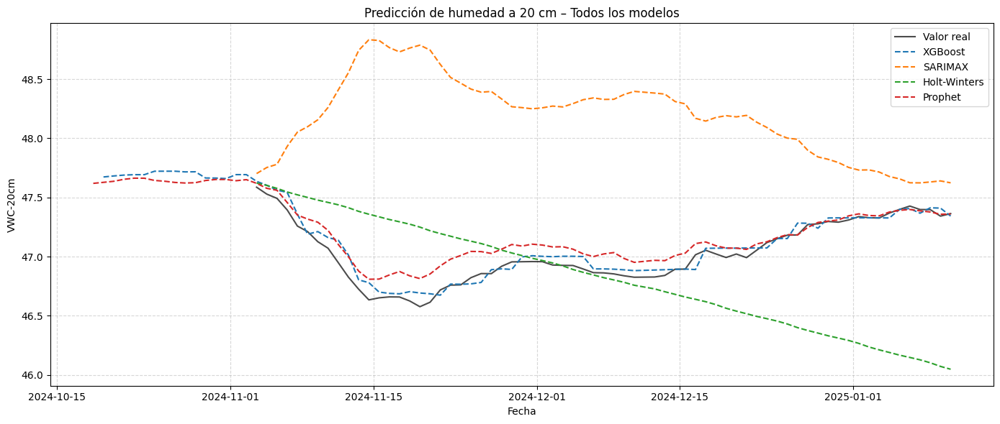

In [ ]:
# 8) Resultados y gráfica (todas las predicciones)
# ------------------------------------------------
results = pd.DataFrame([
    ['XGBoost',      rmse_xgb, r2_xgb],
    ['SARIMAX',      rmse_sar, r2_sar],
    ['Holt-Winters', rmse_hw,  r2_hw],
    ['Prophet',      rmse_pr,  r2_pr]
], columns=['Modelo','RMSE','R2']).set_index('Modelo')

print(results, '\n')

plt.figure(figsize=(14, 6))
plt.plot(sar_test.index, y_test_sar, 'k-', label='Valor real', alpha=0.7)

# Predicciones de todos los modelos
plt.plot(t_test_lags,     y_pred_xgb,  '--', label='XGBoost')
plt.plot(sar_test.index,  y_pred_sar,  '--', label='SARIMAX')
plt.plot(sar_test.index,  y_pred_hw,   '--', label='Holt-Winters')
plt.plot(future['ds'],    y_pred_pr,   '--', label='Prophet')

plt.xlabel('Fecha')
plt.ylabel(target)
plt.title('Predicción de humedad a 20 cm – Todos los modelos')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


XGBoost   RMSE: 0.0250   R²: 0.9529


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.11/dist-packages/stat

SARIMAX   RMSE: 0.0882   R²: 0.0172
Holt–Winters RMSE: 0.1727   R²: -2.7722


DEBUG:cmdstanpy:input tempfile: /tmp/tmpn29ad57k/fvqkk5a_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpn29ad57k/zwbkp5_8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=18014', 'data', 'file=/tmp/tmpn29ad57k/fvqkk5a_.json', 'init=/tmp/tmpn29ad57k/zwbkp5_8.json', 'output', 'file=/tmp/tmpn29ad57k/prophet_modelm_v6ut66/prophet_model-20250715162801.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:28:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:28:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Prophet   RMSE: 0.0297   R²: 0.9327

Comparativa de modelos:
                   RMSE        R2
Modelo                          
XGBoost       0.024993  0.952859
SARIMAX       0.088160  0.017226
Holt–Winters  0.172719 -2.772155
Prophet       0.029711  0.932727


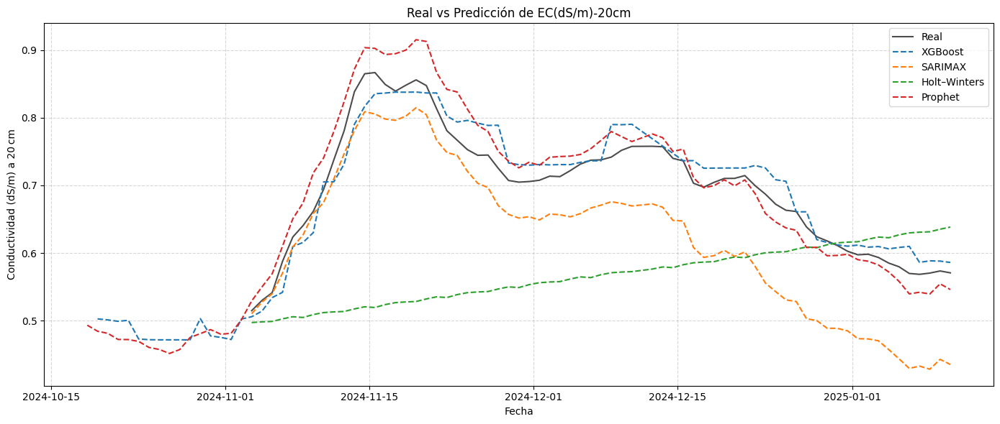

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection   import train_test_split
from sklearn.preprocessing    import StandardScaler
from sklearn.metrics          import mean_squared_error, r2_score
from xgboost                  import XGBRegressor

import statsmodels.api         as sm
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from prophet                  import Prophet

# 1) Carga y preparación
# ----------------------
df = pd.read_excel('/content/DB_CropX_Aguacate.xlsx', sheet_name='CropX_BA29')
df['Fecha_Hora'] = pd.to_datetime(df['Fecha_Hora'])
df = df.set_index('Fecha_Hora').sort_index().asfreq('D')
target = 'EC(dS/m)-20cm'

# 2) Split cronológico 70/30
# --------------------------
split = int(len(df) * 0.7)
train_df = df.iloc[:split].copy()
test_df  = df.iloc[split:].copy()

# 3) Preparar lag‑features para XGBoost
# -------------------------------------
def make_lag_features(df, lags=[1,2,3,7]):
    X = pd.DataFrame(index=df.index)
    # Lags de conductividad a 20cm
    for lag in lags:
        X[f'{target}_lag{lag}'] = df[target].shift(lag)
    # Lags de otras variables relevantes
    for col in ['VWC-20cm','Temp(C)-20cm','VWC-41cm']:
        X[f'{col}_lag1'] = df[col].shift(1)
    return X.dropna()

X_lags = make_lag_features(df)
y_lags = df[target].loc[X_lags.index]

split2 = int(len(X_lags) * 0.7)
X_train, X_test = X_lags.iloc[:split2], X_lags.iloc[split2:]
y_train, y_test = y_lags.iloc[:split2], y_lags.iloc[split2:]
t_test_lags     = X_test.index

# 4) Escalado y limpieza NaN para XGBoost
# ---------------------------------------
scaler = StandardScaler().fit(X_train)
X_train_s = scaler.transform(X_train)
X_test_s  = scaler.transform(X_test)

mask_tr    = np.isfinite(y_train)
X_train_s, y_train = X_train_s[mask_tr], y_train[mask_tr]

mask_te    = np.isfinite(y_test)
X_test_s, y_test, t_test_lags = X_test_s[mask_te], y_test[mask_te], t_test_lags[mask_te]

# 5) Entrenamiento y predicción XGBoost
# --------------------------------------
xgb = XGBRegressor(objective='reg:squarederror', n_estimators=100, random_state=42)
xgb.fit(X_train_s, y_train)
y_pred_xgb = xgb.predict(X_test_s)

rmse_xgb = np.sqrt(mean_squared_error(y_test, y_pred_xgb))
r2_xgb   = r2_score(y_test, y_pred_xgb)

print(f"XGBoost   RMSE: {rmse_xgb:.4f}   R²: {r2_xgb:.4f}")

# 6) SARIMAX con regresores exógenos
# ----------------------------------
exog_cols = ['VWC-20cm','Temp(C)-20cm']
# Limpiar NaN en conjunto de entrenamiento
sar_train = train_df[[target]+exog_cols].dropna()
endog_train = sar_train[target]
exog_train  = sar_train[exog_cols]

# Limpiar NaN en test
sar_test     = test_df[[target]+exog_cols].dropna()
y_test_sar   = sar_test[target].values
exog_test    = sar_test[exog_cols]

sar = sm.tsa.statespace.SARIMAX(
    endog_train,
    exog=exog_train,
    order=(1,0,1),
    seasonal_order=(1,0,1,7),
    enforce_stationarity=False,
    enforce_invertibility=False
).fit(disp=False)

fc_sar     = sar.get_forecast(steps=len(exog_test), exog=exog_test)
y_pred_sar = fc_sar.predicted_mean.values

rmse_sar = np.sqrt(mean_squared_error(y_test_sar, y_pred_sar))
r2_sar   = r2_score(y_test_sar, y_pred_sar)

print(f"SARIMAX   RMSE: {rmse_sar:.4f}   R²: {r2_sar:.4f}")

# 7) Holt–Winters (suavizado triple semanal)
# ------------------------------------------
hw = ExponentialSmoothing(
    endog_train,
    trend='add',
    seasonal='add',
    seasonal_periods=7
).fit()
y_pred_hw = hw.forecast(len(sar_test))

rmse_hw = np.sqrt(mean_squared_error(y_test_sar, y_pred_hw))
r2_hw   = r2_score(y_test_sar, y_pred_hw)

print(f"Holt–Winters RMSE: {rmse_hw:.4f}   R²: {r2_hw:.4f}")

# 8) Prophet con regresores
# --------------------------
prophet_df = df.reset_index()[['Fecha_Hora', target]+exog_cols]\
               .rename(columns={'Fecha_Hora':'ds', target:'y'})\
               .dropna()
split_prop = int(len(prophet_df)*0.7)

m = Prophet()
for col in exog_cols:
    m.add_regressor(col)
m.fit(prophet_df.iloc[:split_prop])

future     = prophet_df[['ds']+exog_cols].iloc[split_prop:]
y_test_pr  = prophet_df['y'].iloc[split_prop:].values
fc_pr      = m.predict(future)
y_pred_pr  = fc_pr['yhat'].values

rmse_pr = np.sqrt(mean_squared_error(y_test_pr, y_pred_pr))
r2_pr   = r2_score(y_test_pr, y_pred_pr)

print(f"Prophet   RMSE: {rmse_pr:.4f}   R²: {r2_pr:.4f}")

# 9) Comparativa y gráfica
# -------------------------
results = pd.DataFrame([
    ['XGBoost',      rmse_xgb, r2_xgb],
    ['SARIMAX',      rmse_sar, r2_sar],
    ['Holt–Winters', rmse_hw,  r2_hw],
    ['Prophet',      rmse_pr,  r2_pr]
], columns=['Modelo','RMSE','R2']).set_index('Modelo')

print("\nComparativa de modelos:\n", results)

plt.figure(figsize=(14,6))
plt.plot(sar_test.index, y_test_sar, 'k-', label='Real', alpha=0.7)
plt.plot(t_test_lags,     y_pred_xgb, '--', label='XGBoost')
plt.plot(sar_test.index,  y_pred_sar, '--', label='SARIMAX')
plt.plot(sar_test.index,  y_pred_hw,  '--', label='Holt–Winters')
plt.plot(future['ds'],    y_pred_pr,  '--', label='Prophet')

plt.xlabel('Fecha')
plt.ylabel('Conductividad (dS/m) a 20 cm')
plt.title('Real vs Predicción de EC(dS/m)-20cm')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


In [ ]:
pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 395.9/395.9 kB 8.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 247.0/247.0 kB 16.3 MB/s eta 0:00:00


#Optuna

[I 2025-07-15 16:39:39,789] A new study created in memory with name: no-name-a3920976-0a81-4a86-beb6-fc6e129467b6
[I 2025-07-15 16:39:46,522] Trial 0 finished with value: 0.770119493567338 and parameters: {'n_estimators': 390, 'max_depth': 8, 'learning_rate': 0.0083378476506066, 'subsample': 0.561722452173816, 'colsample_bytree': 0.8185928570462047, 'gamma': 0.9529450171396814, 'reg_alpha': 2.1529737996457765, 'reg_lambda': 0.43026103629728085}. Best is trial 0 with value: 0.770119493567338.
[I 2025-07-15 16:39:47,224] Trial 1 finished with value: 1.049857272505356 and parameters: {'n_estimators': 268, 'max_depth': 12, 'learning_rate': 0.001883813753208009, 'subsample': 0.8288795462230918, 'colsample_bytree': 0.9125869824100119, 'gamma': 3.1752466400099895, 'reg_alpha': 2.5759878621658343, 'reg_lambda': 4.7456421359585015}. Best is trial 0 with value: 0.770119493567338.
[I 2025-07-15 16:39:48,418] Trial 2 finished with value: 0.8952392818928796 and parameters: {'n_estimators': 475, 'ma

Mejores hiperparámetros: {'n_estimators': 500, 'max_depth': 10, 'learning_rate': 0.09332087828010519, 'subsample': 0.76373320616129, 'colsample_bytree': 0.9347008777244367, 'gamma': 0.5790676244448348, 'reg_alpha': 0.006336664874633621, 'reg_lambda': 3.1974157594036803}
Mejor RMSE (CV): 0.6645086002590406
RMSE en test con Optuna: 0.1959
R² en test con Optuna:   0.5900


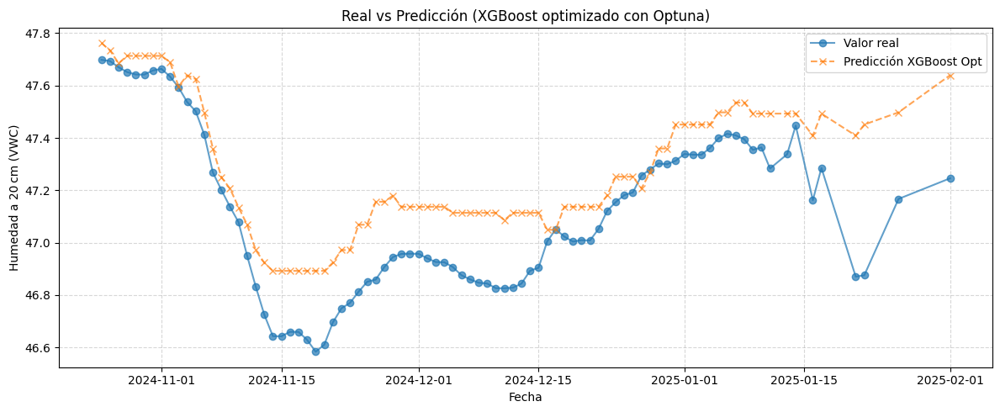

In [ ]:
import optuna
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection   import train_test_split, cross_val_score
from sklearn.preprocessing    import StandardScaler
from sklearn.metrics          import mean_squared_error, r2_score
from xgboost                  import XGBRegressor

# --- 1) Preparamos los datos (igual que antes) ---
X_full = pd.concat([medias_h29, medias_t29, medias_ec29], axis=1).dropna()
time_full = X_full.index
y_full    = X_full['VWC-20cm'].values
X_full    = X_full.drop(columns=['VWC-20cm']).values

# Split cronológico sin barajar
X_train, X_test, y_train, y_test, t_train, t_test = train_test_split(
    X_full, y_full, time_full,
    test_size=0.3,
    shuffle=False,
    random_state=42
)

# Escalado
scaler    = StandardScaler().fit(X_train)
X_train_s = scaler.transform(X_train)
X_test_s  = scaler.transform(X_test)

# --- 2) Definimos la función objetivo para Optuna ---
def objective(trial):
    params = {
        'n_estimators':    trial.suggest_int('n_estimators', 50, 500),
        'max_depth':       trial.suggest_int('max_depth', 3, 12),
        'learning_rate':   trial.suggest_float('learning_rate', 1e-3, 0.3, log=True),
        'subsample':       trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree':trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'gamma':           trial.suggest_float('gamma', 0.0, 5.0),
        'reg_alpha':       trial.suggest_float('reg_alpha', 0.0, 5.0),
        'reg_lambda':      trial.suggest_float('reg_lambda', 0.0, 5.0),
        'objective':      'reg:squarederror',
        'random_state':    42,
        'n_jobs':         -1
    }
    model = XGBRegressor(**params)
    # Validación cruzada en train
    scores = cross_val_score(
        model, X_train_s, y_train,
        cv=5,
        scoring='neg_mean_squared_error',
        n_jobs=-1
    )
    rmse = np.sqrt(-scores).mean()
    return rmse

# --- 3) Ejecutamos el estudio Optuna ---
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=50)

print("Mejores hiperparámetros:", study.best_params)
print("Mejor RMSE (CV):", study.best_value)

# --- 4) Reentrenamos con el mejor conjunto sobre todo el train y evaluamos en test ---
best_params = study.best_params
best_model  = XGBRegressor(**best_params,
                           objective='reg:squarederror',
                           random_state=42,
                           n_jobs=-1)
best_model.fit(X_train_s, y_train)

# Predicción en test
y_pred = best_model.predict(X_test_s)

rmse_test = np.sqrt(mean_squared_error(y_test, y_pred))
r2_test   = r2_score(y_test, y_pred)
print(f"RMSE en test con Optuna: {rmse_test:.4f}")
print(f"R² en test con Optuna:   {r2_test:.4f}")

# --- 5) Gráfica Real vs Predicción con las fechas verdaderas ---
plt.figure(figsize=(12,5))
plt.plot(t_test, y_test, 'o-',  label='Valor real',           alpha=0.7)
plt.plot(t_test, y_pred, 'x--', label='Predicción XGBoost Opt', alpha=0.7)
plt.xlabel('Fecha')
plt.ylabel('Humedad a 20 cm (VWC)')
plt.title('Real vs Predicción (XGBoost optimizado con Optuna)')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


[I 2025-07-15 16:58:34,403] A new study created in memory with name: no-name-b67a45ed-19d1-4e5b-9295-a596be2219b4
[I 2025-07-15 16:58:34,711] Trial 0 finished with value: 0.4584400914683786 and parameters: {'n_estimators': 312, 'max_depth': 8, 'learning_rate': 0.007075922890000384, 'subsample': 0.5364665100929, 'colsample_bytree': 0.6237885484654541, 'gamma': 2.718865704070797, 'reg_alpha': 3.6992577192798253, 'reg_lambda': 1.8326928712373813}. Best is trial 0 with value: 0.4584400914683786.
[I 2025-07-15 16:58:35,064] Trial 1 finished with value: 0.4313858403200183 and parameters: {'n_estimators': 445, 'max_depth': 5, 'learning_rate': 0.0638509895682928, 'subsample': 0.8993386119713813, 'colsample_bytree': 0.9374133067880255, 'gamma': 4.752892022655331, 'reg_alpha': 1.2570442388142071, 'reg_lambda': 2.1160998506399773}. Best is trial 1 with value: 0.4313858403200183.
[I 2025-07-15 16:58:35,485] Trial 2 finished with value: 0.47509913608618676 and parameters: {'n_estimators': 491, 'max

Mejores hiperparámetros: {'n_estimators': 116, 'max_depth': 11, 'learning_rate': 0.04676100940674631, 'subsample': 0.839277067894217, 'colsample_bytree': 0.9601077923342142, 'gamma': 0.019591473273986026, 'reg_alpha': 2.3703700272099697, 'reg_lambda': 2.196664329769798}
Mejor RMSE (CV): 0.36085898027708396
Test RMSE: 0.0374
Test R²:   0.8747


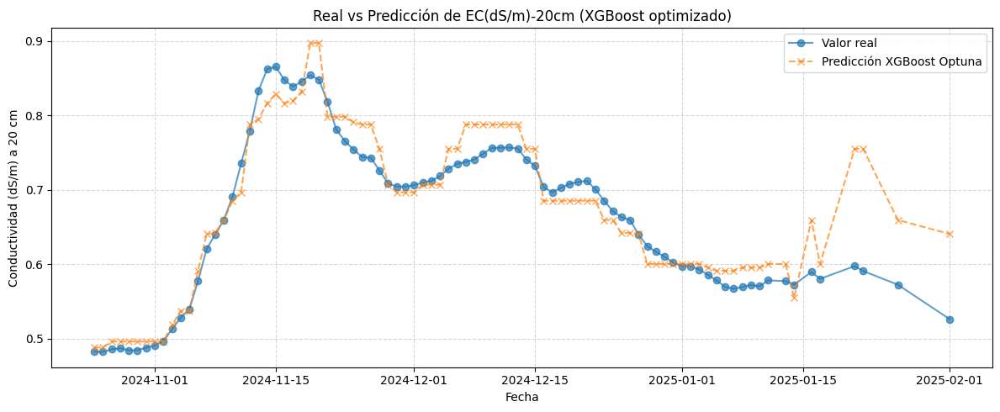

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection   import train_test_split, cross_val_score
from sklearn.preprocessing    import StandardScaler
from sklearn.metrics          import mean_squared_error, r2_score
from xgboost                  import XGBRegressor
import optuna


X_full = pd.concat([medias_h29, medias_t29, medias_ec29], axis=1).dropna()
time_full = X_full.index
y_full    = X_full['EC(dS/m)-20cm'].values
X_full    = X_full.drop(columns=['EC(dS/m)-20cm']).values

# 2) División train/test cronológico (sin barajar)
X_train, X_test, y_train, y_test, t_train, t_test = train_test_split(
    X_full, y_full, time_full,
    test_size=0.3,
    shuffle=False,
    random_state=42
)

# 3) Escalado de características
scaler    = StandardScaler().fit(X_train)
X_train_s = scaler.transform(X_train)
X_test_s  = scaler.transform(X_test)

# 4) Definición de la función objetivo para Optuna
def objective(trial):
    params = {
        'n_estimators':    trial.suggest_int('n_estimators', 50, 500),
        'max_depth':       trial.suggest_int('max_depth', 3, 12),
        'learning_rate':   trial.suggest_float('learning_rate', 1e-3, 0.3, log=True),
        'subsample':       trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree':trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'gamma':           trial.suggest_float('gamma', 0.0, 5.0),
        'reg_alpha':       trial.suggest_float('reg_alpha', 0.0, 5.0),
        'reg_lambda':      trial.suggest_float('reg_lambda', 0.0, 5.0),
        'objective':       'reg:squarederror',
        'random_state':    42,
        'n_jobs':         -1
    }
    model = XGBRegressor(**params)
    scores = cross_val_score(
        model, X_train_s, y_train,
        cv=5,
        scoring='neg_mean_squared_error',
        n_jobs=-1
    )
    return np.sqrt(-scores).mean()

# 5) Ejecutar el estudio Optuna
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=50)

print("Mejores hiperparámetros:", study.best_params)
print("Mejor RMSE (CV):", study.best_value)

# 6) Reentrenar con los mejores hiperparámetros
best_params = study.best_params
best_model  = XGBRegressor(**best_params,
                           objective='reg:squarederror',
                           random_state=42,
                           n_jobs=-1)
best_model.fit(X_train_s, y_train)

# 7) Predicción y evaluación en test
y_pred = best_model.predict(X_test_s)
rmse_test = np.sqrt(mean_squared_error(y_test, y_pred))
r2_test   = r2_score(y_test, y_pred)

print(f"Test RMSE: {rmse_test:.4f}")
print(f"Test R²:   {r2_test:.4f}")

# 8) Gráfica de resultados
plt.figure(figsize=(12,5))
plt.plot(t_test, y_test, 'o-',  label='Valor real', alpha=0.7)
plt.plot(t_test, y_pred, 'x--', label='Predicción XGBoost Optuna', alpha=0.7)
plt.xlabel('Fecha')
plt.ylabel('Conductividad (dS/m) a 20 cm')
plt.title('Real vs Predicción de EC(dS/m)-20cm (XGBoost optimizado)')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()
